# Getting the embeddings

> This notebook gets the embeddings (or latent space) from a multivariate time series 
given by a encoder (e.g., autoencoder).

In [1]:
# Input parameters
model_patch_size = 8
verbose          = 0
reset_kernel     = False

In [2]:
# Imports
from dvats.all import *
from tsai.data.preparation import SlidingWindow
from fastcore.all import *
import wandb
wandb_api = wandb.Api()
from yaml import load, FullLoader
import dvats.utils as ut
from dvats.imports import beep

/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/aeon/base/__init__.py:24: FutureWarning: The aeon package will soon be releasing v1.0.0 with the removal of legacy modules and interfaces such as BaseTransformer and BaseForecaster. This will contain breaking changes. See aeon-toolkit.org for more information. Set aeon.AEON_DEPRECATION_WARNING or the AEON_DEPRECATION_WARNING environmental variable to 'False' to disable this warning.
  warnings.warn(



Octave is ready <oct2py.core.Oct2Py object at 0x7f1561626b60>

















In [3]:
import torch
torch.cuda.set_device(0)

## Config parameters
> Configuration parameters are obtained from 'config\03-embeddings.yaml'

### Get configuration artifact

In [4]:
config, job_type = get_artifact_config_embeddings(verbose = 0)

In [5]:
dvats.config.show_attrdict(config)

use_wandb: True
wandb_group: embeddings
wandb_entity: mi-santamaria
wandb_project: deepvats
enc_artifact: mi-santamaria/deepvats/zeroshot-moment-small-embedding:latest
input_ar: None
cpu: False


### Show configuration artifact

### Get the model from W&B
> Restore the encoder model and its associated configuration

In [6]:
entity = os.environ.get("WANDB_ENTITY")
project = os.environ.get("WANDB_PROJECT")

folder = entity+'/'+project+'/'
model_family = 'zeroshot-moment'
task = 'embedding'
dataset = 'gtrends_kohls'
dataset_version = 'v2'
enc_artifact_dataset = folder + dataset + ':' + dataset_version
enc_artifact_small = folder + model_family + '-small-' + task + ':v0'
enc_artifact_base  =  folder + model_family + '-base-' + task + ':v0'
enc_artifact_large = folder + model_family + '-large-' + task + ':v0'

In [7]:
print("Getting dataset artifact: ", enc_artifact_dataset)
df_artifact = wandb_api.artifact(enc_artifact_dataset, type = 'dataset')
print("Getting small artifact: ", enc_artifact_small)
enc_artifact_small = wandb_api.artifact(enc_artifact_small, type='learner')
print("Getting base artifact: ", enc_artifact_base)
enc_artifact_base  = wandb_api.artifact(enc_artifact_base, type='learner')
print("Getting large artifact: ", enc_artifact_large)
enc_artifact_large = wandb_api.artifact(enc_artifact_large, type='learner')

Getting dataset artifact:  mi-santamaria/deepvats/gtrends_kohls:v2
Getting small artifact:  mi-santamaria/deepvats/zeroshot-moment-small-embedding:v0
Getting base artifact:  mi-santamaria/deepvats/zeroshot-moment-base-embedding:v0
Getting large artifact:  mi-santamaria/deepvats/zeroshot-moment-large-embedding:v0


In [8]:
print(df_artifact.name)
df = df_artifact.to_df()
display(df.head)
print(df.shape)

gtrends_kohls:v2


wandb:   1 of 1 files downloaded.  


<bound method NDFrame.head of               volume
2004-01-01  0.010417
2004-01-08  0.010417
2004-01-15  0.010417
2004-01-22  0.000000
2004-01-29  0.000000
...              ...
2012-05-03  0.322917
2012-05-10  0.312500
2012-05-17  0.281250
2012-05-24  0.291667
2012-05-31  0.322917

[440 rows x 1 columns]>

(440, 1)


In [9]:
print(enc_artifact_small.name)
enc_learner_small = enc_artifact_small.to_obj()

zeroshot-moment-small-embedding:v0


wandb: Downloading large artifact zeroshot-moment-small-embedding:v0, 144.63MB. 1 files... 
wandb:   1 of 1 files downloaded.  
Done. 0:0:0.4


In [10]:
print(enc_artifact_base.name)
enc_learner_base  = enc_artifact_base.to_obj()

zeroshot-moment-base-embedding:v0


wandb: Downloading large artifact zeroshot-moment-base-embedding:v0, 432.97MB. 1 files... 
wandb:   1 of 1 files downloaded.  
Done. 0:0:1.3


In [11]:
print(enc_artifact_large.name)
enc_learner_large = enc_artifact_large.to_obj()

zeroshot-moment-large-embedding:v0


wandb: Downloading large artifact zeroshot-moment-large-embedding:v0, 1321.42MB. 1 files... 
wandb:   1 of 1 files downloaded.  
Done. 0:0:3.9


In [12]:
def count_parameters(model):
    #return sum(p.numel() for p in model.parameters() if p.requires_grad)
    return sum(p.numel() for p in model.parameters())
print(count_parameters(enc_learner_small))
print(count_parameters(enc_learner_base))
print(count_parameters(enc_learner_large))

35341512
109641608
341248520


In [13]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters())
count_parameters(enc_learner_large)

341248520

In [14]:
from fastai.losses import MSELossFlat
from dvats.encoder import MAELossFlat, EvalMSE, EvalRMSE, EvalMAE, EvalSMAPE

In [15]:
enc_input, _ = SlidingWindow(window_len=17, stride=2, get_y=[])(df)
enc_input.shape

(212, 1, 17)

In [16]:
#| export
import dvats.config as cfg_

In [17]:
user, project, version, data, config, job_type = cfg_.get_artifact_config_MVP(False)

In [18]:
print(config['batch_size'])
print(config['r'])
print(config['analysis_mode'])

16
0.4
online


In [22]:
common_args = {
    "X": df,
    "stride": 1,
    "batch_size": config['batch_size'],
    "cpu": False,
    "to_numpy": False,
    "time_flag": True,
    "n_windows": None,
    "n_windows_percent": None,
    "shot": True,
    "eval_pre": True,
    "eval_post": True,
    "lr": config['r'], #use enc_run lr,
    "lr_scheduler_flag": False,
    "lr_scheduler_name": "cosine_with_restarts",
    "lr_scheduler_num_warmup_steps": None,
    "window_sizes": None,
    "full_dataset": True,
    "window_sizes_offset": 0.05,
    "windows_min_distance": int(np.ceil(2.5*enc_input.shape[0]/100)),
    "print_to_path": False,
    "print_path": "~/data/logs.txt",
    "print_mode": "w",
    "use_moment_masks": False,
    "mask_stateful": config['mask_stateful'],
    "mask_future": config['mask_future'],
    "mask_sync": config['mask_sync'],
    "analysis_mode": config['analysis_mode'],
    "use_wandb": config['use_wandb'],
    "norm_by_sample": config['norm_by_sample'],
    "norm_use_single_batch": config['norm_use_single_batch'],
    "show_plot": True,
    "metrics": [EvalMSE, EvalRMSE, EvalMAE, EvalSMAPE],
    "metrics_args": [{'squared': False}, {'squared': True}, {}, {}],
    "metrics_names":["mse", "rmse", "mae", "smape"],
    "metrics_dict": None
}

In [29]:
import pandas as pd

In [36]:
from copy import deepcopy

In [203]:
def cases_loop(model, n_epochs_list, dataset_percents, masked_percents, n_sizes_list, summarized = True, do_beep = True, verbose = 1):
    mssg = ut.Mssg(verbose = verbose, level = -1)
    result_columns = ['model_size','n_epochs','dataset_percent','masked_percent','n_windows', 'time','first_loss','first_mse','first_rmse','first_mae','first_smape', 'last_loss','last_mse','last_rmse','last_mae','last_smape']
    result_columns = result_columns if summarized else result_columns + ['losses','eval_results_pre','eval_results_post']
    results = pd.DataFrame(columns = result_columns)

    errors = pd.DataFrame(
        columns = [
            'model_size',
            'n_epochs',
            'dataset_percent',
            'masked_percent',
            'n_windows',
            'error'
        ]
    )
    model_backup = deepcopy(model)
    i = 0
    for n_epochs in n_epochs_list:
        for dataset_percent in dataset_percents:
            for masked_percent in masked_percents:
                for sizes in n_sizes_list:
                    print(f"--> epoch {n_epochs}, dataset_percent {dataset_percent}, mask {masked_percent}")
                    print(f" sizes {sizes}")
                    model_case = deepcopy(model_backup)
                    case = {
                            'model_size': "small",
                            'n_epochs': n_epochs,
                            'dataset_percent': dataset_percent,
                            'masked_percent': masked_percent,
                            'n_windows': sizes,
                            'windows': None
                           }
                    result_dict = deepcopy(case)
                    error_dict = deepcopy(case)
                    error = False
                    result = fine_tune(
                        enc_learn           = model_case,
                        window_mask_percent = masked_percent,
                        training_percent    = dataset_percent,
                        validation_percent  = 1-dataset_percent if 1-dataset_percent != 0 else 0.3,
                        num_epochs          = n_epochs,
                        n_window_sizes      = sizes,
                        verbose             = 0,
                        register_errors     = True,
                        **common_args    
                    )
                    internal_errors = result[9]
                    if len(result[0]) > 0:
                        result_dict.update({
                            'time'             : result[4],
                            'windows'          : result[8],
                            'first_loss'       : result[0][0][0],
                            'last_loss'        : result[0][-1][-1],
                            'first_mse'        : result[1]['mse'],
                            'last_mse'         : result[2]['mse'][-1],
                            'first_rmse'       : result[1]['rmse'],
                            'last_rmse'        : result[2]['rmse'][-1],
                            'first_mae'        : result[1]['mae'],
                            'last_mae'         : result[2]['mae'][-1],
                            'first_smape'      : result[1]['smape'],
                            'last_smape'       : result[2]['smape'][-1]
                        })
                        if not summarized:
                          result_dict.update({
                            'losses'           : result[0],
                            'eval_results_pre' : result[1],
                            'eval_results_post': result[2],
                        })  
                        results = pd.concat([results, pd.DataFrame([result_dict])], ignore_index=True)
                    else:
                        print("Failed case")
                    if (mssg.verbose > mssg.level): display(internal_errors)
                    # Attach possible errors
                    internal_errors['model_size'] = case['model_size']
                    internal_errors['n_epochs'] = case['n_epochs']
                    internal_errors['dataset_percent'] = case['dataset_percent']
                    internal_errors['masked_percent'] = case['masked_percent']
                    mssg.print(len(internal_errors))
                    internal_errors['windows'] = [result[8]]*len(internal_errors)
                    errors = pd.concat([errors, internal_errors])
                    if not error: mssg.print_error(f" case {case} | time: {result[4]}")
                    if do_beep:
                        beep(1)
                    mssg.print(f"epoch {n_epochs}, dataset_percent {dataset_percent}, mask {masked_percent}, sizes {sizes} -->")
                if do_beep:
                    beep(2)
                    beep(2)
                mssg.print(f"epoch {n_epochs}, dataset_percent {dataset_percent}, mask {masked_percent} -->")
            if do_beep:
                beep(3)
                beep(3)
                beep(3)
            mssg.print(f"epoch {n_epochs}, dataset_percent {dataset_percent}-->")
        if do_beep:
            beep(4)
            beep(4)
            beep(4)
            beep(4)
        mssg.print(f"epoch {n_epochs}-->")
    if do_beep:
        beep(1000)
        beep(1000)
        beep(1000)
        beep(1000)
        beep(1000)
    return results, errors

# Analysis

## Defining full reasonable values

In [32]:
n_epochs_list     = [5, 10, 20, 40, 80, 100]
dataset_percents  = [0.25, 0.5, 0.75, 1] # No tendría sentido porque sería como hacer lo mismo que con mvp
masked_percents = [0.25, 0.5, 0.75]
sizes             = [1, 5, 10, 15, 20]
print(f"Total cases: {len(n_epochs_list)*len(dataset_percents)*len(masked_percents)*len(sizes)}")

Total cases: 360


### Moment-Small
Getting the results for moment small.

In [ ]:
results_small, errors_small = cases_loop(model = enc_learner_small, n_epochs_list = n_epochs_list, dataset_percents = dataset_percents, masked_percents = masked_percents, n_sizes_list = sizes, summarized = True)

--> epoch 5, dataset_percent 0.25, mask 0.25
 sizes 1
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/1


100% 20/20 [00:01<00:00, 11.45it/s]
100% 35/35 [00:00<00:00, 40.77it/s]
100% 20/20 [00:01<00:00, 11.42it/s]


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows


[1]  [ cases_loop ] 0
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.25, 'masked_percent': 0.25, 'n_windows': 1, 'windows': None} | time: 0.8609766960144043


[1]  [ cases_loop ] epoch 5, dataset_percent 0.25, mask 0.25, sizes 1 -->
--> epoch 5, dataset_percent 0.25, mask 0.25
 sizes 5
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/5


100% 20/20 [00:01<00:00, 11.41it/s]
100% 35/35 [00:00<00:00, 41.03it/s]
100% 20/20 [00:01<00:00, 11.43it/s]


[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/5


100% 35/35 [00:00<00:00, 42.20it/s]
100% 21/21 [00:01<00:00, 12.27it/s]


0.12958627215880375
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.01699529625988993
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10379539037500236
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6140254037718154
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/5


100% 35/35 [00:00<00:00, 41.01it/s]
100% 20/20 [00:01<00:00, 12.42it/s]


0.05775747115817757
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0034371959473207237
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.03404484401947124
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.2912667097779739
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/5


100% 35/35 [00:00<00:00, 43.19it/s]
100% 21/21 [00:01<00:00, 13.69it/s]


0.0482253757757789
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.002454809814336528
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.026265043253258156
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.24129083247827335
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/5


100% 35/35 [00:00<00:00, 40.56it/s]
100% 20/20 [00:01<00:00, 11.31it/s]


0.12701553506852725
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016761055638642025
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09996227783389638
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.4340200854412581
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows


[1]  [ cases_loop ] 0
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.25, 'masked_percent': 0.25, 'n_windows': 5, 'windows': None} | time: 4.22209906578064


[1]  [ cases_loop ] epoch 5, dataset_percent 0.25, mask 0.25, sizes 5 -->
--> epoch 5, dataset_percent 0.25, mask 0.25
 sizes 10
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/9


100% 20/20 [00:01<00:00, 11.43it/s]
100% 35/35 [00:00<00:00, 41.09it/s]
100% 20/20 [00:01<00:00, 11.45it/s]


[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/9


100% 35/35 [00:00<00:00, 42.94it/s]
100% 21/21 [00:01<00:00, 12.25it/s]


0.12958627215880375
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.01699529625988993
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10379539037500236
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6140254037718154
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/9


100% 35/35 [00:00<00:00, 41.16it/s]
100% 20/20 [00:01<00:00, 12.42it/s]


0.05775747115817757
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0034371959473207237
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.03404484401947124
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.2912667097779739
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/9


100% 35/35 [00:00<00:00, 42.96it/s]
100% 21/21 [00:01<00:00, 13.70it/s]


0.0482253757757789
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.002454809814336528
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.026265043253258156
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.24129083247827335
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/9


100% 35/35 [00:00<00:00, 41.04it/s]
100% 20/20 [00:01<00:00, 11.32it/s]


0.12701553506852725
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016761055638642025
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09996227783389638
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.4340200854412581
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 3 | wlens [17, 10, 16, 8, 19] | i 6/9


  0% 0/35 [00:00<?, ?it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 


 20% 7/35 [00:00<00:00, 62.49it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 


 40% 14/35 [00:00<00:00, 62.64it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 


 60% 21/35 [00:00<00:00, 62.54it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 


 80% 28/35 [00:00<00:00, 62.14it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 


100% 35/35 [00:00<00:00, 62.19it/s]
  0% 0/21 [00:00<?, ?it/s]

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 3 | error: maximum size for tensor at dimension 2 is 3 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 18 | wlens [17, 10, 16, 8, 19, 3] | i 7/9



  0% 0/35 [00:00<?, ?it/s]
 17% 6/35 [00:00<00:00, 49.75it/s]
 34% 12/35 [00:00<00:00, 50.44it/s]
 51% 18/35 [00:00<00:00, 50.79it/s]
 69% 24/35 [00:00<00:00, 50.94it/s]
100% 35/35 [00:00<00:00, 50.61it/s]

  0% 0/20 [00:00<?, ?it/s]
  5% 1/20 [00:01<00:20,  1.05s/it]
 20% 4/20 [00:01<00:03,  4.35it/s]
 35% 7/20 [00:01<00:01,  7.90it/s]
 50% 10/20 [00:01<00:00, 11.35it/s]
 65% 13/20 [00:01<00:00, 14.54it/s]
 80% 16/20 [00:01<00:00, 17.35it/s]
100% 20/20 [00:01<00:00, 11.31it/s]


0.12573584485915978
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016273088214287832
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09885503085425962
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.441708697914137
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 12 | wlens [17, 10, 16, 8, 19, 3, 18] | i 8/9



  0% 0/35 [00:00<?, ?it/s]
 14% 5/35 [00:00<00:00, 42.39it/s]
 29% 10/35 [00:00<00:00, 42.16it/s]
 43% 15/35 [00:00<00:00, 42.35it/s]
 57% 20/35 [00:00<00:00, 42.49it/s]
 71% 25/35 [00:00<00:00, 42.63it/s]
 86% 30/35 [00:00<00:00, 42.71it/s]
100% 35/35 [00:00<00:00, 42.49it/s]

  0% 0/21 [00:00<?, ?it/s]
  5% 1/21 [00:01<00:20,  1.05s/it]
 24% 5/21 [00:01<00:02,  5.46it/s]
 43% 9/21 [00:01<00:01, 10.01it/s]
 62% 13/21 [00:01<00:00, 14.33it/s]
 81% 17/21 [00:01<00:00, 18.12it/s]
100% 21/21 [00:01<00:00, 12.52it/s]


0.12990547759263013
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.017332376007758898
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10394233726323247
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5541604559976079
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 20 | wlens [17, 10, 16, 8, 19, 3, 18, 12] | i 9/9



  0% 0/35 [00:00<?, ?it/s]
 14% 5/35 [00:00<00:00, 40.75it/s]
 29% 10/35 [00:00<00:00, 40.65it/s]
 43% 15/35 [00:00<00:00, 40.65it/s]
 57% 20/35 [00:00<00:00, 40.79it/s]
 71% 25/35 [00:00<00:00, 40.81it/s]
 86% 30/35 [00:00<00:00, 40.85it/s]
100% 35/35 [00:00<00:00, 40.69it/s]

  0% 0/20 [00:00<?, ?it/s]
  5% 1/20 [00:01<00:19,  1.05s/it]
 20% 4/20 [00:01<00:03,  4.39it/s]
 35% 7/20 [00:01<00:01,  8.02it/s]
 50% 10/20 [00:01<00:00, 11.65it/s]
 65% 13/20 [00:01<00:00, 15.03it/s]
 80% 16/20 [00:01<00:00, 17.98it/s]
100% 20/20 [00:01<00:00, 11.59it/s]


0.12477631100831474
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016270506029693925
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09766374804601559
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.383862248990561
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 1
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.25, 'masked_percent': 0.25, 'n_windows': 10, 'windows': None} | time: 7.14990758895874


[1]  [ cases_loop ] epoch 5, dataset_percent 0.25, mask 0.25, sizes 10 -->
--> epoch 5, dataset_percent 0.25, mask 0.25
 sizes 15
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/12



  0% 0/20 [00:00<?, ?it/s]
  5% 1/20 [00:01<00:19,  1.05s/it]
 20% 4/20 [00:01<00:03,  4.36it/s]
 35% 7/20 [00:01<00:01,  7.93it/s]
 50% 10/20 [00:01<00:00, 11.45it/s]
 65% 13/20 [00:01<00:00, 14.66it/s]
 80% 16/20 [00:01<00:00, 17.50it/s]
100% 20/20 [00:01<00:00, 11.39it/s]

  0% 0/35 [00:00<?, ?it/s]
 14% 5/35 [00:00<00:00, 40.71it/s]
 29% 10/35 [00:00<00:00, 40.27it/s]
 43% 15/35 [00:00<00:00, 40.54it/s]
 57% 20/35 [00:00<00:00, 40.73it/s]
 71% 25/35 [00:00<00:00, 40.76it/s]
 86% 30/35 [00:00<00:00, 40.63it/s]
100% 35/35 [00:00<00:00, 40.56it/s]

  0% 0/20 [00:00<?, ?it/s]
  5% 1/20 [00:01<00:19,  1.05s/it]
 20% 4/20 [00:01<00:03,  4.36it/s]
 35% 7/20 [00:01<00:01,  7.94it/s]
 50% 10/20 [00:01<00:00, 11.42it/s]
 65% 13/20 [00:01<00:00, 14.67it/s]
 80% 16/20 [00:01<00:00, 17.52it/s]
100% 20/20 [00:01<00:00, 11.39it/s]


[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/12



  0% 0/35 [00:00<?, ?it/s]
 14% 5/35 [00:00<00:00, 42.37it/s]
 29% 10/35 [00:00<00:00, 41.93it/s]
 43% 15/35 [00:00<00:00, 42.35it/s]
 57% 20/35 [00:00<00:00, 42.58it/s]
 71% 25/35 [00:00<00:00, 42.38it/s]
 86% 30/35 [00:00<00:00, 42.48it/s]
100% 35/35 [00:00<00:00, 42.35it/s]

  0% 0/21 [00:00<?, ?it/s]
  5% 1/21 [00:01<00:20,  1.05s/it]
 19% 4/21 [00:01<00:03,  4.42it/s]
 33% 7/21 [00:01<00:01,  8.14it/s]
 48% 10/21 [00:01<00:00, 11.89it/s]
 62% 13/21 [00:01<00:00, 15.46it/s]
 76% 16/21 [00:01<00:00, 18.64it/s]
100% 21/21 [00:01<00:00, 12.23it/s]


0.12958627215880375
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.01699529625988993
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10379539037500236
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6140254037718154
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/12



  0% 0/35 [00:00<?, ?it/s]
 14% 5/35 [00:00<00:00, 40.44it/s]
 29% 10/35 [00:00<00:00, 40.68it/s]
 43% 15/35 [00:00<00:00, 40.75it/s]
 57% 20/35 [00:00<00:00, 40.86it/s]
 71% 25/35 [00:00<00:00, 40.92it/s]
 86% 30/35 [00:00<00:00, 40.80it/s]
100% 35/35 [00:00<00:00, 40.72it/s]

  0% 0/20 [00:00<?, ?it/s]
  5% 1/20 [00:01<00:19,  1.04s/it]
 25% 5/20 [00:01<00:02,  5.51it/s]
 45% 9/20 [00:01<00:01, 10.16it/s]
 65% 13/20 [00:01<00:00, 14.63it/s]
100% 20/20 [00:01<00:00, 12.35it/s]


0.05775747115817757
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0034371959473207237
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.03404484401947124
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.2912667097779739
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/12



  0% 0/35 [00:00<?, ?it/s]
 14% 5/35 [00:00<00:00, 42.79it/s]
 29% 10/35 [00:00<00:00, 42.84it/s]
 43% 15/35 [00:00<00:00, 42.61it/s]
 57% 20/35 [00:00<00:00, 42.78it/s]
 71% 25/35 [00:00<00:00, 42.83it/s]
 86% 30/35 [00:00<00:00, 42.84it/s]
100% 35/35 [00:00<00:00, 42.71it/s]

  0% 0/21 [00:00<?, ?it/s]
  5% 1/21 [00:01<00:20,  1.04s/it]
 24% 5/21 [00:01<00:02,  5.66it/s]
 43% 9/21 [00:01<00:01, 10.70it/s]
 67% 14/21 [00:01<00:00, 16.80it/s]
100% 21/21 [00:01<00:00, 13.65it/s]


0.0482253757757789
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.002454809814336528
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.026265043253258156
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.24129083247827335
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/12



  0% 0/35 [00:00<?, ?it/s]
 14% 5/35 [00:00<00:00, 40.82it/s]
 29% 10/35 [00:00<00:00, 40.85it/s]
 43% 15/35 [00:00<00:00, 40.92it/s]
 57% 20/35 [00:00<00:00, 41.02it/s]
 71% 25/35 [00:00<00:00, 40.94it/s]
 86% 30/35 [00:00<00:00, 40.96it/s]
100% 35/35 [00:00<00:00, 40.85it/s]

  0% 0/20 [00:00<?, ?it/s]
  5% 1/20 [00:01<00:20,  1.05s/it]
 20% 4/20 [00:01<00:03,  4.34it/s]
 35% 7/20 [00:01<00:01,  7.88it/s]
 50% 10/20 [00:01<00:00, 11.33it/s]
 65% 13/20 [00:01<00:00, 14.50it/s]
 80% 16/20 [00:01<00:00, 17.26it/s]
100% 20/20 [00:01<00:00, 11.29it/s]


0.12701553506852725
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016761055638642025
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09996227783389638
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.4340200854412581
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 3 | wlens [17, 10, 16, 8, 19] | i 6/12



  0% 0/35 [00:00<?, ?it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 



 20% 7/35 [00:00<00:00, 62.51it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 



 40% 14/35 [00:00<00:00, 62.29it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 



 60% 21/35 [00:00<00:00, 62.12it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 



 80% 28/35 [00:00<00:00, 62.08it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 



100% 35/35 [00:00<00:00, 61.83it/s]

  0% 0/21 [00:00<?, ?it/s]

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 3 | error: maximum size for tensor at dimension 2 is 3 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 18 | wlens [17, 10, 16, 8, 19, 3] | i 7/12




  0% 0/35 [00:00<?, ?it/s]

 17% 6/35 [00:00<00:00, 50.86it/s]

 34% 12/35 [00:00<00:00, 51.08it/s]

 51% 18/35 [00:00<00:00, 51.21it/s]

 69% 24/35 [00:00<00:00, 51.24it/s]

100% 35/35 [00:00<00:00, 51.08it/s]


  0% 0/20 [00:00<?, ?it/s]

  5% 1/20 [00:01<00:19,  1.05s/it]

 20% 4/20 [00:01<00:03,  4.36it/s]

 35% 7/20 [00:01<00:01,  7.91it/s]

 50% 10/20 [00:01<00:00, 11.40it/s]

 65% 13/20 [00:01<00:00, 14.62it/s]

 80% 16/20 [00:01<00:00, 17.38it/s]

100% 20/20 [00:01<00:00, 11.34it/s]


0.12573584485915978
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016273088214287832
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09885503085425962
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.441708697914137
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 12 | wlens [17, 10, 16, 8, 19, 3, 18] | i 8/12




  0% 0/35 [00:00<?, ?it/s]

 14% 5/35 [00:00<00:00, 42.80it/s]

 29% 10/35 [00:00<00:00, 42.17it/s]

 43% 15/35 [00:00<00:00, 42.48it/s]

 57% 20/35 [00:00<00:00, 42.69it/s]

 71% 25/35 [00:00<00:00, 42.75it/s]

 86% 30/35 [00:00<00:00, 42.77it/s]

100% 35/35 [00:00<00:00, 42.40it/s]


  0% 0/21 [00:00<?, ?it/s]

  5% 1/21 [00:01<00:20,  1.05s/it]

 24% 5/21 [00:01<00:02,  5.47it/s]

 43% 9/21 [00:01<00:01, 10.03it/s]

 62% 13/21 [00:01<00:00, 14.38it/s]

 81% 17/21 [00:01<00:00, 18.28it/s]

100% 21/21 [00:01<00:00, 12.59it/s]


0.12990547759263013
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.017332376007758898
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10394233726323247
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5541604559976079
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 20 | wlens [17, 10, 16, 8, 19, 3, 18, 12] | i 9/12




  0% 0/35 [00:00<?, ?it/s]

 14% 5/35 [00:00<00:00, 40.56it/s]

 29% 10/35 [00:00<00:00, 40.69it/s]

 43% 15/35 [00:00<00:00, 40.84it/s]

 57% 20/35 [00:00<00:00, 40.98it/s]

 71% 25/35 [00:00<00:00, 40.78it/s]

 86% 30/35 [00:00<00:00, 40.75it/s]

100% 35/35 [00:00<00:00, 40.70it/s]


  0% 0/20 [00:00<?, ?it/s]

  5% 1/20 [00:01<00:19,  1.05s/it]

 20% 4/20 [00:01<00:03,  4.39it/s]

 35% 7/20 [00:01<00:01,  8.04it/s]

 50% 10/20 [00:01<00:00, 11.67it/s]

 65% 13/20 [00:01<00:00, 15.06it/s]

 80% 16/20 [00:01<00:00, 18.06it/s]

100% 20/20 [00:01<00:00, 11.63it/s]


0.12477631100831474
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016270506029693925
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09766374804601559
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.383862248990561
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 5 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20] | i 10/12




  0% 0/35 [00:00<?, ?it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 




 20% 7/35 [00:00<00:00, 62.64it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 




 40% 14/35 [00:00<00:00, 62.34it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 




 60% 21/35 [00:00<00:00, 62.05it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 




 80% 28/35 [00:00<00:00, 62.02it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 




100% 35/35 [00:00<00:00, 61.83it/s]


  0% 0/21 [00:00<?, ?it/s]

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 5 | error: maximum size for tensor at dimension 2 is 5 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 11 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5] | i 11/12





  0% 0/35 [00:00<?, ?it/s]


 17% 6/35 [00:00<00:00, 53.80it/s]


 34% 12/35 [00:00<00:00, 54.08it/s]


 51% 18/35 [00:00<00:00, 54.29it/s]


 69% 24/35 [00:00<00:00, 54.18it/s]


100% 35/35 [00:00<00:00, 54.21it/s]



  0% 0/21 [00:00<?, ?it/s]


  5% 1/21 [00:01<00:20,  1.05s/it]


 19% 4/21 [00:01<00:03,  4.42it/s]


 33% 7/21 [00:01<00:01,  8.13it/s]


 48% 10/21 [00:01<00:00, 11.85it/s]


 62% 13/21 [00:01<00:00, 15.37it/s]


 76% 16/21 [00:01<00:00, 18.50it/s]


100% 21/21 [00:01<00:00, 12.18it/s]


0.13316543574056386
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.01813563709819222
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10711678294613701
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6314274997113636
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 4 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5, 11] | i 12/12





  0% 0/35 [00:00<?, ?it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





 20% 7/35 [00:00<00:00, 62.62it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





 40% 14/35 [00:00<00:00, 62.20it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





 60% 21/35 [00:00<00:00, 62.03it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





 80% 28/35 [00:00<00:00, 62.08it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





100% 35/35 [00:00<00:00, 61.87it/s]



  0% 0/21 [00:00<?, ?it/s]

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 4 | error: maximum size for tensor at dimension 2 is 4 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 3
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.25, 'masked_percent': 0.25, 'n_windows': 15, 'windows': None} | time: 8.982354164123535


[1]  [ cases_loop ] epoch 5, dataset_percent 0.25, mask 0.25, sizes 15 -->
--> epoch 5, dataset_percent 0.25, mask 0.25
 sizes 20
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/12






  0% 0/20 [00:00<?, ?it/s]



  5% 1/20 [00:01<00:20,  1.05s/it]



 20% 4/20 [00:01<00:03,  4.35it/s]



 35% 7/20 [00:01<00:01,  7.93it/s]



 50% 10/20 [00:01<00:00, 11.45it/s]



 65% 13/20 [00:01<00:00, 14.72it/s]



 80% 16/20 [00:01<00:00, 17.57it/s]



100% 20/20 [00:01<00:00, 11.40it/s]




  0% 0/35 [00:00<?, ?it/s]



 14% 5/35 [00:00<00:00, 40.61it/s]



 29% 10/35 [00:00<00:00, 40.60it/s]



 43% 15/35 [00:00<00:00, 40.69it/s]



 57% 20/35 [00:00<00:00, 40.79it/s]



 71% 25/35 [00:00<00:00, 40.83it/s]



 86% 30/35 [00:00<00:00, 40.77it/s]



100% 35/35 [00:00<00:00, 40.43it/s]




  0% 0/20 [00:00<?, ?it/s]



  5% 1/20 [00:01<00:19,  1.05s/it]



 20% 4/20 [00:01<00:03,  4.37it/s]



 35% 7/20 [00:01<00:01,  7.95it/s]



 50% 10/20 [00:01<00:00, 11.47it/s]



 65% 13/20 [00:01<00:00, 14.74it/s]



 80% 16/20 [00:01<00:00, 17.58it/s]



100% 20/20 [00:01<00:00, 11.41it/s]


[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/12






  0% 0/35 [00:00<?, ?it/s]



 14% 5/35 [00:00<00:00, 42.29it/s]



 29% 10/35 [00:00<00:00, 42.56it/s]



 43% 15/35 [00:00<00:00, 42.68it/s]



 57% 20/35 [00:00<00:00, 42.80it/s]



 71% 25/35 [00:00<00:00, 42.38it/s]



 86% 30/35 [00:00<00:00, 42.51it/s]



100% 35/35 [00:00<00:00, 42.46it/s]




  0% 0/21 [00:00<?, ?it/s]



  5% 1/21 [00:01<00:20,  1.05s/it]



 19% 4/21 [00:01<00:03,  4.43it/s]



 33% 7/21 [00:01<00:01,  8.13it/s]



 48% 10/21 [00:01<00:00, 11.86it/s]



 62% 13/21 [00:01<00:00, 15.32it/s]



 76% 16/21 [00:01<00:00, 18.48it/s]



100% 21/21 [00:01<00:00, 12.19it/s]


0.12958627215880375
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.01699529625988993
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10379539037500236
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6140254037718154
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/12






  0% 0/35 [00:00<?, ?it/s]



 14% 5/35 [00:00<00:00, 40.80it/s]



 29% 10/35 [00:00<00:00, 40.81it/s]



 43% 15/35 [00:00<00:00, 40.82it/s]



 57% 20/35 [00:00<00:00, 40.60it/s]



 71% 25/35 [00:00<00:00, 40.68it/s]



 86% 30/35 [00:00<00:00, 40.73it/s]



100% 35/35 [00:00<00:00, 40.65it/s]




  0% 0/20 [00:00<?, ?it/s]



  5% 1/20 [00:01<00:19,  1.05s/it]



 25% 5/20 [00:01<00:02,  5.51it/s]



 45% 9/20 [00:01<00:01, 10.17it/s]



 65% 13/20 [00:01<00:00, 14.65it/s]



100% 20/20 [00:01<00:00, 12.37it/s]


0.05775747115817757
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0034371959473207237
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.03404484401947124
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.2912667097779739
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/12






  0% 0/35 [00:00<?, ?it/s]



 14% 5/35 [00:00<00:00, 42.79it/s]



 29% 10/35 [00:00<00:00, 42.84it/s]



 43% 15/35 [00:00<00:00, 42.88it/s]



 57% 20/35 [00:00<00:00, 42.92it/s]



 71% 25/35 [00:00<00:00, 42.82it/s]



 86% 30/35 [00:00<00:00, 42.79it/s]



100% 35/35 [00:00<00:00, 42.62it/s]




  0% 0/21 [00:00<?, ?it/s]



  5% 1/21 [00:01<00:20,  1.04s/it]



 24% 5/21 [00:01<00:02,  5.67it/s]



 43% 9/21 [00:01<00:01, 10.71it/s]



 67% 14/21 [00:01<00:00, 16.82it/s]



100% 21/21 [00:01<00:00, 13.66it/s]


0.0482253757757789
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.002454809814336528
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.026265043253258156
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.24129083247827335
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/12






  0% 0/35 [00:00<?, ?it/s]



 14% 5/35 [00:00<00:00, 40.71it/s]



 29% 10/35 [00:00<00:00, 40.72it/s]



 43% 15/35 [00:00<00:00, 40.45it/s]



 57% 20/35 [00:00<00:00, 40.63it/s]



 71% 25/35 [00:00<00:00, 40.70it/s]



 86% 30/35 [00:00<00:00, 40.76it/s]



100% 35/35 [00:00<00:00, 40.59it/s]




  0% 0/20 [00:00<?, ?it/s]



  5% 1/20 [00:01<00:19,  1.05s/it]



 20% 4/20 [00:01<00:03,  4.35it/s]



 35% 7/20 [00:01<00:01,  7.88it/s]



 50% 10/20 [00:01<00:00, 11.34it/s]



 65% 13/20 [00:01<00:00, 14.52it/s]



 80% 16/20 [00:01<00:00, 17.23it/s]



100% 20/20 [00:01<00:00, 11.28it/s]


0.12701553506852725
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016761055638642025
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09996227783389638
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.4340200854412581
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 3 | wlens [17, 10, 16, 8, 19] | i 6/12






  0% 0/35 [00:00<?, ?it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 






 20% 7/35 [00:00<00:00, 62.52it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 






 40% 14/35 [00:00<00:00, 62.15it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 






 60% 21/35 [00:00<00:00, 61.98it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 






 80% 28/35 [00:00<00:00, 61.94it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 






100% 35/35 [00:00<00:00, 61.73it/s]




  0% 0/21 [00:00<?, ?it/s]

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 3 | error: maximum size for tensor at dimension 2 is 3 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 18 | wlens [17, 10, 16, 8, 19, 3] | i 7/12







  0% 0/35 [00:00<?, ?it/s]




 17% 6/35 [00:00<00:00, 50.71it/s]




 34% 12/35 [00:00<00:00, 51.01it/s]




 51% 18/35 [00:00<00:00, 51.11it/s]




 69% 24/35 [00:00<00:00, 51.19it/s]




100% 35/35 [00:00<00:00, 51.14it/s]





  0% 0/20 [00:00<?, ?it/s]




  5% 1/20 [00:01<00:19,  1.05s/it]




 20% 4/20 [00:01<00:03,  4.35it/s]




 35% 7/20 [00:01<00:01,  7.90it/s]




 50% 10/20 [00:01<00:00, 11.39it/s]




 65% 13/20 [00:01<00:00, 14.61it/s]




 80% 16/20 [00:01<00:00, 17.43it/s]




100% 20/20 [00:01<00:00, 11.35it/s]


0.12573584485915978
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016273088214287832
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09885503085425962
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.441708697914137
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 12 | wlens [17, 10, 16, 8, 19, 3, 18] | i 8/12







  0% 0/35 [00:00<?, ?it/s]




 14% 5/35 [00:00<00:00, 42.83it/s]




 29% 10/35 [00:00<00:00, 42.60it/s]




 43% 15/35 [00:00<00:00, 42.55it/s]




 57% 20/35 [00:00<00:00, 42.58it/s]




 71% 25/35 [00:00<00:00, 42.62it/s]




 86% 30/35 [00:00<00:00, 42.70it/s]




100% 35/35 [00:00<00:00, 42.58it/s]





  0% 0/21 [00:00<?, ?it/s]




  5% 1/21 [00:01<00:20,  1.05s/it]




 24% 5/21 [00:01<00:02,  5.47it/s]




 43% 9/21 [00:01<00:01, 10.04it/s]




 62% 13/21 [00:01<00:00, 14.39it/s]




 81% 17/21 [00:01<00:00, 18.28it/s]




100% 21/21 [00:01<00:00, 12.58it/s]


0.12990547759263013
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.017332376007758898
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10394233726323247
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5541604559976079
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 20 | wlens [17, 10, 16, 8, 19, 3, 18, 12] | i 9/12







  0% 0/35 [00:00<?, ?it/s]




 14% 5/35 [00:00<00:00, 40.77it/s]




 29% 10/35 [00:00<00:00, 40.75it/s]




 43% 15/35 [00:00<00:00, 40.77it/s]




 57% 20/35 [00:00<00:00, 40.89it/s]




 71% 25/35 [00:00<00:00, 40.91it/s]




 86% 30/35 [00:00<00:00, 40.90it/s]




100% 35/35 [00:00<00:00, 40.78it/s]





  0% 0/20 [00:00<?, ?it/s]




  5% 1/20 [00:01<00:19,  1.05s/it]




 20% 4/20 [00:01<00:03,  4.39it/s]




 35% 7/20 [00:01<00:01,  8.04it/s]




 50% 10/20 [00:01<00:00, 11.67it/s]




 65% 13/20 [00:01<00:00, 15.06it/s]




 80% 16/20 [00:01<00:00, 18.06it/s]




100% 20/20 [00:01<00:00, 11.63it/s]


0.12477631100831474
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016270506029693925
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09766374804601559
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.383862248990561
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 5 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20] | i 10/12







  0% 0/35 [00:00<?, ?it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 







 20% 7/35 [00:00<00:00, 62.62it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 







 40% 14/35 [00:00<00:00, 62.18it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 







 60% 21/35 [00:00<00:00, 61.69it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 







 80% 28/35 [00:00<00:00, 61.59it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 







100% 35/35 [00:00<00:00, 61.50it/s]





  0% 0/21 [00:00<?, ?it/s]

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 5 | error: maximum size for tensor at dimension 2 is 5 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 11 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5] | i 11/12








  0% 0/35 [00:00<?, ?it/s]





 17% 6/35 [00:00<00:00, 53.52it/s]





 34% 12/35 [00:00<00:00, 53.89it/s]





 51% 18/35 [00:00<00:00, 54.04it/s]





 69% 24/35 [00:00<00:00, 53.91it/s]





100% 35/35 [00:00<00:00, 53.86it/s]






  0% 0/21 [00:00<?, ?it/s]





  5% 1/21 [00:01<00:20,  1.05s/it]





 19% 4/21 [00:01<00:03,  4.42it/s]





 33% 7/21 [00:01<00:01,  8.13it/s]





 48% 10/21 [00:01<00:00, 11.86it/s]





 62% 13/21 [00:01<00:00, 15.39it/s]





 76% 16/21 [00:01<00:00, 18.54it/s]





100% 21/21 [00:01<00:00, 12.20it/s]


0.13316543574056386
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.01813563709819222
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10711678294613701
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6314274997113636
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 4 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5, 11] | i 12/12








  0% 0/35 [00:00<?, ?it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 








 20% 7/35 [00:00<00:00, 62.44it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 








 40% 14/35 [00:00<00:00, 62.16it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 








 60% 21/35 [00:00<00:00, 62.05it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 








 80% 28/35 [00:00<00:00, 62.01it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 








100% 35/35 [00:00<00:00, 61.80it/s]






  0% 0/21 [00:00<?, ?it/s]

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 4 | error: maximum size for tensor at dimension 2 is 4 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 3
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.25, 'masked_percent': 0.25, 'n_windows': 20, 'windows': None} | time: 8.994762420654297


[1]  [ cases_loop ] epoch 5, dataset_percent 0.25, mask 0.25, sizes 20 -->
--> epoch 5, dataset_percent 0.25, mask 0.5
 sizes 1
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/1









  0% 0/20 [00:00<?, ?it/s]






  5% 1/20 [00:01<00:20,  1.05s/it]






 20% 4/20 [00:01<00:03,  4.34it/s]






 35% 7/20 [00:01<00:01,  7.89it/s]






 50% 10/20 [00:01<00:00, 11.39it/s]






 65% 13/20 [00:01<00:00, 14.64it/s]






 80% 16/20 [00:01<00:00, 17.47it/s]






100% 20/20 [00:01<00:00, 11.35it/s]







  0% 0/35 [00:00<?, ?it/s]






 14% 5/35 [00:00<00:00, 40.59it/s]






 29% 10/35 [00:00<00:00, 40.60it/s]






 43% 15/35 [00:00<00:00, 40.51it/s]






 57% 20/35 [00:00<00:00, 40.50it/s]






 71% 25/35 [00:00<00:00, 40.39it/s]






 86% 30/35 [00:00<00:00, 40.45it/s]






100% 35/35 [00:00<00:00, 40.40it/s]







  0% 0/20 [00:00<?, ?it/s]






  5% 1/20 [00:01<00:19,  1.05s/it]






 20% 4/20 [00:01<00:03,  4.36it/s]






 35% 7/20 [00:01<00:01,  7.89it/s]






 50% 10/20 [00:01<00:00, 11.40it/s]






 65% 13/20 [00:01<00:00, 14.64it/s]






 80% 16/20 [00:01<00:00, 17.46it/s]






100% 20/20 [00:01<00:00, 11.36it/s]


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows


[1]  [ cases_loop ] 0
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.25, 'masked_percent': 0.5, 'n_windows': 1, 'windows': None} | time: 0.8696694374084473


[1]  [ cases_loop ] epoch 5, dataset_percent 0.25, mask 0.5, sizes 1 -->
--> epoch 5, dataset_percent 0.25, mask 0.5
 sizes 5
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/5









  0% 0/20 [00:00<?, ?it/s]






  5% 1/20 [00:01<00:20,  1.05s/it]






 20% 4/20 [00:01<00:03,  4.36it/s]






 35% 7/20 [00:01<00:01,  7.93it/s]






 50% 10/20 [00:01<00:00, 11.45it/s]






 65% 13/20 [00:01<00:00, 14.70it/s]






 80% 16/20 [00:01<00:00, 17.55it/s]






100% 20/20 [00:01<00:00, 11.40it/s]







  0% 0/35 [00:00<?, ?it/s]






 14% 5/35 [00:00<00:00, 40.96it/s]






 29% 10/35 [00:00<00:00, 40.86it/s]






 43% 15/35 [00:00<00:00, 40.90it/s]






 57% 20/35 [00:00<00:00, 40.94it/s]






 71% 25/35 [00:00<00:00, 40.93it/s]






 86% 30/35 [00:00<00:00, 40.85it/s]






100% 35/35 [00:00<00:00, 40.76it/s]







  0% 0/20 [00:00<?, ?it/s]






  5% 1/20 [00:01<00:19,  1.05s/it]






 20% 4/20 [00:01<00:03,  4.36it/s]






 35% 7/20 [00:01<00:01,  7.93it/s]






 50% 10/20 [00:01<00:00, 11.44it/s]






 65% 13/20 [00:01<00:00, 14.69it/s]






 80% 16/20 [00:01<00:00, 17.53it/s]






100% 20/20 [00:01<00:00, 11.39it/s]


[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/5









  0% 0/35 [00:00<?, ?it/s]






 14% 5/35 [00:00<00:00, 42.37it/s]






 29% 10/35 [00:00<00:00, 42.42it/s]






 43% 15/35 [00:00<00:00, 42.43it/s]






 57% 20/35 [00:00<00:00, 42.52it/s]






 71% 25/35 [00:00<00:00, 42.55it/s]






 86% 30/35 [00:00<00:00, 42.57it/s]






100% 35/35 [00:00<00:00, 42.42it/s]







  0% 0/21 [00:00<?, ?it/s]






  5% 1/21 [00:01<00:21,  1.05s/it]






 19% 4/21 [00:01<00:03,  4.41it/s]






 33% 7/21 [00:01<00:01,  8.12it/s]






 48% 10/21 [00:01<00:00, 11.86it/s]






 62% 13/21 [00:01<00:00, 15.38it/s]






 76% 16/21 [00:01<00:00, 18.54it/s]






100% 21/21 [00:01<00:00, 12.19it/s]


0.12958627215880375
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.01699529625988993
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10379539037500236
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6140254037718154
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/5









  0% 0/35 [00:00<?, ?it/s]






 14% 5/35 [00:00<00:00, 40.71it/s]






 29% 10/35 [00:00<00:00, 40.70it/s]






 43% 15/35 [00:00<00:00, 40.69it/s]






 57% 20/35 [00:00<00:00, 40.72it/s]






 71% 25/35 [00:00<00:00, 40.73it/s]






 86% 30/35 [00:00<00:00, 40.73it/s]






100% 35/35 [00:00<00:00, 40.63it/s]







  0% 0/20 [00:00<?, ?it/s]






  5% 1/20 [00:01<00:19,  1.04s/it]






 25% 5/20 [00:01<00:02,  5.51it/s]






 45% 9/20 [00:01<00:01, 10.16it/s]






 65% 13/20 [00:01<00:00, 14.63it/s]






100% 20/20 [00:01<00:00, 12.36it/s]


0.05775747115817757
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0034371959473207237
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.03404484401947124
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.2912667097779739
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/5









  0% 0/35 [00:00<?, ?it/s]






 14% 5/35 [00:00<00:00, 42.52it/s]






 29% 10/35 [00:00<00:00, 42.53it/s]






 43% 15/35 [00:00<00:00, 42.49it/s]






 57% 20/35 [00:00<00:00, 42.57it/s]






 71% 25/35 [00:00<00:00, 42.64it/s]






 86% 30/35 [00:00<00:00, 42.63it/s]






100% 35/35 [00:00<00:00, 42.49it/s]







  0% 0/21 [00:00<?, ?it/s]






  5% 1/21 [00:01<00:20,  1.04s/it]






 24% 5/21 [00:01<00:02,  5.66it/s]






 43% 9/21 [00:01<00:01, 10.71it/s]






 67% 14/21 [00:01<00:00, 16.81it/s]






100% 21/21 [00:01<00:00, 13.65it/s]


0.0482253757757789
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.002454809814336528
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.026265043253258156
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.24129083247827335
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/5









  0% 0/35 [00:00<?, ?it/s]






 14% 5/35 [00:00<00:00, 40.87it/s]






 29% 10/35 [00:00<00:00, 40.80it/s]






 43% 15/35 [00:00<00:00, 40.87it/s]






 57% 20/35 [00:00<00:00, 40.56it/s]






 71% 25/35 [00:00<00:00, 40.62it/s]






 86% 30/35 [00:00<00:00, 40.72it/s]






100% 35/35 [00:00<00:00, 40.64it/s]







  0% 0/20 [00:00<?, ?it/s]






  5% 1/20 [00:01<00:19,  1.05s/it]






 20% 4/20 [00:01<00:03,  4.35it/s]






 35% 7/20 [00:01<00:01,  7.88it/s]






 50% 10/20 [00:01<00:00, 11.34it/s]






 65% 13/20 [00:01<00:00, 14.52it/s]






 80% 16/20 [00:01<00:00, 17.22it/s]






100% 20/20 [00:01<00:00, 11.28it/s]


0.12701553506852725
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016761055638642025
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09996227783389638
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.4340200854412581
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows


[1]  [ cases_loop ] 0
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.25, 'masked_percent': 0.5, 'n_windows': 5, 'windows': None} | time: 4.24782133102417


[1]  [ cases_loop ] epoch 5, dataset_percent 0.25, mask 0.5, sizes 5 -->
--> epoch 5, dataset_percent 0.25, mask 0.5
 sizes 10
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/9









  0% 0/20 [00:00<?, ?it/s]






  5% 1/20 [00:01<00:20,  1.06s/it]






 20% 4/20 [00:01<00:03,  4.35it/s]






 35% 7/20 [00:01<00:01,  7.90it/s]






 50% 10/20 [00:01<00:00, 11.40it/s]






 65% 13/20 [00:01<00:00, 14.62it/s]






 80% 16/20 [00:01<00:00, 17.45it/s]






100% 20/20 [00:01<00:00, 11.35it/s]







  0% 0/35 [00:00<?, ?it/s]






 14% 5/35 [00:00<00:00, 40.41it/s]






 29% 10/35 [00:00<00:00, 40.47it/s]






 43% 15/35 [00:00<00:00, 40.51it/s]






 57% 20/35 [00:00<00:00, 40.51it/s]






 71% 25/35 [00:00<00:00, 40.38it/s]






 86% 30/35 [00:00<00:00, 40.37it/s]






100% 35/35 [00:00<00:00, 40.30it/s]







  0% 0/20 [00:00<?, ?it/s]






  5% 1/20 [00:01<00:19,  1.05s/it]






 20% 4/20 [00:01<00:03,  4.36it/s]






 35% 7/20 [00:01<00:01,  7.93it/s]






 50% 10/20 [00:01<00:00, 11.45it/s]






 65% 13/20 [00:01<00:00, 14.70it/s]






 80% 16/20 [00:01<00:00, 17.54it/s]






100% 20/20 [00:01<00:00, 11.40it/s]


[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/9









  0% 0/35 [00:00<?, ?it/s]






 14% 5/35 [00:00<00:00, 42.37it/s]






 29% 10/35 [00:00<00:00, 42.08it/s]






 43% 15/35 [00:00<00:00, 42.25it/s]






 57% 20/35 [00:00<00:00, 42.40it/s]






 71% 25/35 [00:00<00:00, 42.43it/s]






 86% 30/35 [00:00<00:00, 42.45it/s]






100% 35/35 [00:00<00:00, 42.30it/s]







  0% 0/21 [00:00<?, ?it/s]






  5% 1/21 [00:01<00:20,  1.05s/it]






 19% 4/21 [00:01<00:03,  4.43it/s]






 33% 7/21 [00:01<00:01,  8.14it/s]






 48% 10/21 [00:01<00:00, 11.89it/s]






 62% 13/21 [00:01<00:00, 15.45it/s]






 76% 16/21 [00:01<00:00, 18.58it/s]






100% 21/21 [00:01<00:00, 12.22it/s]


0.12958627215880375
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.01699529625988993
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10379539037500236
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6140254037718154
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/9









  0% 0/35 [00:00<?, ?it/s]






 14% 5/35 [00:00<00:00, 40.65it/s]






 29% 10/35 [00:00<00:00, 40.62it/s]






 43% 15/35 [00:00<00:00, 40.60it/s]






 57% 20/35 [00:00<00:00, 40.71it/s]






 71% 25/35 [00:00<00:00, 40.70it/s]






 86% 30/35 [00:00<00:00, 40.71it/s]






100% 35/35 [00:00<00:00, 40.48it/s]







  0% 0/20 [00:00<?, ?it/s]






  5% 1/20 [00:01<00:19,  1.04s/it]






 25% 5/20 [00:01<00:02,  5.51it/s]






 45% 9/20 [00:01<00:01, 10.17it/s]






 65% 13/20 [00:01<00:00, 14.65it/s]






100% 20/20 [00:01<00:00, 12.37it/s]


0.05775747115817757
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0034371959473207237
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.03404484401947124
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.2912667097779739
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/9









  0% 0/35 [00:00<?, ?it/s]






 14% 5/35 [00:00<00:00, 42.54it/s]






 29% 10/35 [00:00<00:00, 42.51it/s]






 43% 15/35 [00:00<00:00, 42.49it/s]






 57% 20/35 [00:00<00:00, 42.59it/s]






 71% 25/35 [00:00<00:00, 42.57it/s]






 86% 30/35 [00:00<00:00, 42.57it/s]






100% 35/35 [00:00<00:00, 42.45it/s]







  0% 0/21 [00:00<?, ?it/s]






  5% 1/21 [00:01<00:20,  1.04s/it]






 24% 5/21 [00:01<00:02,  5.67it/s]






 43% 9/21 [00:01<00:01, 10.71it/s]






 67% 14/21 [00:01<00:00, 16.81it/s]






100% 21/21 [00:01<00:00, 13.65it/s]


0.0482253757757789
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.002454809814336528
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.026265043253258156
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.24129083247827335
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/9









  0% 0/35 [00:00<?, ?it/s]






 14% 5/35 [00:00<00:00, 40.63it/s]






 29% 10/35 [00:00<00:00, 40.39it/s]






 43% 15/35 [00:00<00:00, 40.46it/s]






 57% 20/35 [00:00<00:00, 40.58it/s]






 71% 25/35 [00:00<00:00, 40.60it/s]






 86% 30/35 [00:00<00:00, 40.60it/s]






100% 35/35 [00:00<00:00, 40.46it/s]







  0% 0/20 [00:00<?, ?it/s]






  5% 1/20 [00:01<00:19,  1.05s/it]






 20% 4/20 [00:01<00:03,  4.34it/s]






 35% 7/20 [00:01<00:01,  7.88it/s]






 50% 10/20 [00:01<00:00, 11.30it/s]






 65% 13/20 [00:01<00:00, 14.46it/s]






 80% 16/20 [00:01<00:00, 17.21it/s]






100% 20/20 [00:01<00:00, 11.27it/s]


0.12701553506852725
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016761055638642025
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09996227783389638
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.4340200854412581
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 3 | wlens [17, 10, 16, 8, 19] | i 6/9









  0% 0/35 [00:00<?, ?it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 









 20% 7/35 [00:00<00:00, 62.19it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 









 40% 14/35 [00:00<00:00, 61.82it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 









 60% 21/35 [00:00<00:00, 61.67it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 









 80% 28/35 [00:00<00:00, 61.46it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 









100% 35/35 [00:00<00:00, 61.22it/s]







  0% 0/21 [00:00<?, ?it/s]

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 3 | error: maximum size for tensor at dimension 2 is 3 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 18 | wlens [17, 10, 16, 8, 19, 3] | i 7/9










  0% 0/35 [00:00<?, ?it/s]







 17% 6/35 [00:00<00:00, 50.44it/s]







 34% 12/35 [00:00<00:00, 50.61it/s]







 51% 18/35 [00:00<00:00, 50.74it/s]







 69% 24/35 [00:00<00:00, 50.81it/s]







100% 35/35 [00:00<00:00, 50.78it/s]








  0% 0/20 [00:00<?, ?it/s]







  5% 1/20 [00:01<00:19,  1.05s/it]







 20% 4/20 [00:01<00:03,  4.35it/s]







 35% 7/20 [00:01<00:01,  7.90it/s]







 50% 10/20 [00:01<00:00, 11.38it/s]







 65% 13/20 [00:01<00:00, 14.58it/s]







 80% 16/20 [00:01<00:00, 17.37it/s]







100% 20/20 [00:01<00:00, 11.32it/s]


0.12573584485915978
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016273088214287832
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09885503085425962
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.441708697914137
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 12 | wlens [17, 10, 16, 8, 19, 3, 18] | i 8/9










  0% 0/35 [00:00<?, ?it/s]







 14% 5/35 [00:00<00:00, 42.47it/s]







 29% 10/35 [00:00<00:00, 42.38it/s]







 43% 15/35 [00:00<00:00, 42.54it/s]







 57% 20/35 [00:00<00:00, 42.69it/s]







 71% 25/35 [00:00<00:00, 42.67it/s]







 86% 30/35 [00:00<00:00, 42.70it/s]







100% 35/35 [00:00<00:00, 42.55it/s]








  0% 0/21 [00:00<?, ?it/s]







  5% 1/21 [00:01<00:20,  1.05s/it]







 24% 5/21 [00:01<00:02,  5.47it/s]







 43% 9/21 [00:01<00:01, 10.04it/s]







 62% 13/21 [00:01<00:00, 14.35it/s]







 81% 17/21 [00:01<00:00, 18.23it/s]







100% 21/21 [00:01<00:00, 12.58it/s]


0.12990547759263013
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.017332376007758898
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10394233726323247
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5541604559976079
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 20 | wlens [17, 10, 16, 8, 19, 3, 18, 12] | i 9/9










  0% 0/35 [00:00<?, ?it/s]







 11% 4/35 [00:00<00:00, 39.98it/s]







 26% 9/35 [00:00<00:00, 40.41it/s]







 40% 14/35 [00:00<00:00, 40.69it/s]







 54% 19/35 [00:00<00:00, 40.70it/s]







 69% 24/35 [00:00<00:00, 40.72it/s]







 83% 29/35 [00:00<00:00, 40.73it/s]







100% 35/35 [00:00<00:00, 40.60it/s]








  0% 0/20 [00:00<?, ?it/s]







  5% 1/20 [00:01<00:19,  1.05s/it]







 20% 4/20 [00:01<00:03,  4.39it/s]







 35% 7/20 [00:01<00:01,  8.04it/s]







 50% 10/20 [00:01<00:00, 11.63it/s]







 65% 13/20 [00:01<00:00, 15.02it/s]







 80% 16/20 [00:01<00:00, 18.03it/s]







100% 20/20 [00:01<00:00, 11.61it/s]


0.12477631100831474
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016270506029693925
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09766374804601559
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.383862248990561
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 1
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.25, 'masked_percent': 0.5, 'n_windows': 10, 'windows': None} | time: 7.228654861450195


[1]  [ cases_loop ] epoch 5, dataset_percent 0.25, mask 0.5, sizes 10 -->
--> epoch 5, dataset_percent 0.25, mask 0.5
 sizes 15
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/12










  0% 0/20 [00:00<?, ?it/s]







  5% 1/20 [00:01<00:20,  1.06s/it]







 20% 4/20 [00:01<00:03,  4.34it/s]







 35% 7/20 [00:01<00:01,  7.89it/s]







 50% 10/20 [00:01<00:00, 11.40it/s]







 65% 13/20 [00:01<00:00, 14.64it/s]







 80% 16/20 [00:01<00:00, 17.48it/s]







100% 20/20 [00:01<00:00, 11.35it/s]








  0% 0/35 [00:00<?, ?it/s]







 11% 4/35 [00:00<00:00, 39.96it/s]







 23% 8/35 [00:00<00:00, 39.35it/s]







 34% 12/35 [00:00<00:00, 39.63it/s]







 49% 17/35 [00:00<00:00, 39.97it/s]







 63% 22/35 [00:00<00:00, 40.17it/s]







 77% 27/35 [00:00<00:00, 40.36it/s]







100% 35/35 [00:00<00:00, 40.17it/s]








  0% 0/20 [00:00<?, ?it/s]







  5% 1/20 [00:01<00:19,  1.05s/it]







 20% 4/20 [00:01<00:03,  4.35it/s]







 35% 7/20 [00:01<00:01,  7.91it/s]







 50% 10/20 [00:01<00:00, 11.41it/s]







 65% 13/20 [00:01<00:00, 14.65it/s]







 80% 16/20 [00:01<00:00, 17.47it/s]







100% 20/20 [00:01<00:00, 11.37it/s]


[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/12










  0% 0/35 [00:00<?, ?it/s]







 14% 5/35 [00:00<00:00, 42.27it/s]







 29% 10/35 [00:00<00:00, 42.11it/s]







 43% 15/35 [00:00<00:00, 42.02it/s]







 57% 20/35 [00:00<00:00, 42.20it/s]







 71% 25/35 [00:00<00:00, 42.28it/s]







 86% 30/35 [00:00<00:00, 42.33it/s]







100% 35/35 [00:00<00:00, 42.15it/s]








  0% 0/21 [00:00<?, ?it/s]







  5% 1/21 [00:01<00:20,  1.05s/it]







 19% 4/21 [00:01<00:03,  4.42it/s]







 33% 7/21 [00:01<00:01,  8.14it/s]







 48% 10/21 [00:01<00:00, 11.88it/s]







 62% 13/21 [00:01<00:00, 15.42it/s]







 76% 16/21 [00:01<00:00, 18.47it/s]







100% 21/21 [00:01<00:00, 12.19it/s]


0.12958627215880375
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.01699529625988993
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10379539037500236
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6140254037718154
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/12










  0% 0/35 [00:00<?, ?it/s]







 14% 5/35 [00:00<00:00, 40.57it/s]







 29% 10/35 [00:00<00:00, 40.50it/s]







 43% 15/35 [00:00<00:00, 40.53it/s]







 57% 20/35 [00:00<00:00, 40.60it/s]







 71% 25/35 [00:00<00:00, 40.55it/s]







 86% 30/35 [00:00<00:00, 40.55it/s]







100% 35/35 [00:00<00:00, 40.43it/s]








  0% 0/20 [00:00<?, ?it/s]







  5% 1/20 [00:01<00:19,  1.05s/it]







 25% 5/20 [00:01<00:02,  5.50it/s]







 45% 9/20 [00:01<00:01, 10.14it/s]







 65% 13/20 [00:01<00:00, 14.60it/s]







100% 20/20 [00:01<00:00, 12.34it/s]


0.05775747115817757
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0034371959473207237
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.03404484401947124
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.2912667097779739
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/12










  0% 0/35 [00:00<?, ?it/s]







 14% 5/35 [00:00<00:00, 42.42it/s]







 29% 10/35 [00:00<00:00, 42.42it/s]







 43% 15/35 [00:00<00:00, 42.45it/s]







 57% 20/35 [00:00<00:00, 42.51it/s]







 71% 25/35 [00:00<00:00, 42.52it/s]







 86% 30/35 [00:00<00:00, 42.52it/s]







100% 35/35 [00:00<00:00, 42.26it/s]








  0% 0/21 [00:00<?, ?it/s]







  5% 1/21 [00:01<00:20,  1.04s/it]







 24% 5/21 [00:01<00:02,  5.66it/s]







 43% 9/21 [00:01<00:01, 10.68it/s]







 62% 13/21 [00:01<00:00, 15.74it/s]







100% 21/21 [00:01<00:00, 13.62it/s]


0.0482253757757789
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.002454809814336528
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.026265043253258156
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.24129083247827335
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/12










  0% 0/35 [00:00<?, ?it/s]







 14% 5/35 [00:00<00:00, 40.39it/s]







 29% 10/35 [00:00<00:00, 40.37it/s]







 43% 15/35 [00:00<00:00, 40.37it/s]







 57% 20/35 [00:00<00:00, 40.49it/s]







 71% 25/35 [00:00<00:00, 40.27it/s]







 86% 30/35 [00:00<00:00, 40.33it/s]







100% 35/35 [00:00<00:00, 40.27it/s]








  0% 0/20 [00:00<?, ?it/s]







  5% 1/20 [00:01<00:19,  1.05s/it]







 20% 4/20 [00:01<00:03,  4.34it/s]







 35% 7/20 [00:01<00:01,  7.87it/s]







 50% 10/20 [00:01<00:00, 11.31it/s]







 65% 13/20 [00:01<00:00, 14.47it/s]







 80% 16/20 [00:01<00:00, 17.22it/s]







100% 20/20 [00:01<00:00, 11.26it/s]


0.12701553506852725
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016761055638642025
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09996227783389638
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.4340200854412581
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 3 | wlens [17, 10, 16, 8, 19] | i 6/12










  0% 0/35 [00:00<?, ?it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 










 20% 7/35 [00:00<00:00, 62.29it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 










 40% 14/35 [00:00<00:00, 61.53it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 










 60% 21/35 [00:00<00:00, 61.61it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 










 80% 28/35 [00:00<00:00, 61.56it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 










100% 35/35 [00:00<00:00, 61.35it/s]








  0% 0/21 [00:00<?, ?it/s]

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 3 | error: maximum size for tensor at dimension 2 is 3 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 18 | wlens [17, 10, 16, 8, 19, 3] | i 7/12











  0% 0/35 [00:00<?, ?it/s]








 17% 6/35 [00:00<00:00, 50.53it/s]








 34% 12/35 [00:00<00:00, 50.76it/s]








 51% 18/35 [00:00<00:00, 50.79it/s]








 69% 24/35 [00:00<00:00, 50.88it/s]








100% 35/35 [00:00<00:00, 50.83it/s]









  0% 0/20 [00:00<?, ?it/s]








  5% 1/20 [00:01<00:19,  1.05s/it]








 20% 4/20 [00:01<00:03,  4.35it/s]








 35% 7/20 [00:01<00:01,  7.88it/s]








 50% 10/20 [00:01<00:00, 11.35it/s]








 65% 13/20 [00:01<00:00, 14.54it/s]








 80% 16/20 [00:01<00:00, 17.31it/s]








100% 20/20 [00:01<00:00, 11.30it/s]


0.12573584485915978
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016273088214287832
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09885503085425962
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.441708697914137
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 12 | wlens [17, 10, 16, 8, 19, 3, 18] | i 8/12











  0% 0/35 [00:00<?, ?it/s]








 14% 5/35 [00:00<00:00, 42.42it/s]








 29% 10/35 [00:00<00:00, 42.42it/s]








 43% 15/35 [00:00<00:00, 42.53it/s]








 57% 20/35 [00:00<00:00, 42.61it/s]








 71% 25/35 [00:00<00:00, 42.43it/s]








 86% 30/35 [00:00<00:00, 42.29it/s]








100% 35/35 [00:00<00:00, 42.28it/s]









  0% 0/21 [00:00<?, ?it/s]








  5% 1/21 [00:01<00:20,  1.05s/it]








 24% 5/21 [00:01<00:02,  5.47it/s]








 43% 9/21 [00:01<00:01, 10.02it/s]








 62% 13/21 [00:01<00:00, 14.34it/s]








 81% 17/21 [00:01<00:00, 18.21it/s]








100% 21/21 [00:01<00:00, 12.56it/s]


0.12990547759263013
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.017332376007758898
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10394233726323247
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5541604559976079
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 20 | wlens [17, 10, 16, 8, 19, 3, 18, 12] | i 9/12











  0% 0/35 [00:00<?, ?it/s]








 14% 5/35 [00:00<00:00, 40.30it/s]








 29% 10/35 [00:00<00:00, 40.32it/s]








 43% 15/35 [00:00<00:00, 40.36it/s]








 57% 20/35 [00:00<00:00, 40.41it/s]








 71% 25/35 [00:00<00:00, 40.44it/s]








 86% 30/35 [00:00<00:00, 40.42it/s]








100% 35/35 [00:00<00:00, 40.31it/s]









  0% 0/20 [00:00<?, ?it/s]








  5% 1/20 [00:01<00:19,  1.05s/it]








 20% 4/20 [00:01<00:03,  4.38it/s]








 35% 7/20 [00:01<00:01,  8.01it/s]








 50% 10/20 [00:01<00:00, 11.63it/s]








 65% 13/20 [00:01<00:00, 15.00it/s]








 80% 16/20 [00:01<00:00, 17.97it/s]








100% 20/20 [00:01<00:00, 11.59it/s]


0.12477631100831474
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016270506029693925
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09766374804601559
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.383862248990561
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 5 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20] | i 10/12











  0% 0/35 [00:00<?, ?it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 











 20% 7/35 [00:00<00:00, 62.10it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 











 40% 14/35 [00:00<00:00, 61.86it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 











 60% 21/35 [00:00<00:00, 61.75it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 











 80% 28/35 [00:00<00:00, 61.85it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 











100% 35/35 [00:00<00:00, 61.57it/s]









  0% 0/21 [00:00<?, ?it/s]

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 5 | error: maximum size for tensor at dimension 2 is 5 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 11 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5] | i 11/12












  0% 0/35 [00:00<?, ?it/s]









 17% 6/35 [00:00<00:00, 52.71it/s]









 34% 12/35 [00:00<00:00, 53.20it/s]









 51% 18/35 [00:00<00:00, 53.41it/s]









 69% 24/35 [00:00<00:00, 53.27it/s]









100% 35/35 [00:00<00:00, 53.05it/s]










  0% 0/21 [00:00<?, ?it/s]









  5% 1/21 [00:01<00:20,  1.05s/it]









 19% 4/21 [00:01<00:03,  4.41it/s]









 33% 7/21 [00:01<00:01,  8.10it/s]









 48% 10/21 [00:01<00:00, 11.80it/s]









 62% 13/21 [00:01<00:00, 15.29it/s]









 76% 16/21 [00:01<00:00, 18.37it/s]









100% 21/21 [00:01<00:00, 12.13it/s]


0.13316543574056386
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.01813563709819222
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10711678294613701
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6314274997113636
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 4 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5, 11] | i 12/12












  0% 0/35 [00:00<?, ?it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 












 20% 7/35 [00:00<00:00, 62.10it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 












 40% 14/35 [00:00<00:00, 61.82it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 












 60% 21/35 [00:00<00:00, 61.52it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 












 80% 28/35 [00:00<00:00, 61.44it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 












100% 35/35 [00:00<00:00, 61.22it/s]










  0% 0/21 [00:00<?, ?it/s]

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 4 | error: maximum size for tensor at dimension 2 is 4 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 3
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.25, 'masked_percent': 0.5, 'n_windows': 15, 'windows': None} | time: 9.063564777374268


[1]  [ cases_loop ] epoch 5, dataset_percent 0.25, mask 0.5, sizes 15 -->
--> epoch 5, dataset_percent 0.25, mask 0.5
 sizes 20
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/12













  0% 0/20 [00:00<?, ?it/s]










  5% 1/20 [00:01<00:20,  1.06s/it]










 20% 4/20 [00:01<00:03,  4.34it/s]










 35% 7/20 [00:01<00:01,  7.88it/s]










 50% 10/20 [00:01<00:00, 11.38it/s]










 65% 13/20 [00:01<00:00, 14.61it/s]










 80% 16/20 [00:01<00:00, 17.46it/s]










100% 20/20 [00:01<00:00, 11.34it/s]











  0% 0/35 [00:00<?, ?it/s]










 11% 4/35 [00:00<00:00, 39.34it/s]










 23% 8/35 [00:00<00:00, 39.63it/s]










 37% 13/35 [00:00<00:00, 40.09it/s]










 51% 18/35 [00:00<00:00, 40.09it/s]










 66% 23/35 [00:00<00:00, 40.15it/s]










 80% 28/35 [00:00<00:00, 40.27it/s]










100% 35/35 [00:00<00:00, 40.10it/s]











  0% 0/20 [00:00<?, ?it/s]










  5% 1/20 [00:01<00:19,  1.05s/it]










 20% 4/20 [00:01<00:03,  4.35it/s]










 35% 7/20 [00:01<00:01,  7.91it/s]










 50% 10/20 [00:01<00:00, 11.39it/s]










 65% 13/20 [00:01<00:00, 14.61it/s]










 80% 16/20

[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/12













  0% 0/35 [00:00<?, ?it/s]










 14% 5/35 [00:00<00:00, 41.88it/s]










 29% 10/35 [00:00<00:00, 42.10it/s]










 43% 15/35 [00:00<00:00, 42.22it/s]










 57% 20/35 [00:00<00:00, 42.33it/s]










 71% 25/35 [00:00<00:00, 42.35it/s]










 86% 30/35 [00:00<00:00, 42.33it/s]










100% 35/35 [00:00<00:00, 42.17it/s]











  0% 0/21 [00:00<?, ?it/s]










  5% 1/21 [00:01<00:20,  1.05s/it]










 19% 4/21 [00:01<00:03,  4.42it/s]










 33% 7/21 [00:01<00:01,  8.13it/s]










 48% 10/21 [00:01<00:00, 11.88it/s]










 62% 13/21 [00:01<00:00, 15.43it/s]










 76% 16/21 [00:01<00:00, 18.59it/s]










100% 21/21 [00:01<00:00, 12.22it/s]


0.12958627215880375
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.01699529625988993
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10379539037500236
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6140254037718154
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/12













  0% 0/35 [00:00<?, ?it/s]










 14% 5/35 [00:00<00:00, 40.41it/s]










 29% 10/35 [00:00<00:00, 39.78it/s]










 43% 15/35 [00:00<00:00, 39.98it/s]










 54% 19/35 [00:00<00:00, 39.75it/s]










 66% 23/35 [00:00<00:00, 39.80it/s]










 80% 28/35 [00:00<00:00, 39.87it/s]










100% 35/35 [00:00<00:00, 39.89it/s]











  0% 0/20 [00:00<?, ?it/s]










  5% 1/20 [00:01<00:19,  1.05s/it]










 25% 5/20 [00:01<00:02,  5.49it/s]










 45% 9/20 [00:01<00:01, 10.14it/s]










 65% 13/20 [00:01<00:00, 14.58it/s]










100% 20/20 [00:01<00:00, 12.33it/s]


0.05775747115817757
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0034371959473207237
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.03404484401947124
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.2912667097779739
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/12













  0% 0/35 [00:00<?, ?it/s]










 14% 5/35 [00:00<00:00, 40.31it/s]










 29% 10/35 [00:00<00:00, 40.30it/s]










 43% 15/35 [00:00<00:00, 40.59it/s]










 57% 20/35 [00:00<00:00, 40.67it/s]










 71% 25/35 [00:00<00:00, 40.86it/s]










 86% 30/35 [00:00<00:00, 40.80it/s]










100% 35/35 [00:00<00:00, 40.50it/s]











  0% 0/21 [00:00<?, ?it/s]










  5% 1/21 [00:01<00:20,  1.04s/it]










 24% 5/21 [00:01<00:02,  5.62it/s]










 43% 9/21 [00:01<00:01, 10.58it/s]










 62% 13/21 [00:01<00:00, 15.59it/s]










100% 21/21 [00:01<00:00, 13.51it/s]


0.0482253757757789
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.002454809814336528
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.026265043253258156
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.24129083247827335
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/12













  0% 0/35 [00:00<?, ?it/s]










 11% 4/35 [00:00<00:00, 36.91it/s]










 23% 8/35 [00:00<00:00, 37.55it/s]










 34% 12/35 [00:00<00:00, 37.59it/s]










 46% 16/35 [00:00<00:00, 38.05it/s]










 57% 20/35 [00:00<00:00, 37.56it/s]










 69% 24/35 [00:00<00:00, 37.64it/s]










 80% 28/35 [00:00<00:00, 37.06it/s]










100% 35/35 [00:00<00:00, 36.24it/s]











  0% 0/20 [00:00<?, ?it/s]










  5% 1/20 [00:01<00:20,  1.07s/it]










 20% 4/20 [00:01<00:03,  4.19it/s]










 35% 7/20 [00:01<00:01,  7.41it/s]










 50% 10/20 [00:01<00:00, 10.44it/s]










 65% 13/20 [00:01<00:00, 13.10it/s]










 80% 16/20 [00:01<00:00, 15.35it/s]










100% 20/20 [00:01<00:00, 10.40it/s]


0.12701553506852725
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016761055638642025
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09996227783389638
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.4340200854412581
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 3 | wlens [17, 10, 16, 8, 19] | i 6/12













  0% 0/35 [00:00<?, ?it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 













 17% 6/35 [00:00<00:00, 52.25it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 













 34% 12/35 [00:00<00:00, 52.17it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 













 51% 18/35 [00:00<00:00, 52.05it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 













 69% 24/35 [00:00<00:00, 51.78it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 













 86% 30/35 [00:00<00:00, 51.89it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 


100% 35/35 [00:00<00:00, 51.93it/s]











  0% 0/21 [00:00<?, ?it/s]

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 3 | error: maximum size for tensor at dimension 2 is 3 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 18 | wlens [17, 10, 16, 8, 19, 3] | i 7/12














  0% 0/35 [00:00<?, ?it/s]











 11% 4/35 [00:00<00:00, 39.07it/s]











 26% 9/35 [00:00<00:00, 39.95it/s]











 40% 14/35 [00:00<00:00, 40.27it/s]











 54% 19/35 [00:00<00:00, 40.39it/s]











 69% 24/35 [00:00<00:00, 40.01it/s]











 83% 29/35 [00:00<00:00, 40.15it/s]











100% 35/35 [00:00<00:00, 40.10it/s]












  0% 0/20 [00:00<?, ?it/s]











  5% 1/20 [00:01<00:20,  1.06s/it]











 20% 4/20 [00:01<00:03,  4.21it/s]











 35% 7/20 [00:01<00:01,  7.46it/s]











 50% 10/20 [00:01<00:00, 10.47it/s]











 65% 13/20 [00:01<00:00, 13.17it/s]











 80% 16/20 [00:01<00:00, 15.37it/s]











100% 20/20 [00:01<00:00, 10.45it/s]


0.12573584485915978
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016273088214287832
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09885503085425962
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.441708697914137
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 12 | wlens [17, 10, 16, 8, 19, 3, 18] | i 8/12














  0% 0/35 [00:00<?, ?it/s]











 11% 4/35 [00:00<00:00, 33.30it/s]











 23% 8/35 [00:00<00:00, 33.92it/s]











 34% 12/35 [00:00<00:00, 34.34it/s]











 46% 16/35 [00:00<00:00, 34.35it/s]











 57% 20/35 [00:00<00:00, 34.46it/s]











 69% 24/35 [00:00<00:00, 34.31it/s]











 80% 28/35 [00:00<00:00, 34.43it/s]











100% 35/35 [00:01<00:00, 34.32it/s]












  0% 0/21 [00:00<?, ?it/s]











  5% 1/21 [00:01<00:21,  1.05s/it]











 19% 4/21 [00:01<00:03,  4.33it/s]











 33% 7/21 [00:01<00:01,  7.86it/s]











 48% 10/21 [00:01<00:00, 11.32it/s]











 62% 13/21 [00:01<00:00, 14.52it/s]











 76% 16/21 [00:01<00:00, 17.22it/s]











100% 21/21 [00:01<00:00, 11.62it/s]


0.12990547759263013
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.017332376007758898
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10394233726323247
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5541604559976079
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 20 | wlens [17, 10, 16, 8, 19, 3, 18, 12] | i 9/12














  0% 0/35 [00:00<?, ?it/s]











 11% 4/35 [00:00<00:00, 32.68it/s]











 23% 8/35 [00:00<00:00, 32.67it/s]











 34% 12/35 [00:00<00:00, 32.91it/s]











 46% 16/35 [00:00<00:00, 32.79it/s]











 57% 20/35 [00:00<00:00, 32.88it/s]











 69% 24/35 [00:00<00:00, 32.95it/s]











 80% 28/35 [00:00<00:00, 32.94it/s]











100% 35/35 [00:01<00:00, 32.91it/s]












  0% 0/20 [00:00<?, ?it/s]











  5% 1/20 [00:01<00:20,  1.06s/it]











 20% 4/20 [00:01<00:03,  4.27it/s]











 35% 7/20 [00:01<00:01,  7.64it/s]











 50% 10/20 [00:01<00:00, 10.86it/s]











 65% 13/20 [00:01<00:00, 13.76it/s]











 80% 16/20 [00:01<00:00, 16.13it/s]











100% 20/20 [00:01<00:00, 10.81it/s]


0.12477631100831474
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016270506029693925
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09766374804601559
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.383862248990561
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 5 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20] | i 10/12














  0% 0/35 [00:00<?, ?it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 














 17% 6/35 [00:00<00:00, 52.24it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 














 34% 12/35 [00:00<00:00, 50.94it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 














 51% 18/35 [00:00<00:00, 51.30it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 














 69% 24/35 [00:00<00:00, 50.91it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 














 86% 30/35 [00:00<00:00, 51.25it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 


100% 35/35 [00:00<00:00, 51.32it/s]












  0% 0/21 [00:00<?, ?it/s]

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 5 | error: maximum size for tensor at dimension 2 is 5 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 11 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5] | i 11/12















  0% 0/35 [00:00<?, ?it/s]












 17% 6/35 [00:00<00:00, 51.97it/s]












 34% 12/35 [00:00<00:00, 53.05it/s]












 51% 18/35 [00:00<00:00, 53.29it/s]












 69% 24/35 [00:00<00:00, 53.56it/s]












100% 35/35 [00:00<00:00, 53.53it/s]













  0% 0/21 [00:00<?, ?it/s]












  5% 1/21 [00:01<00:21,  1.05s/it]












 19% 4/21 [00:01<00:03,  4.41it/s]












 33% 7/21 [00:01<00:01,  8.11it/s]












 48% 10/21 [00:01<00:00, 11.78it/s]












 62% 13/21 [00:01<00:00, 15.26it/s]












 76% 16/21 [00:01<00:00, 18.37it/s]












100% 21/21 [00:01<00:00, 12.13it/s]


0.13316543574056386
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.01813563709819222
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10711678294613701
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6314274997113636
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 4 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5, 11] | i 12/12















  0% 0/35 [00:00<?, ?it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 















 20% 7/35 [00:00<00:00, 62.32it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 















 40% 14/35 [00:00<00:00, 61.66it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 















 60% 21/35 [00:00<00:00, 61.57it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 















 80% 28/35 [00:00<00:00, 61.57it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 















100% 35/35 [00:00<00:00, 61.31it/s]













  0% 0/21 [00:00<?, ?it/s]

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 4 | error: maximum size for tensor at dimension 2 is 4 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 3
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.25, 'masked_percent': 0.5, 'n_windows': 20, 'windows': None} | time: 9.994647026062012


[1]  [ cases_loop ] epoch 5, dataset_percent 0.25, mask 0.5, sizes 20 -->
--> epoch 5, dataset_percent 0.25, mask 0.75
 sizes 1
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/1
















  0% 0/20 [00:00<?, ?it/s]













  5% 1/20 [00:01<00:20,  1.06s/it]













 20% 4/20 [00:01<00:03,  4.23it/s]













 35% 7/20 [00:01<00:01,  7.51it/s]













 50% 10/20 [00:01<00:00, 10.57it/s]













 65% 13/20 [00:01<00:00, 13.29it/s]













 80% 16/20 [00:01<00:00, 15.55it/s]













100% 20/20 [00:01<00:00, 10.52it/s]














  0% 0/35 [00:00<?, ?it/s]













 14% 5/35 [00:00<00:00, 39.51it/s]













 26% 9/35 [00:00<00:00, 39.66it/s]













 40% 14/35 [00:00<00:00, 40.26it/s]













 54% 19/35 [00:00<00:00, 40.14it/s]













 69% 24/35 [00:00<00:00, 40.35it/s]













 83% 29/35 [00:00<00:00, 40.32it/s]













100% 35/35 [00:00<00:00, 40.23it/s]














  0% 0/20 [00:00<?, ?it/s]













  5% 1/20 [00:01<00:20,  1.05s/it]













 20% 4/20 [00:01<00:03,  4.35it/s]













 35% 7/20 [00:01<00:01,  7.92it/s]













 50% 10/20 [00:01<00:00, 11.40it/s]





,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows


[1]  [ cases_loop ] 0
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.25, 'masked_percent': 0.75, 'n_windows': 1, 'windows': None} | time: 0.8739533424377441


[1]  [ cases_loop ] epoch 5, dataset_percent 0.25, mask 0.75, sizes 1 -->
--> epoch 5, dataset_percent 0.25, mask 0.75
 sizes 5
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/5
















  0% 0/20 [00:00<?, ?it/s]













  5% 1/20 [00:01<00:20,  1.05s/it]













 20% 4/20 [00:01<00:03,  4.35it/s]













 35% 7/20 [00:01<00:01,  7.91it/s]













 50% 10/20 [00:01<00:00, 11.40it/s]













 65% 13/20 [00:01<00:00, 14.63it/s]













 80% 16/20 [00:01<00:00, 17.47it/s]













100% 20/20 [00:01<00:00, 11.34it/s]














  0% 0/35 [00:00<?, ?it/s]













 11% 4/35 [00:00<00:00, 39.68it/s]













 26% 9/35 [00:00<00:00, 40.16it/s]













 40% 14/35 [00:00<00:00, 39.97it/s]













 54% 19/35 [00:00<00:00, 40.16it/s]













 69% 24/35 [00:00<00:00, 39.96it/s]













 83% 29/35 [00:00<00:00, 40.05it/s]













100% 35/35 [00:00<00:00, 40.00it/s]














  0% 0/20 [00:00<?, ?it/s]













  5% 1/20 [00:01<00:20,  1.06s/it]













 20% 4/20 [00:01<00:03,  4.34it/s]













 35% 7/20 [00:01<00:01,  7.90it/s]













 50% 10/20 [00:01<00:00, 11.38it/s]





[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/5
















  0% 0/35 [00:00<?, ?it/s]













 14% 5/35 [00:00<00:00, 41.96it/s]













 29% 10/35 [00:00<00:00, 42.19it/s]













 43% 15/35 [00:00<00:00, 42.07it/s]













 57% 20/35 [00:00<00:00, 42.26it/s]













 71% 25/35 [00:00<00:00, 42.33it/s]













 86% 30/35 [00:00<00:00, 42.15it/s]













100% 35/35 [00:00<00:00, 42.09it/s]














  0% 0/21 [00:00<?, ?it/s]













  5% 1/21 [00:01<00:20,  1.05s/it]













 19% 4/21 [00:01<00:03,  4.42it/s]













 33% 7/21 [00:01<00:01,  8.13it/s]













 48% 10/21 [00:01<00:00, 11.87it/s]













 62% 13/21 [00:01<00:00, 15.39it/s]













 76% 16/21 [00:01<00:00, 18.53it/s]













100% 21/21 [00:01<00:00, 12.19it/s]


0.12958627215880375
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.01699529625988993
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10379539037500236
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6140254037718154
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/5
















  0% 0/35 [00:00<?, ?it/s]













 14% 5/35 [00:00<00:00, 40.49it/s]













 29% 10/35 [00:00<00:00, 40.36it/s]













 43% 15/35 [00:00<00:00, 40.39it/s]













 57% 20/35 [00:00<00:00, 40.45it/s]













 71% 25/35 [00:00<00:00, 40.44it/s]













 86% 30/35 [00:00<00:00, 40.33it/s]













100% 35/35 [00:00<00:00, 40.25it/s]














  0% 0/20 [00:00<?, ?it/s]













  5% 1/20 [00:01<00:19,  1.05s/it]













 25% 5/20 [00:01<00:02,  5.51it/s]













 45% 9/20 [00:01<00:01, 10.14it/s]













 65% 13/20 [00:01<00:00, 14.61it/s]













100% 20/20 [00:01<00:00, 12.34it/s]


0.05775747115817757
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0034371959473207237
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.03404484401947124
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.2912667097779739
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/5
















  0% 0/35 [00:00<?, ?it/s]













 14% 5/35 [00:00<00:00, 41.89it/s]













 29% 10/35 [00:00<00:00, 41.89it/s]













 43% 15/35 [00:00<00:00, 41.58it/s]













 57% 20/35 [00:00<00:00, 41.81it/s]













 71% 25/35 [00:00<00:00, 41.92it/s]













 86% 30/35 [00:00<00:00, 41.77it/s]













100% 35/35 [00:00<00:00, 41.76it/s]














  0% 0/21 [00:00<?, ?it/s]













  5% 1/21 [00:01<00:20,  1.04s/it]













 24% 5/21 [00:01<00:02,  5.65it/s]













 43% 9/21 [00:01<00:01, 10.66it/s]













 62% 13/21 [00:01<00:00, 15.72it/s]













100% 21/21 [00:01<00:00, 13.60it/s]


0.0482253757757789
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.002454809814336528
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.026265043253258156
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.24129083247827335
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/5
















  0% 0/35 [00:00<?, ?it/s]













 11% 4/35 [00:00<00:00, 39.89it/s]













 26% 9/35 [00:00<00:00, 40.01it/s]













 40% 14/35 [00:00<00:00, 40.24it/s]













 54% 19/35 [00:00<00:00, 40.40it/s]













 69% 24/35 [00:00<00:00, 40.50it/s]













 83% 29/35 [00:00<00:00, 40.49it/s]













100% 35/35 [00:00<00:00, 40.35it/s]














  0% 0/20 [00:00<?, ?it/s]













  5% 1/20 [00:01<00:20,  1.05s/it]













 20% 4/20 [00:01<00:03,  4.33it/s]













 35% 7/20 [00:01<00:01,  7.85it/s]













 50% 10/20 [00:01<00:00, 11.29it/s]













 65% 13/20 [00:01<00:00, 14.45it/s]













 80% 16/20 [00:01<00:00, 17.21it/s]













100% 20/20 [00:01<00:00, 11.25it/s]


0.12701553506852725
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016761055638642025
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09996227783389638
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.4340200854412581
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows


[1]  [ cases_loop ] 0
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.25, 'masked_percent': 0.75, 'n_windows': 5, 'windows': None} | time: 4.30039119720459


[1]  [ cases_loop ] epoch 5, dataset_percent 0.25, mask 0.75, sizes 5 -->
--> epoch 5, dataset_percent 0.25, mask 0.75
 sizes 10
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/9
















  0% 0/20 [00:00<?, ?it/s]













  5% 1/20 [00:01<00:20,  1.05s/it]













 20% 4/20 [00:01<00:03,  4.35it/s]













 35% 7/20 [00:01<00:01,  7.90it/s]













 50% 10/20 [00:01<00:00, 11.39it/s]













 65% 13/20 [00:01<00:00, 14.61it/s]













 80% 16/20 [00:01<00:00, 17.33it/s]













100% 20/20 [00:01<00:00, 11.32it/s]














  0% 0/35 [00:00<?, ?it/s]













 14% 5/35 [00:00<00:00, 40.45it/s]













 29% 10/35 [00:00<00:00, 40.13it/s]













 43% 15/35 [00:00<00:00, 40.27it/s]













 57% 20/35 [00:00<00:00, 40.44it/s]













 71% 25/35 [00:00<00:00, 40.13it/s]













 86% 30/35 [00:00<00:00, 40.23it/s]













100% 35/35 [00:00<00:00, 40.19it/s]














  0% 0/20 [00:00<?, ?it/s]













  5% 1/20 [00:01<00:20,  1.06s/it]













 20% 4/20 [00:01<00:03,  4.33it/s]













 35% 7/20 [00:01<00:01,  7.88it/s]













 50% 10/20 [00:01<00:00, 11.38it/s]




[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/9
















  0% 0/35 [00:00<?, ?it/s]













 14% 5/35 [00:00<00:00, 42.02it/s]













 29% 10/35 [00:00<00:00, 42.24it/s]













 43% 15/35 [00:00<00:00, 42.34it/s]













 57% 20/35 [00:00<00:00, 42.32it/s]













 71% 25/35 [00:00<00:00, 42.38it/s]













 86% 30/35 [00:00<00:00, 42.38it/s]













100% 35/35 [00:00<00:00, 42.25it/s]














  0% 0/21 [00:00<?, ?it/s]













  5% 1/21 [00:01<00:21,  1.05s/it]













 19% 4/21 [00:01<00:03,  4.41it/s]













 33% 7/21 [00:01<00:01,  8.12it/s]













 48% 10/21 [00:01<00:00, 11.85it/s]













 62% 13/21 [00:01<00:00, 15.35it/s]













 76% 16/21 [00:01<00:00, 18.50it/s]













100% 21/21 [00:01<00:00, 12.18it/s]


0.12958627215880375
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.01699529625988993
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10379539037500236
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6140254037718154
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/9
















  0% 0/35 [00:00<?, ?it/s]













 14% 5/35 [00:00<00:00, 40.44it/s]













 29% 10/35 [00:00<00:00, 40.47it/s]













 43% 15/35 [00:00<00:00, 40.57it/s]













 57% 20/35 [00:00<00:00, 40.61it/s]













 71% 25/35 [00:00<00:00, 40.63it/s]













 86% 30/35 [00:00<00:00, 40.60it/s]













100% 35/35 [00:00<00:00, 40.49it/s]














  0% 0/20 [00:00<?, ?it/s]













  5% 1/20 [00:01<00:19,  1.05s/it]













 25% 5/20 [00:01<00:02,  5.50it/s]













 45% 9/20 [00:01<00:01, 10.14it/s]













 65% 13/20 [00:01<00:00, 14.61it/s]













100% 20/20 [00:01<00:00, 12.34it/s]


0.05775747115817757
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0034371959473207237
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.03404484401947124
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.2912667097779739
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/9
















  0% 0/35 [00:00<?, ?it/s]













 14% 5/35 [00:00<00:00, 42.27it/s]













 29% 10/35 [00:00<00:00, 42.27it/s]













 43% 15/35 [00:00<00:00, 42.38it/s]













 57% 20/35 [00:00<00:00, 42.50it/s]













 71% 25/35 [00:00<00:00, 42.51it/s]













 86% 30/35 [00:00<00:00, 42.55it/s]













100% 35/35 [00:00<00:00, 42.38it/s]














  0% 0/21 [00:00<?, ?it/s]













  5% 1/21 [00:01<00:20,  1.04s/it]













 24% 5/21 [00:01<00:02,  5.66it/s]













 43% 9/21 [00:01<00:01, 10.68it/s]













 62% 13/21 [00:01<00:00, 15.74it/s]













100% 21/21 [00:01<00:00, 13.61it/s]


0.0482253757757789
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.002454809814336528
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.026265043253258156
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.24129083247827335
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/9
















  0% 0/35 [00:00<?, ?it/s]













 14% 5/35 [00:00<00:00, 40.38it/s]













 29% 10/35 [00:00<00:00, 40.38it/s]













 43% 15/35 [00:00<00:00, 40.25it/s]













 57% 20/35 [00:00<00:00, 40.33it/s]













 71% 25/35 [00:00<00:00, 40.43it/s]













 86% 30/35 [00:00<00:00, 40.45it/s]













100% 35/35 [00:00<00:00, 40.16it/s]














  0% 0/20 [00:00<?, ?it/s]













  5% 1/20 [00:01<00:20,  1.05s/it]













 20% 4/20 [00:01<00:03,  4.33it/s]













 35% 7/20 [00:01<00:01,  7.85it/s]













 50% 10/20 [00:01<00:00, 11.24it/s]













 65% 13/20 [00:01<00:00, 14.36it/s]













 80% 16/20 [00:01<00:00, 17.11it/s]













100% 20/20 [00:01<00:00, 11.22it/s]


0.12701553506852725
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016761055638642025
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09996227783389638
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.4340200854412581
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 3 | wlens [17, 10, 16, 8, 19] | i 6/9
















  0% 0/35 [00:00<?, ?it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
















 20% 7/35 [00:00<00:00, 61.39it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
















 40% 14/35 [00:00<00:00, 61.29it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
















 60% 21/35 [00:00<00:00, 61.18it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
















 80% 28/35 [00:00<00:00, 61.02it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
















100% 35/35 [00:00<00:00, 60.86it/s]














  0% 0/21 [00:00<?, ?it/s]

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 3 | error: maximum size for tensor at dimension 2 is 3 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 18 | wlens [17, 10, 16, 8, 19, 3] | i 7/9

















  0% 0/35 [00:00<?, ?it/s]














 14% 5/35 [00:00<00:00, 49.56it/s]














 31% 11/35 [00:00<00:00, 50.13it/s]














 49% 17/35 [00:00<00:00, 50.22it/s]














 66% 23/35 [00:00<00:00, 50.33it/s]














 83% 29/35 [00:00<00:00, 50.48it/s]














100% 35/35 [00:00<00:00, 50.24it/s]















  0% 0/20 [00:00<?, ?it/s]














  5% 1/20 [00:01<00:19,  1.05s/it]














 20% 4/20 [00:01<00:03,  4.34it/s]














 35% 7/20 [00:01<00:01,  7.87it/s]














 50% 10/20 [00:01<00:00, 11.33it/s]














 65% 13/20 [00:01<00:00, 14.52it/s]














 80% 16/20 [00:01<00:00, 17.30it/s]














100% 20/20 [00:01<00:00, 11.29it/s]


0.12573584485915978
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016273088214287832
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09885503085425962
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.441708697914137
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 12 | wlens [17, 10, 16, 8, 19, 3, 18] | i 8/9

















  0% 0/35 [00:00<?, ?it/s]














 14% 5/35 [00:00<00:00, 42.41it/s]














 29% 10/35 [00:00<00:00, 42.30it/s]














 43% 15/35 [00:00<00:00, 42.35it/s]














 57% 20/35 [00:00<00:00, 42.38it/s]














 71% 25/35 [00:00<00:00, 42.44it/s]














 86% 30/35 [00:00<00:00, 42.47it/s]














100% 35/35 [00:00<00:00, 42.31it/s]















  0% 0/21 [00:00<?, ?it/s]














  5% 1/21 [00:01<00:20,  1.05s/it]














 24% 5/21 [00:01<00:02,  5.47it/s]














 43% 9/21 [00:01<00:01, 10.00it/s]














 62% 13/21 [00:01<00:00, 14.30it/s]














 81% 17/21 [00:01<00:00, 18.12it/s]














100% 21/21 [00:01<00:00, 12.53it/s]


0.12990547759263013
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.017332376007758898
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10394233726323247
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5541604559976079
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 20 | wlens [17, 10, 16, 8, 19, 3, 18, 12] | i 9/9

















  0% 0/35 [00:00<?, ?it/s]














 14% 5/35 [00:00<00:00, 40.45it/s]














 29% 10/35 [00:00<00:00, 40.12it/s]














 43% 15/35 [00:00<00:00, 40.18it/s]














 57% 20/35 [00:00<00:00, 40.37it/s]














 71% 25/35 [00:00<00:00, 40.41it/s]














 86% 30/35 [00:00<00:00, 40.19it/s]














100% 35/35 [00:00<00:00, 40.15it/s]















  0% 0/20 [00:00<?, ?it/s]














  5% 1/20 [00:01<00:19,  1.05s/it]














 20% 4/20 [00:01<00:03,  4.38it/s]














 35% 7/20 [00:01<00:01,  8.01it/s]














 50% 10/20 [00:01<00:00, 11.61it/s]














 65% 13/20 [00:01<00:00, 14.97it/s]














 80% 16/20 [00:01<00:00, 17.92it/s]














100% 20/20 [00:01<00:00, 11.57it/s]


0.12477631100831474
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016270506029693925
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09766374804601559
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.383862248990561
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 1
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.25, 'masked_percent': 0.75, 'n_windows': 10, 'windows': None} | time: 7.264611721038818


[1]  [ cases_loop ] epoch 5, dataset_percent 0.25, mask 0.75, sizes 10 -->
--> epoch 5, dataset_percent 0.25, mask 0.75
 sizes 15
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/12

















  0% 0/20 [00:00<?, ?it/s]














  5% 1/20 [00:01<00:20,  1.05s/it]














 20% 4/20 [00:01<00:03,  4.35it/s]














 35% 7/20 [00:01<00:01,  7.90it/s]














 50% 10/20 [00:01<00:00, 11.33it/s]














 65% 13/20 [00:01<00:00, 14.53it/s]














 80% 16/20 [00:01<00:00, 17.35it/s]














100% 20/20 [00:01<00:00, 11.31it/s]















  0% 0/35 [00:00<?, ?it/s]














 11% 4/35 [00:00<00:00, 39.86it/s]














 23% 8/35 [00:00<00:00, 39.33it/s]














 37% 13/35 [00:00<00:00, 39.89it/s]














 51% 18/35 [00:00<00:00, 40.09it/s]














 66% 23/35 [00:00<00:00, 40.17it/s]














 80% 28/35 [00:00<00:00, 40.23it/s]














100% 35/35 [00:00<00:00, 39.99it/s]















  0% 0/20 [00:00<?, ?it/s]














  5% 1/20 [00:01<00:20,  1.05s/it]














 20% 4/20 [00:01<00:03,  4.35it/s]














 35% 7/20 [00:01<00:01,  7.90it/s]














 50% 10/20 [00:01<

[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/12

















  0% 0/35 [00:00<?, ?it/s]














 14% 5/35 [00:00<00:00, 42.00it/s]














 29% 10/35 [00:00<00:00, 41.87it/s]














 43% 15/35 [00:00<00:00, 42.02it/s]














 57% 20/35 [00:00<00:00, 42.14it/s]














 71% 25/35 [00:00<00:00, 42.16it/s]














 86% 30/35 [00:00<00:00, 42.20it/s]














100% 35/35 [00:00<00:00, 42.03it/s]















  0% 0/21 [00:00<?, ?it/s]














  5% 1/21 [00:01<00:20,  1.05s/it]














 19% 4/21 [00:01<00:03,  4.41it/s]














 33% 7/21 [00:01<00:01,  8.12it/s]














 48% 10/21 [00:01<00:00, 11.86it/s]














 62% 13/21 [00:01<00:00, 15.40it/s]














 76% 16/21 [00:01<00:00, 18.55it/s]














100% 21/21 [00:01<00:00, 12.18it/s]


0.12958627215880375
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.01699529625988993
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10379539037500236
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6140254037718154
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/12

















  0% 0/35 [00:00<?, ?it/s]














 14% 5/35 [00:00<00:00, 40.41it/s]














 29% 10/35 [00:00<00:00, 40.36it/s]














 43% 15/35 [00:00<00:00, 40.42it/s]














 57% 20/35 [00:00<00:00, 40.46it/s]














 71% 25/35 [00:00<00:00, 40.45it/s]














 86% 30/35 [00:00<00:00, 40.45it/s]














100% 35/35 [00:00<00:00, 40.34it/s]















  0% 0/20 [00:00<?, ?it/s]














  5% 1/20 [00:01<00:19,  1.05s/it]














 25% 5/20 [00:01<00:02,  5.50it/s]














 45% 9/20 [00:01<00:01, 10.12it/s]














 65% 13/20 [00:01<00:00, 14.55it/s]














100% 20/20 [00:01<00:00, 12.31it/s]


0.05775747115817757
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0034371959473207237
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.03404484401947124
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.2912667097779739
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/12

















  0% 0/35 [00:00<?, ?it/s]














 14% 5/35 [00:00<00:00, 41.76it/s]














 29% 10/35 [00:00<00:00, 41.98it/s]














 43% 15/35 [00:00<00:00, 42.14it/s]














 57% 20/35 [00:00<00:00, 42.25it/s]














 71% 25/35 [00:00<00:00, 42.29it/s]














 86% 30/35 [00:00<00:00, 42.07it/s]














100% 35/35 [00:00<00:00, 42.02it/s]















  0% 0/21 [00:00<?, ?it/s]














  5% 1/21 [00:01<00:20,  1.04s/it]














 24% 5/21 [00:01<00:02,  5.66it/s]














 43% 9/21 [00:01<00:01, 10.68it/s]














 62% 13/21 [00:01<00:00, 15.73it/s]














100% 21/21 [00:01<00:00, 13.60it/s]


0.0482253757757789
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.002454809814336528
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.026265043253258156
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.24129083247827335
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/12

















  0% 0/35 [00:00<?, ?it/s]














 14% 5/35 [00:00<00:00, 40.17it/s]














 29% 10/35 [00:00<00:00, 40.19it/s]














 43% 15/35 [00:00<00:00, 40.29it/s]














 57% 20/35 [00:00<00:00, 40.34it/s]














 71% 25/35 [00:00<00:00, 40.28it/s]














 86% 30/35 [00:00<00:00, 40.28it/s]














100% 35/35 [00:00<00:00, 40.19it/s]















  0% 0/20 [00:00<?, ?it/s]














  5% 1/20 [00:01<00:20,  1.05s/it]














 20% 4/20 [00:01<00:03,  4.34it/s]














 35% 7/20 [00:01<00:01,  7.84it/s]














 50% 10/20 [00:01<00:00, 11.24it/s]














 65% 13/20 [00:01<00:00, 14.37it/s]














 80% 16/20 [00:01<00:00, 17.10it/s]














100% 20/20 [00:01<00:00, 11.22it/s]


0.12701553506852725
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016761055638642025
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09996227783389638
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.4340200854412581
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 3 | wlens [17, 10, 16, 8, 19] | i 6/12

















  0% 0/35 [00:00<?, ?it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 

















 20% 7/35 [00:00<00:00, 61.63it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 

















 40% 14/35 [00:00<00:00, 61.41it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 

















 60% 21/35 [00:00<00:00, 61.24it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 

















 80% 28/35 [00:00<00:00, 61.23it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 

















100% 35/35 [00:00<00:00, 60.73it/s]















  0% 0/21 [00:00<?, ?it/s]

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 3 | error: maximum size for tensor at dimension 2 is 3 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 18 | wlens [17, 10, 16, 8, 19, 3] | i 7/12


















  0% 0/35 [00:00<?, ?it/s]















 14% 5/35 [00:00<00:00, 49.49it/s]















 31% 11/35 [00:00<00:00, 50.18it/s]















 49% 17/35 [00:00<00:00, 50.42it/s]















 66% 23/35 [00:00<00:00, 50.04it/s]















 83% 29/35 [00:00<00:00, 50.19it/s]















100% 35/35 [00:00<00:00, 50.04it/s]
















  0% 0/20 [00:00<?, ?it/s]















  5% 1/20 [00:01<00:20,  1.05s/it]















 20% 4/20 [00:01<00:03,  4.34it/s]















 35% 7/20 [00:01<00:01,  7.88it/s]















 50% 10/20 [00:01<00:00, 11.34it/s]















 65% 13/20 [00:01<00:00, 14.47it/s]















 80% 16/20 [00:01<00:00, 17.22it/s]















100% 20/20 [00:01<00:00, 11.27it/s]


0.12573584485915978
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016273088214287832
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09885503085425962
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.441708697914137
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 12 | wlens [17, 10, 16, 8, 19, 3, 18] | i 8/12


















  0% 0/35 [00:00<?, ?it/s]















 14% 5/35 [00:00<00:00, 41.72it/s]















 29% 10/35 [00:00<00:00, 41.91it/s]















 43% 15/35 [00:00<00:00, 41.87it/s]















 57% 20/35 [00:00<00:00, 42.04it/s]















 71% 25/35 [00:00<00:00, 42.15it/s]















 86% 30/35 [00:00<00:00, 42.22it/s]















100% 35/35 [00:00<00:00, 42.00it/s]
















  0% 0/21 [00:00<?, ?it/s]















  5% 1/21 [00:01<00:20,  1.05s/it]















 24% 5/21 [00:01<00:02,  5.46it/s]















 43% 9/21 [00:01<00:01, 10.00it/s]















 62% 13/21 [00:01<00:00, 14.30it/s]















 81% 17/21 [00:01<00:00, 18.15it/s]















100% 21/21 [00:01<00:00, 12.54it/s]


0.12990547759263013
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.017332376007758898
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10394233726323247
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5541604559976079
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 20 | wlens [17, 10, 16, 8, 19, 3, 18, 12] | i 9/12


















  0% 0/35 [00:00<?, ?it/s]















 11% 4/35 [00:00<00:00, 39.92it/s]















 23% 8/35 [00:00<00:00, 39.75it/s]















 37% 13/35 [00:00<00:00, 40.16it/s]















 51% 18/35 [00:00<00:00, 40.26it/s]















 66% 23/35 [00:00<00:00, 40.31it/s]















 80% 28/35 [00:00<00:00, 40.39it/s]















100% 35/35 [00:00<00:00, 40.21it/s]
















  0% 0/20 [00:00<?, ?it/s]















  5% 1/20 [00:01<00:19,  1.05s/it]















 20% 4/20 [00:01<00:03,  4.38it/s]















 35% 7/20 [00:01<00:01,  8.01it/s]















 50% 10/20 [00:01<00:00, 11.62it/s]















 65% 13/20 [00:01<00:00, 14.99it/s]















 80% 16/20 [00:01<00:00, 17.96it/s]















100% 20/20 [00:01<00:00, 11.58it/s]


0.12477631100831474
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016270506029693925
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09766374804601559
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.383862248990561
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 5 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20] | i 10/12


















  0% 0/35 [00:00<?, ?it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 


















 20% 7/35 [00:00<00:00, 61.64it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 


















 40% 14/35 [00:00<00:00, 61.35it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 


















 60% 21/35 [00:00<00:00, 61.32it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 


















 80% 28/35 [00:00<00:00, 61.15it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 


















100% 35/35 [00:00<00:00, 60.95it/s]
















  0% 0/21 [00:00<?, ?it/s]

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 5 | error: maximum size for tensor at dimension 2 is 5 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 11 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5] | i 11/12



















  0% 0/35 [00:00<?, ?it/s]
















 17% 6/35 [00:00<00:00, 52.86it/s]
















 34% 12/35 [00:00<00:00, 53.30it/s]
















 51% 18/35 [00:00<00:00, 53.52it/s]
















 69% 24/35 [00:00<00:00, 53.62it/s]
















100% 35/35 [00:00<00:00, 53.56it/s]

















  0% 0/21 [00:00<?, ?it/s]
















  5% 1/21 [00:01<00:20,  1.05s/it]
















 19% 4/21 [00:01<00:03,  4.41it/s]
















 33% 7/21 [00:01<00:01,  8.10it/s]
















 48% 10/21 [00:01<00:00, 11.79it/s]
















 62% 13/21 [00:01<00:00, 15.27it/s]
















 76% 16/21 [00:01<00:00, 18.36it/s]
















100% 21/21 [00:01<00:00, 12.13it/s]


0.13316543574056386
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.01813563709819222
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10711678294613701
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6314274997113636
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 4 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5, 11] | i 12/12



















  0% 0/35 [00:00<?, ?it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 



















 20% 7/35 [00:00<00:00, 62.00it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 



















 40% 14/35 [00:00<00:00, 61.50it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 



















 60% 21/35 [00:00<00:00, 61.30it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 



















 80% 28/35 [00:00<00:00, 61.27it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 



















100% 35/35 [00:00<00:00, 61.08it/s]

















  0% 0/21 [00:00<?, ?it/s]

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 4 | error: maximum size for tensor at dimension 2 is 4 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 3
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.25, 'masked_percent': 0.75, 'n_windows': 15, 'windows': None} | time: 9.103168249130249


[1]  [ cases_loop ] epoch 5, dataset_percent 0.25, mask 0.75, sizes 15 -->
--> epoch 5, dataset_percent 0.25, mask 0.75
 sizes 20
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/12




















  0% 0/20 [00:00<?, ?it/s]

















  5% 1/20 [00:01<00:20,  1.05s/it]

















 20% 4/20 [00:01<00:03,  4.34it/s]

















 35% 7/20 [00:01<00:01,  7.90it/s]

















 50% 10/20 [00:01<00:00, 11.39it/s]

















 65% 13/20 [00:01<00:00, 14.62it/s]

















 80% 16/20 [00:01<00:00, 17.36it/s]

















100% 20/20 [00:01<00:00, 11.33it/s]


















  0% 0/35 [00:00<?, ?it/s]

















 14% 5/35 [00:00<00:00, 40.35it/s]

















 29% 10/35 [00:00<00:00, 40.30it/s]

















 43% 15/35 [00:00<00:00, 40.29it/s]

















 57% 20/35 [00:00<00:00, 40.03it/s]

















 71% 25/35 [00:00<00:00, 40.10it/s]

















 86% 30/35 [00:00<00:00, 40.19it/s]

















100% 35/35 [00:00<00:00, 40.10it/s]


















  0% 0/20 [00:00<?, ?it/s]

















  5% 1/20 [00:01<00:19,  1.05s/it]

















 20% 4/20 [00:01<00:03,  4.35it/s]

















 35% 7

[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/12




















  0% 0/35 [00:00<?, ?it/s]

















 14% 5/35 [00:00<00:00, 42.22it/s]

















 29% 10/35 [00:00<00:00, 42.23it/s]

















 43% 15/35 [00:00<00:00, 41.86it/s]

















 57% 20/35 [00:00<00:00, 41.97it/s]

















 71% 25/35 [00:00<00:00, 42.09it/s]

















 86% 30/35 [00:00<00:00, 42.18it/s]

















100% 35/35 [00:00<00:00, 42.04it/s]


















  0% 0/21 [00:00<?, ?it/s]

















  5% 1/21 [00:01<00:20,  1.05s/it]

















 19% 4/21 [00:01<00:03,  4.42it/s]

















 33% 7/21 [00:01<00:01,  8.12it/s]

















 48% 10/21 [00:01<00:00, 11.86it/s]

















 62% 13/21 [00:01<00:00, 15.35it/s]

















 76% 16/21 [00:01<00:00, 18.48it/s]

















100% 21/21 [00:01<00:00, 12.18it/s]


0.12958627215880375
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.01699529625988993
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10379539037500236
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6140254037718154
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/12




















  0% 0/35 [00:00<?, ?it/s]

















 14% 5/35 [00:00<00:00, 40.48it/s]

















 29% 10/35 [00:00<00:00, 40.37it/s]

















 43% 15/35 [00:00<00:00, 40.30it/s]

















 57% 20/35 [00:00<00:00, 40.26it/s]

















 71% 25/35 [00:00<00:00, 40.30it/s]

















 86% 30/35 [00:00<00:00, 40.27it/s]

















100% 35/35 [00:00<00:00, 40.21it/s]


















  0% 0/20 [00:00<?, ?it/s]

















  5% 1/20 [00:01<00:19,  1.04s/it]

















 25% 5/20 [00:01<00:02,  5.51it/s]

















 45% 9/20 [00:01<00:01, 10.15it/s]

















 65% 13/20 [00:01<00:00, 14.61it/s]

















100% 20/20 [00:01<00:00, 12.34it/s]


0.05775747115817757
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0034371959473207237
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.03404484401947124
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.2912667097779739
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/12




















  0% 0/35 [00:00<?, ?it/s]

















 14% 5/35 [00:00<00:00, 42.31it/s]

















 29% 10/35 [00:00<00:00, 42.32it/s]

















 43% 15/35 [00:00<00:00, 42.40it/s]

















 57% 20/35 [00:00<00:00, 42.48it/s]

















 71% 25/35 [00:00<00:00, 42.46it/s]

















 86% 30/35 [00:00<00:00, 42.30it/s]

















100% 35/35 [00:00<00:00, 42.27it/s]


















  0% 0/21 [00:00<?, ?it/s]

















  5% 1/21 [00:01<00:20,  1.04s/it]

















 24% 5/21 [00:01<00:02,  5.66it/s]

















 43% 9/21 [00:01<00:01, 10.68it/s]

















 62% 13/21 [00:01<00:00, 15.68it/s]

















100% 21/21 [00:01<00:00, 13.59it/s]


0.0482253757757789
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.002454809814336528
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.026265043253258156
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.24129083247827335
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/12




















  0% 0/35 [00:00<?, ?it/s]

















 11% 4/35 [00:00<00:00, 39.73it/s]

















 26% 9/35 [00:00<00:00, 40.14it/s]

















 40% 14/35 [00:00<00:00, 40.35it/s]

















 54% 19/35 [00:00<00:00, 40.41it/s]

















 69% 24/35 [00:00<00:00, 40.41it/s]

















 83% 29/35 [00:00<00:00, 40.44it/s]

















100% 35/35 [00:00<00:00, 40.30it/s]


















  0% 0/20 [00:00<?, ?it/s]

















  5% 1/20 [00:01<00:19,  1.05s/it]

















 20% 4/20 [00:01<00:03,  4.34it/s]

















 35% 7/20 [00:01<00:01,  7.87it/s]

















 50% 10/20 [00:01<00:00, 11.31it/s]

















 65% 13/20 [00:01<00:00, 14.46it/s]

















 80% 16/20 [00:01<00:00, 17.20it/s]

















100% 20/20 [00:01<00:00, 11.26it/s]


0.12701553506852725
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016761055638642025
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09996227783389638
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.4340200854412581
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 3 | wlens [17, 10, 16, 8, 19] | i 6/12




















  0% 0/35 [00:00<?, ?it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 




















 20% 7/35 [00:00<00:00, 61.36it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 




















 40% 14/35 [00:00<00:00, 61.22it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 




















 60% 21/35 [00:00<00:00, 60.90it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 




















 80% 28/35 [00:00<00:00, 60.82it/s]

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 




















100% 35/35 [00:00<00:00, 60.71it/s]


















  0% 0/21 [00:00<?, ?it/s]

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 3 | error: maximum size for tensor at dimension 2 is 3 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 18 | wlens [17, 10, 16, 8, 19, 3] | i 7/12





















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 35/35 [00:00<00:00, 50.35it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 20/20 [00:01<00:00, 11.33it/s][A


0.12573584485915978
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016273088214287832
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09885503085425962
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.441708697914137
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 12 | wlens [17, 10, 16, 8, 19, 3, 18] | i 8/12





















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 35/35 [00:00<00:00, 42.50it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 21/21 [00:01<00:00, 12.55it/s][A


0.12990547759263013
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.017332376007758898
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10394233726323247
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5541604559976079
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 20 | wlens [17, 10, 16, 8, 19, 3, 18, 12] | i 9/12





















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 35/35 [00:00<00:00, 40.09it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 20/20 [00:01<00:00, 11.57it/s][A


0.12477631100831474
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016270506029693925
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09766374804601559
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.383862248990561
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 5 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20] | i 10/12





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















100% 35/35 [00:00<00:00, 61.07it/s][A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 5 | error: maximum size for tensor at dimension 2 is 5 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 11 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5] | i 11/12





















100% 35/35 [00:00<00:00, 54.65it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 21/21 [00:01<00:00, 12.12it/s][A


0.13316543574056386
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.01813563709819222
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10711678294613701
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6314274997113636
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 4 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5, 11] | i 12/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_




















100% 35/35 [00:00<00:00, 62.10it/s]A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 4 | error: maximum size for tensor at dimension 2 is 4 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 3
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.25, 'masked_percent': 0.75, 'n_windows': 20, 'windows': None} | time: 9.059039115905762


[1]  [ cases_loop ] epoch 5, dataset_percent 0.25, mask 0.75, sizes 20 -->
--> epoch 5, dataset_percent 0.5, mask 0.25
 sizes 1
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/1





















100% 14/14 [00:01<00:00,  9.21it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 40.70it/s][A



















100% 14/14 [00:01<00:00,  9.24it/s]A


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows


[1]  [ cases_loop ] 0
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.5, 'masked_percent': 0.25, 'n_windows': 1, 'windows': None} | time: 1.7237212657928467


[1]  [ cases_loop ] epoch 5, dataset_percent 0.5, mask 0.25, sizes 1 -->
--> epoch 5, dataset_percent 0.5, mask 0.25
 sizes 5
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/5





















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.15it/s][A



















100% 70/70 [00:01<00:00, 41.37it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.15it/s][A


[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/5





















100% 70/70 [00:01<00:00, 43.24it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.41it/s][A


0.09547852746845091
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.00922489983250722
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07489803912804173
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6064294365577532
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/5





















100% 70/70 [00:01<00:00, 41.37it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.73it/s][A


0.04389057727550544
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0019842022661949498
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.026996332917995358
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.32505015940247367
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/5





















100% 70/70 [00:01<00:00, 43.32it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00, 10.22it/s][A


0.036735485934470485
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0014219557147894214
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.02075818733098672
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.2751984508262759
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/5





















100% 70/70 [00:01<00:00, 41.21it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.07it/s][A


0.09403061517615938
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.009186314056422945
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0728166597471885
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.424787331422235
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows


[1]  [ cases_loop ] 0
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.5, 'masked_percent': 0.25, 'n_windows': 5, 'windows': None} | time: 8.329605102539062


[1]  [ cases_loop ] epoch 5, dataset_percent 0.5, mask 0.25, sizes 5 -->
--> epoch 5, dataset_percent 0.5, mask 0.25
 sizes 10
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/9





















100% 14/14 [00:01<00:00,  9.21it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 40.57it/s][A



















100% 14/14 [00:01<00:00,  9.21it/s]A

[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 40.66it/s][A



















100% 14/14 [00:01<00:00,  9.50it/s]A

0.09547852746845091
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.00922489983250722
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07489803912804173
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6064294365577532
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:02<00:00, 33.24it/s][A



















100% 14/14 [00:01<00:00,  9.35it/s]A

0.04389057727550544
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0019842022661949498
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.026996332917995358
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.32505015940247367
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:02<00:00, 34.90it/s][A



















100% 14/14 [00:01<00:00,  9.81it/s]A

0.036735485934470485
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0014219557147894214
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.02075818733098672
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.2751984508262759
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:02<00:00, 33.26it/s][A



















100% 14/14 [00:01<00:00,  8.62it/s]A

0.09403061517615938
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.009186314056422945
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0728166597471885
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.424787331422235
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 3 | wlens [17, 10, 16, 8, 19] | i 6/9






















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 


100% 70/70 [00:01<00:00, 52.41it/s]


[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 3 | error: maximum size for tensor at dimension 2 is 3 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 18 | wlens [17, 10, 16, 8, 19, 3] | i 7/9





















100% 70/70 [00:01<00:00, 41.64it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  8.59it/s][A


0.0930393238519634
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.008907080909327632
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07196271377162905
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.431449075503461
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 12 | wlens [17, 10, 16, 8, 19, 3, 18] | i 8/9





















100% 70/70 [00:01<00:00, 43.21it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.63it/s][A


0.09578212745994098
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.009414096019208928
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07517157940398415
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5470134217088398
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 20 | wlens [17, 10, 16, 8, 19, 3, 18, 12] | i 9/9





















100% 70/70 [00:01<00:00, 41.53it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.30it/s][A


0.09246767736610098
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.008927680251309758
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07130932214339394
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.37585384409171
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 1
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.5, 'masked_percent': 0.25, 'n_windows': 10, 'windows': None} | time: 16.01799750328064


[1]  [ cases_loop ] epoch 5, dataset_percent 0.5, mask 0.25, sizes 10 -->
--> epoch 5, dataset_percent 0.5, mask 0.25
 sizes 15
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/12





















100% 14/14 [00:01<00:00,  9.16it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 40.27it/s][A



















100% 14/14 [00:01<00:00,  9.18it/s]A

[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 42.07it/s][A



















100% 14/14 [00:01<00:00,  9.48it/s]A

0.09547852746845091
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.00922489983250722
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07489803912804173
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6064294365577532
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 38.32it/s][A



















100% 14/14 [00:01<00:00,  9.81it/s]A

0.04389057727550544
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0019842022661949498
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.026996332917995358
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.32505015940247367
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 42.20it/s][A



















100% 14/14 [00:01<00:00, 10.27it/s]A

0.036735485934470485
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0014219557147894214
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.02075818733098672
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.2751984508262759
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 40.34it/s][A



















100% 14/14 [00:01<00:00,  9.15it/s]A

0.09403061517615938
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.009186314056422945
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0728166597471885
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.424787331422235
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 3 | wlens [17, 10, 16, 8, 19] | i 6/12






















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















100% 70/70 [00:01<00:00, 61.38it/s][A


[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 3 | error: maximum size for tensor at dimension 2 is 3 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 18 | wlens [17, 10, 16, 8, 19, 3] | i 7/12





















100% 70/70 [00:01<00:00, 51.45it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  8.98it/s][A


0.0930393238519634
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.008907080909327632
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07196271377162905
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.431449075503461
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 12 | wlens [17, 10, 16, 8, 19, 3, 18] | i 8/12





















100% 70/70 [00:01<00:00, 43.03it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.63it/s][A


0.09578212745994098
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.009414096019208928
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07517157940398415
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5470134217088398
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 20 | wlens [17, 10, 16, 8, 19, 3, 18, 12] | i 9/12





















100% 70/70 [00:01<00:00, 41.08it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.29it/s][A


0.09246767736610098
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.008927680251309758
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07130932214339394
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.37585384409171
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 5 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20] | i 10/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_ste




















100% 70/70 [00:01<00:00, 62.43it/s]A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 5 | error: maximum size for tensor at dimension 2 is 5 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 11 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5] | i 11/12





















100% 70/70 [00:01<00:00, 55.00it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.39it/s][A


0.09802560784799143
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.009827384465375545
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07725471631534217
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.623828197692834
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 4 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5, 11] | i 12/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_




















100% 70/70 [00:01<00:00, 62.62it/s]A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 4 | error: maximum size for tensor at dimension 2 is 4 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 3
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.5, 'masked_percent': 0.25, 'n_windows': 15, 'windows': None} | time: 18.00524353981018


[1]  [ cases_loop ] epoch 5, dataset_percent 0.5, mask 0.25, sizes 15 -->
--> epoch 5, dataset_percent 0.5, mask 0.25
 sizes 20
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/12





















100% 14/14 [00:01<00:00,  9.19it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 40.73it/s][A



















100% 14/14 [00:01<00:00,  9.22it/s]A

[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 42.64it/s][A



















100% 14/14 [00:01<00:00,  9.50it/s]A

0.09547852746845091
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.00922489983250722
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07489803912804173
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6064294365577532
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 40.55it/s][A



















100% 14/14 [00:01<00:00,  9.36it/s]A

0.04389057727550544
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0019842022661949498
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.026996332917995358
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.32505015940247367
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:02<00:00, 34.75it/s][A



















100% 14/14 [00:01<00:00,  9.79it/s]A

0.036735485934470485
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0014219557147894214
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.02075818733098672
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.2751984508262759
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:02<00:00, 33.15it/s][A



















100% 14/14 [00:01<00:00,  8.63it/s]A

0.09403061517615938
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.009186314056422945
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0728166597471885
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.424787331422235
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 3 | wlens [17, 10, 16, 8, 19] | i 6/12






















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 


100% 70/70 [00:01<00:00, 52.15it/s]


[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 3 | error: maximum size for tensor at dimension 2 is 3 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 18 | wlens [17, 10, 16, 8, 19, 3] | i 7/12





















100% 70/70 [00:01<00:00, 41.45it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  8.58it/s][A


0.0930393238519634
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.008907080909327632
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07196271377162905
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.431449075503461
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 12 | wlens [17, 10, 16, 8, 19, 3, 18] | i 8/12





















100% 70/70 [00:01<00:00, 36.09it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.62it/s][A


0.09578212745994098
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.009414096019208928
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07517157940398415
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5470134217088398
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 20 | wlens [17, 10, 16, 8, 19, 3, 18, 12] | i 9/12





















100% 70/70 [00:01<00:00, 41.32it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.29it/s][A


0.09246767736610098
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.008927680251309758
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07130932214339394
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.37585384409171
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 5 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20] | i 10/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_ste




















100% 70/70 [00:01<00:00, 62.68it/s]A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 5 | error: maximum size for tensor at dimension 2 is 5 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 11 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5] | i 11/12





















100% 70/70 [00:01<00:00, 54.65it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  8.85it/s][A


0.09802560784799143
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.009827384465375545
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07725471631534217
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.623828197692834
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 4 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5, 11] | i 12/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_




















100% 70/70 [00:01<00:00, 53.32it/s]A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 4 | error: maximum size for tensor at dimension 2 is 4 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 3
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.5, 'masked_percent': 0.25, 'n_windows': 20, 'windows': None} | time: 19.626651763916016


[1]  [ cases_loop ] epoch 5, dataset_percent 0.5, mask 0.25, sizes 20 -->
--> epoch 5, dataset_percent 0.5, mask 0.5
 sizes 1
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/1





















100% 14/14 [00:01<00:00,  9.20it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 40.35it/s][A



















100% 14/14 [00:01<00:00,  9.21it/s]A


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows


[1]  [ cases_loop ] 0
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.5, 'masked_percent': 0.5, 'n_windows': 1, 'windows': None} | time: 1.7386517524719238


[1]  [ cases_loop ] epoch 5, dataset_percent 0.5, mask 0.5, sizes 1 -->
--> epoch 5, dataset_percent 0.5, mask 0.5
 sizes 5
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/5





















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.15it/s][A



















100% 70/70 [00:01<00:00, 41.01it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.14it/s][A


[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/5





















100% 70/70 [00:01<00:00, 42.78it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.41it/s][A


0.09547852746845091
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.00922489983250722
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07489803912804173
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6064294365577532
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/5





















100% 70/70 [00:01<00:00, 41.21it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.77it/s][A


0.04389057727550544
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0019842022661949498
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.026996332917995358
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.32505015940247367
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/5





















100% 70/70 [00:01<00:00, 42.95it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00, 10.22it/s][A


0.036735485934470485
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0014219557147894214
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.02075818733098672
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.2751984508262759
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/5





















100% 70/70 [00:01<00:00, 40.91it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.09it/s][A


0.09403061517615938
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.009186314056422945
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0728166597471885
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.424787331422235
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows


[1]  [ cases_loop ] 0
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.5, 'masked_percent': 0.5, 'n_windows': 5, 'windows': None} | time: 8.395354986190796


[1]  [ cases_loop ] epoch 5, dataset_percent 0.5, mask 0.5, sizes 5 -->
--> epoch 5, dataset_percent 0.5, mask 0.5
 sizes 10
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/9





















100% 14/14 [00:01<00:00,  9.21it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 40.10it/s][A



















100% 14/14 [00:01<00:00,  9.20it/s]A

[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 41.77it/s][A



















100% 14/14 [00:01<00:00,  9.47it/s]A

0.09547852746845091
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.00922489983250722
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07489803912804173
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6064294365577532
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 40.22it/s][A



















100% 14/14 [00:01<00:00,  9.82it/s]A

0.04389057727550544
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0019842022661949498
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.026996332917995358
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.32505015940247367
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 42.08it/s][A



















100% 14/14 [00:01<00:00, 10.28it/s]A

0.036735485934470485
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0014219557147894214
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.02075818733098672
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.2751984508262759
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 40.15it/s][A



















100% 14/14 [00:01<00:00,  9.14it/s]A

0.09403061517615938
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.009186314056422945
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0728166597471885
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.424787331422235
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 3 | wlens [17, 10, 16, 8, 19] | i 6/9






















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















100% 70/70 [00:01<00:00, 61.10it/s][A


[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 3 | error: maximum size for tensor at dimension 2 is 3 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 18 | wlens [17, 10, 16, 8, 19, 3] | i 7/9





















100% 70/70 [00:01<00:00, 51.42it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.11it/s][A


0.0930393238519634
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.008907080909327632
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07196271377162905
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.431449075503461
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 12 | wlens [17, 10, 16, 8, 19, 3, 18] | i 8/9





















100% 70/70 [00:01<00:00, 42.94it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.62it/s][A


0.09578212745994098
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.009414096019208928
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07517157940398415
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5470134217088398
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 20 | wlens [17, 10, 16, 8, 19, 3, 18, 12] | i 9/9





















100% 70/70 [00:01<00:00, 40.90it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.29it/s][A


0.09246767736610098
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.008927680251309758
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07130932214339394
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.37585384409171
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 1
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.5, 'masked_percent': 0.5, 'n_windows': 10, 'windows': None} | time: 14.44851565361023


[1]  [ cases_loop ] epoch 5, dataset_percent 0.5, mask 0.5, sizes 10 -->
--> epoch 5, dataset_percent 0.5, mask 0.5
 sizes 15
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/12





















100% 14/14 [00:01<00:00,  9.20it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 40.06it/s][A



















100% 14/14 [00:01<00:00,  9.22it/s]A

[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 41.90it/s][A



















100% 14/14 [00:01<00:00,  9.48it/s]A

0.09547852746845091
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.00922489983250722
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07489803912804173
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6064294365577532
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 40.24it/s][A



















100% 14/14 [00:01<00:00,  9.82it/s]A

0.04389057727550544
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0019842022661949498
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.026996332917995358
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.32505015940247367
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 42.01it/s][A



















100% 14/14 [00:01<00:00, 10.29it/s]A

0.036735485934470485
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0014219557147894214
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.02075818733098672
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.2751984508262759
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 40.43it/s][A



















100% 14/14 [00:01<00:00,  9.16it/s]A

0.09403061517615938
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.009186314056422945
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0728166597471885
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.424787331422235
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 3 | wlens [17, 10, 16, 8, 19] | i 6/12






















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















100% 70/70 [00:01<00:00, 61.42it/s][A


[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 3 | error: maximum size for tensor at dimension 2 is 3 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 18 | wlens [17, 10, 16, 8, 19, 3] | i 7/12





















100% 70/70 [00:01<00:00, 51.70it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.13it/s][A


0.0930393238519634
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.008907080909327632
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07196271377162905
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.431449075503461
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 12 | wlens [17, 10, 16, 8, 19, 3, 18] | i 8/12





















100% 70/70 [00:01<00:00, 43.13it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.64it/s][A


0.09578212745994098
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.009414096019208928
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07517157940398415
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5470134217088398
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 20 | wlens [17, 10, 16, 8, 19, 3, 18, 12] | i 9/12





















100% 70/70 [00:01<00:00, 41.27it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.28it/s][A


0.09246767736610098
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.008927680251309758
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07130932214339394
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.37585384409171
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 5 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20] | i 10/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_ste




















100% 70/70 [00:01<00:00, 62.23it/s]A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 5 | error: maximum size for tensor at dimension 2 is 5 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 11 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5] | i 11/12





















100% 70/70 [00:01<00:00, 54.15it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.37it/s][A


0.09802560784799143
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.009827384465375545
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07725471631534217
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.623828197692834
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 4 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5, 11] | i 12/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_




















100% 70/70 [00:01<00:00, 62.34it/s]A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 4 | error: maximum size for tensor at dimension 2 is 4 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 3
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.5, 'masked_percent': 0.5, 'n_windows': 15, 'windows': None} | time: 17.947007656097412


[1]  [ cases_loop ] epoch 5, dataset_percent 0.5, mask 0.5, sizes 15 -->
--> epoch 5, dataset_percent 0.5, mask 0.5
 sizes 20
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/12





















100% 14/14 [00:01<00:00,  9.18it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 39.71it/s][A



















100% 14/14 [00:01<00:00,  9.20it/s]A

[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 41.95it/s][A



















100% 14/14 [00:01<00:00,  9.48it/s]A

0.09547852746845091
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.00922489983250722
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07489803912804173
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6064294365577532
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 40.03it/s][A



















100% 14/14 [00:01<00:00,  9.79it/s]A

0.04389057727550544
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0019842022661949498
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.026996332917995358
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.32505015940247367
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 42.04it/s][A



















100% 14/14 [00:01<00:00, 10.29it/s]A

0.036735485934470485
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0014219557147894214
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.02075818733098672
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.2751984508262759
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 40.26it/s][A



















100% 14/14 [00:01<00:00,  9.15it/s]A

0.09403061517615938
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.009186314056422945
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0728166597471885
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.424787331422235
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 3 | wlens [17, 10, 16, 8, 19] | i 6/12






















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















100% 70/70 [00:01<00:00, 61.44it/s][A


[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 3 | error: maximum size for tensor at dimension 2 is 3 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 18 | wlens [17, 10, 16, 8, 19, 3] | i 7/12





















100% 70/70 [00:01<00:00, 51.56it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.10it/s][A


0.0930393238519634
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.008907080909327632
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07196271377162905
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.431449075503461
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 12 | wlens [17, 10, 16, 8, 19, 3, 18] | i 8/12





















100% 70/70 [00:01<00:00, 42.81it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.62it/s][A


0.09578212745994098
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.009414096019208928
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07517157940398415
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5470134217088398
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 20 | wlens [17, 10, 16, 8, 19, 3, 18, 12] | i 9/12





















100% 70/70 [00:01<00:00, 41.00it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.30it/s][A


0.09246767736610098
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.008927680251309758
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07130932214339394
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.37585384409171
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 5 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20] | i 10/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_ste




















100% 70/70 [00:01<00:00, 62.48it/s]A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 5 | error: maximum size for tensor at dimension 2 is 5 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 11 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5] | i 11/12





















100% 70/70 [00:01<00:00, 54.45it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.38it/s][A


0.09802560784799143
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.009827384465375545
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07725471631534217
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.623828197692834
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 4 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5, 11] | i 12/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_




















100% 70/70 [00:01<00:00, 62.47it/s]A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 4 | error: maximum size for tensor at dimension 2 is 4 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 3
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.5, 'masked_percent': 0.5, 'n_windows': 20, 'windows': None} | time: 17.987111568450928


[1]  [ cases_loop ] epoch 5, dataset_percent 0.5, mask 0.5, sizes 20 -->
--> epoch 5, dataset_percent 0.5, mask 0.75
 sizes 1
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/1





















100% 14/14 [00:01<00:00,  9.21it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 40.25it/s][A



















100% 14/14 [00:01<00:00,  9.21it/s]A


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows


[1]  [ cases_loop ] 0
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.5, 'masked_percent': 0.75, 'n_windows': 1, 'windows': None} | time: 1.742706298828125


[1]  [ cases_loop ] epoch 5, dataset_percent 0.5, mask 0.75, sizes 1 -->
--> epoch 5, dataset_percent 0.5, mask 0.75
 sizes 5
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/5





















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.15it/s][A



















100% 70/70 [00:01<00:00, 41.06it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.15it/s][A


[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/5





















100% 70/70 [00:01<00:00, 42.98it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.41it/s][A


0.09547852746845091
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.00922489983250722
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07489803912804173
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6064294365577532
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/5





















100% 70/70 [00:01<00:00, 41.05it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.77it/s][A


0.04389057727550544
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0019842022661949498
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.026996332917995358
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.32505015940247367
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/5





















100% 70/70 [00:01<00:00, 43.16it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00, 10.23it/s][A


0.036735485934470485
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0014219557147894214
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.02075818733098672
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.2751984508262759
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/5





















100% 70/70 [00:01<00:00, 41.26it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.09it/s][A


0.09403061517615938
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.009186314056422945
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0728166597471885
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.424787331422235
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows


[1]  [ cases_loop ] 0
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.5, 'masked_percent': 0.75, 'n_windows': 5, 'windows': None} | time: 8.369162797927856


[1]  [ cases_loop ] epoch 5, dataset_percent 0.5, mask 0.75, sizes 5 -->
--> epoch 5, dataset_percent 0.5, mask 0.75
 sizes 10
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/9





















100% 14/14 [00:01<00:00,  8.66it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:02<00:00, 33.12it/s][A



















100% 14/14 [00:01<00:00,  8.62it/s]A

[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:02<00:00, 34.60it/s][A



















100% 14/14 [00:01<00:00,  8.91it/s]A

0.09547852746845091
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.00922489983250722
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07489803912804173
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6064294365577532
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:02<00:00, 33.04it/s][A



















100% 14/14 [00:01<00:00,  9.33it/s]A

0.04389057727550544
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0019842022661949498
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.026996332917995358
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.32505015940247367
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:02<00:00, 34.79it/s][A



















100% 14/14 [00:01<00:00,  9.80it/s]A

0.036735485934470485
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0014219557147894214
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.02075818733098672
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.2751984508262759
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:02<00:00, 33.20it/s][A



















100% 14/14 [00:01<00:00,  8.62it/s]A

0.09403061517615938
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.009186314056422945
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0728166597471885
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.424787331422235
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 3 | wlens [17, 10, 16, 8, 19] | i 6/9






















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 


100% 70/70 [00:01<00:00, 52.17it/s]


[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 3 | error: maximum size for tensor at dimension 2 is 3 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 18 | wlens [17, 10, 16, 8, 19, 3] | i 7/9





















100% 70/70 [00:01<00:00, 41.44it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  8.58it/s][A


0.0930393238519634
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.008907080909327632
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07196271377162905
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.431449075503461
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 12 | wlens [17, 10, 16, 8, 19, 3, 18] | i 8/9





















100% 70/70 [00:01<00:00, 39.49it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.61it/s][A


0.09578212745994098
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.009414096019208928
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07517157940398415
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5470134217088398
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 20 | wlens [17, 10, 16, 8, 19, 3, 18, 12] | i 9/9





















100% 70/70 [00:02<00:00, 33.80it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  8.82it/s][A


0.09246767736610098
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.008927680251309758
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07130932214339394
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.37585384409171
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 1
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.5, 'masked_percent': 0.75, 'n_windows': 10, 'windows': None} | time: 17.28238010406494


[1]  [ cases_loop ] epoch 5, dataset_percent 0.5, mask 0.75, sizes 10 -->
--> epoch 5, dataset_percent 0.5, mask 0.75
 sizes 15
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/12





















100% 14/14 [00:01<00:00,  8.67it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 39.50it/s][A



















100% 14/14 [00:01<00:00,  9.17it/s]A

[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 41.68it/s][A



















100% 14/14 [00:01<00:00,  9.45it/s]A

0.09547852746845091
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.00922489983250722
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07489803912804173
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6064294365577532
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 40.25it/s][A



















100% 14/14 [00:01<00:00,  9.81it/s]A

0.04389057727550544
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0019842022661949498
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.026996332917995358
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.32505015940247367
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 42.10it/s][A



















100% 14/14 [00:01<00:00, 10.30it/s]A

0.036735485934470485
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0014219557147894214
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.02075818733098672
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.2751984508262759
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 40.14it/s][A



















100% 14/14 [00:01<00:00,  9.10it/s]A

0.09403061517615938
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.009186314056422945
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0728166597471885
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.424787331422235
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 3 | wlens [17, 10, 16, 8, 19] | i 6/12






















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















100% 70/70 [00:01<00:00, 61.12it/s][A


[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 3 | error: maximum size for tensor at dimension 2 is 3 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 18 | wlens [17, 10, 16, 8, 19, 3] | i 7/12





















100% 70/70 [00:01<00:00, 51.33it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.11it/s][A


0.0930393238519634
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.008907080909327632
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07196271377162905
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.431449075503461
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 12 | wlens [17, 10, 16, 8, 19, 3, 18] | i 8/12





















100% 70/70 [00:01<00:00, 42.77it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.62it/s][A


0.09578212745994098
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.009414096019208928
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07517157940398415
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5470134217088398
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 20 | wlens [17, 10, 16, 8, 19, 3, 18, 12] | i 9/12





















100% 70/70 [00:01<00:00, 40.86it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.29it/s][A


0.09246767736610098
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.008927680251309758
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07130932214339394
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.37585384409171
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 5 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20] | i 10/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_ste




















100% 70/70 [00:01<00:00, 62.24it/s]A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 5 | error: maximum size for tensor at dimension 2 is 5 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 11 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5] | i 11/12





















100% 70/70 [00:01<00:00, 54.26it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.36it/s][A


0.09802560784799143
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.009827384465375545
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07725471631534217
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.623828197692834
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 4 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5, 11] | i 12/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_




















100% 70/70 [00:01<00:00, 62.29it/s]A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 4 | error: maximum size for tensor at dimension 2 is 4 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 3
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.5, 'masked_percent': 0.75, 'n_windows': 15, 'windows': None} | time: 18.033313989639282


[1]  [ cases_loop ] epoch 5, dataset_percent 0.5, mask 0.75, sizes 15 -->
--> epoch 5, dataset_percent 0.5, mask 0.75
 sizes 20
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/12





















100% 14/14 [00:01<00:00,  9.20it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 40.16it/s][A



















100% 14/14 [00:01<00:00,  9.20it/s]A

[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 41.95it/s][A



















100% 14/14 [00:01<00:00,  9.48it/s]A

0.09547852746845091
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.00922489983250722
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07489803912804173
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6064294365577532
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 40.26it/s][A



















100% 14/14 [00:01<00:00,  9.81it/s]A

0.04389057727550544
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0019842022661949498
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.026996332917995358
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.32505015940247367
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 42.33it/s][A



















100% 14/14 [00:01<00:00, 10.28it/s]A

0.036735485934470485
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0014219557147894214
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.02075818733098672
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.2751984508262759
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 40.53it/s][A



















100% 14/14 [00:01<00:00,  9.15it/s]A

0.09403061517615938
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.009186314056422945
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0728166597471885
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.424787331422235
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 3 | wlens [17, 10, 16, 8, 19] | i 6/12






















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















100% 70/70 [00:01<00:00, 61.31it/s][A


[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 3 | error: maximum size for tensor at dimension 2 is 3 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 18 | wlens [17, 10, 16, 8, 19, 3] | i 7/12





















100% 70/70 [00:01<00:00, 51.53it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.09it/s][A


0.0930393238519634
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.008907080909327632
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07196271377162905
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.431449075503461
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 12 | wlens [17, 10, 16, 8, 19, 3, 18] | i 8/12





















100% 70/70 [00:01<00:00, 42.98it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.62it/s][A


0.09578212745994098
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.009414096019208928
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07517157940398415
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5470134217088398
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 20 | wlens [17, 10, 16, 8, 19, 3, 18, 12] | i 9/12





















100% 70/70 [00:01<00:00, 41.54it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.30it/s][A


0.09246767736610098
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.008927680251309758
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07130932214339394
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.37585384409171
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 5 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20] | i 10/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_ste




















100% 70/70 [00:01<00:00, 62.47it/s]A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 5 | error: maximum size for tensor at dimension 2 is 5 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 11 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5] | i 11/12





















100% 70/70 [00:01<00:00, 54.84it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.38it/s][A


0.09802560784799143
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.009827384465375545
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07725471631534217
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.623828197692834
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 4 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5, 11] | i 12/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_




















100% 70/70 [00:01<00:00, 62.54it/s]A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 4 | error: maximum size for tensor at dimension 2 is 4 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 3
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.5, 'masked_percent': 0.75, 'n_windows': 20, 'windows': None} | time: 17.900140285491943


[1]  [ cases_loop ] epoch 5, dataset_percent 0.5, mask 0.75, sizes 20 -->
--> epoch 5, dataset_percent 0.75, mask 0.25
 sizes 1
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/1





















100% 7/7 [00:01<00:00,  5.51it/s]



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 100/100 [00:02<00:00, 40.35it/s]



















100% 7/7 [00:01<00:00,  5.52it/s]


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows


[1]  [ cases_loop ] 0
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.75, 'masked_percent': 0.25, 'n_windows': 1, 'windows': None} | time: 2.482424020767212


[1]  [ cases_loop ] epoch 5, dataset_percent 0.75, mask 0.25, sizes 1 -->
--> epoch 5, dataset_percent 0.75, mask 0.25
 sizes 5
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/5





















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.48it/s]A



















100% 100/100 [00:02<00:00, 41.29it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.47it/s]A


[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/5





















100% 105/105 [00:02<00:00, 43.05it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.58it/s]A


0.05426658363404119
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0029743974086462724
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04066052290150697
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5818707312644205
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/5





















100% 100/100 [00:02<00:00, 41.18it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.70it/s]A


0.03193890631745153
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0010527866632179888
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.020706058248918868
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.4181841233528513
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/5





















100% 105/105 [00:02<00:00, 43.18it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.87it/s]A


0.02647995033244535
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0007391068807137433
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016129198888372286
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.37278285370638603
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/5





















100% 100/100 [00:02<00:00, 41.08it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.47it/s]A


0.0546822537761443
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0030804800679523
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.040784399758604956
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.3997528534492136
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows


[1]  [ cases_loop ] 0
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.75, 'masked_percent': 0.25, 'n_windows': 5, 'windows': None} | time: 12.166749238967896


[1]  [ cases_loop ] epoch 5, dataset_percent 0.75, mask 0.25, sizes 5 -->
--> epoch 5, dataset_percent 0.75, mask 0.25
 sizes 10
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/9





















100% 7/7 [00:01<00:00,  5.51it/s]



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 100/100 [00:02<00:00, 40.49it/s]



















100% 7/7 [00:01<00:00,  5.51it/s]

[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 105/105 [00:02<00:00, 42.25it/s]



















100% 7/7 [00:01<00:00,  5.61it/s]

0.05426658363404119
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0029743974086462724
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04066052290150697
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5818707312644205
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 100/100 [00:02<00:00, 40.40it/s]



















100% 7/7 [00:01<00:00,  5.72it/s]

0.03193890631745153
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0010527866632179888
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.020706058248918868
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.4181841233528513
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 105/105 [00:02<00:00, 42.31it/s]



















100% 7/7 [00:01<00:00,  5.89it/s]

0.02647995033244535
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0007391068807137433
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016129198888372286
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.37278285370638603
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 100/100 [00:02<00:00, 40.28it/s]



















100% 7/7 [00:01<00:00,  5.49it/s]

0.0546822537761443
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0030804800679523
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.040784399758604956
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.3997528534492136
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 3 | wlens [17, 10, 16, 8, 19] | i 6/9






















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















100% 105/105 [00:01<00:00, 61.02it/s]


[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 3 | error: maximum size for tensor at dimension 2 is 3 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 18 | wlens [17, 10, 16, 8, 19, 3] | i 7/9





















100% 100/100 [00:01<00:00, 51.69it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.46it/s]A


0.05406716300612896
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.002988387407010413
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.040111841557892054
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.4032139245609587
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 12 | wlens [17, 10, 16, 8, 19, 3, 18] | i 8/9





















100% 105/105 [00:02<00:00, 43.17it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.65it/s]A


0.05448083720262082
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.003025553875623484
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04095914519366264
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5209610816345893
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 20 | wlens [17, 10, 16, 8, 19, 3, 18, 12] | i 9/9





















100% 100/100 [00:02<00:00, 41.17it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.53it/s]A


0.05396679136785928
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0030070985045063327
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04003388110733864
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.3523236785800818
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 1
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.75, 'masked_percent': 0.25, 'n_windows': 10, 'windows': None} | time: 20.942236185073853


[1]  [ cases_loop ] epoch 5, dataset_percent 0.75, mask 0.25, sizes 10 -->
--> epoch 5, dataset_percent 0.75, mask 0.25
 sizes 15
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/12





















100% 7/7 [00:01<00:00,  5.50it/s]



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 100/100 [00:02<00:00, 40.19it/s]



















100% 7/7 [00:01<00:00,  5.51it/s]

[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 105/105 [00:02<00:00, 42.00it/s]



















100% 7/7 [00:01<00:00,  5.60it/s]

0.05426658363404119
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0029743974086462724
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04066052290150697
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5818707312644205
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 100/100 [00:02<00:00, 40.27it/s]



















100% 7/7 [00:01<00:00,  5.72it/s]

0.03193890631745153
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0010527866632179888
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.020706058248918868
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.4181841233528513
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 105/105 [00:02<00:00, 42.22it/s]



















100% 7/7 [00:01<00:00,  5.88it/s]

0.02647995033244535
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0007391068807137433
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016129198888372286
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.37278285370638603
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 100/100 [00:02<00:00, 40.18it/s]



















100% 7/7 [00:01<00:00,  5.49it/s]

0.0546822537761443
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0030804800679523
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.040784399758604956
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.3997528534492136
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 3 | wlens [17, 10, 16, 8, 19] | i 6/12






















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















100% 105/105 [00:01<00:00, 60.75it/s]


[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 3 | error: maximum size for tensor at dimension 2 is 3 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 18 | wlens [17, 10, 16, 8, 19, 3] | i 7/12





















100% 100/100 [00:01<00:00, 51.73it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.47it/s]A


0.05406716300612896
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.002988387407010413
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.040111841557892054
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.4032139245609587
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 12 | wlens [17, 10, 16, 8, 19, 3, 18] | i 8/12





















100% 105/105 [00:02<00:00, 42.81it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.66it/s]A


0.05448083720262082
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.003025553875623484
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04095914519366264
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5209610816345893
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 20 | wlens [17, 10, 16, 8, 19, 3, 18, 12] | i 9/12





















100% 100/100 [00:02<00:00, 41.03it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.53it/s]A


0.05396679136785928
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0030070985045063327
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04003388110733864
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.3523236785800818
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 5 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20] | i 10/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_




















100% 105/105 [00:01<00:00, 62.10it/s][A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 5 | error: maximum size for tensor at dimension 2 is 5 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 11 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5] | i 11/12





















100% 105/105 [00:02<00:00, 50.71it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.37it/s]A


0.055499328839956834
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0031367606778640324
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.042005225349204325
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.597803530856433
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 4 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5, 11] | i 12/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_tra




















100% 105/105 [00:01<00:00, 57.48it/s][A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 4 | error: maximum size for tensor at dimension 2 is 4 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 3
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.75, 'masked_percent': 0.25, 'n_windows': 15, 'windows': None} | time: 26.62545371055603


[1]  [ cases_loop ] epoch 5, dataset_percent 0.75, mask 0.25, sizes 15 -->
--> epoch 5, dataset_percent 0.75, mask 0.25
 sizes 20
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/12





















100% 7/7 [00:01<00:00,  5.50it/s]



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 100/100 [00:02<00:00, 40.40it/s]



















100% 7/7 [00:01<00:00,  5.52it/s]

[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 105/105 [00:02<00:00, 40.89it/s]



















100% 7/7 [00:01<00:00,  5.58it/s]

0.05426658363404119
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0029743974086462724
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04066052290150697
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5818707312644205
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 100/100 [00:02<00:00, 40.42it/s]



















100% 7/7 [00:01<00:00,  5.72it/s]

0.03193890631745153
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0010527866632179888
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.020706058248918868
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.4181841233528513
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 105/105 [00:02<00:00, 42.41it/s]



















100% 7/7 [00:01<00:00,  5.88it/s]

0.02647995033244535
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0007391068807137433
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016129198888372286
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.37278285370638603
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 100/100 [00:02<00:00, 40.52it/s]



















100% 7/7 [00:01<00:00,  5.49it/s]

0.0546822537761443
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0030804800679523
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.040784399758604956
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.3997528534492136
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 3 | wlens [17, 10, 16, 8, 19] | i 6/12






















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















100% 105/105 [00:01<00:00, 61.00it/s]


[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 3 | error: maximum size for tensor at dimension 2 is 3 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 18 | wlens [17, 10, 16, 8, 19, 3] | i 7/12





















100% 100/100 [00:01<00:00, 51.58it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.47it/s]A


0.05406716300612896
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.002988387407010413
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.040111841557892054
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.4032139245609587
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 12 | wlens [17, 10, 16, 8, 19, 3, 18] | i 8/12





















100% 105/105 [00:02<00:00, 43.11it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.66it/s]A


0.05448083720262082
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.003025553875623484
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04095914519366264
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5209610816345893
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 20 | wlens [17, 10, 16, 8, 19, 3, 18, 12] | i 9/12





















100% 100/100 [00:02<00:00, 41.00it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.52it/s]A


0.05396679136785928
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0030070985045063327
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04003388110733864
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.3523236785800818
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 5 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20] | i 10/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_




















100% 105/105 [00:01<00:00, 62.23it/s][A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 5 | error: maximum size for tensor at dimension 2 is 5 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 11 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5] | i 11/12





















100% 105/105 [00:01<00:00, 55.18it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.57it/s]A


0.055499328839956834
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0031367606778640324
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.042005225349204325
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.597803530856433
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 4 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5, 11] | i 12/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_tra




















100% 105/105 [00:01<00:00, 62.28it/s][A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 4 | error: maximum size for tensor at dimension 2 is 4 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 3
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.75, 'masked_percent': 0.25, 'n_windows': 20, 'windows': None} | time: 26.311180114746094


[1]  [ cases_loop ] epoch 5, dataset_percent 0.75, mask 0.25, sizes 20 -->
--> epoch 5, dataset_percent 0.75, mask 0.5
 sizes 1
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/1





















100% 7/7 [00:01<00:00,  5.51it/s]



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 100/100 [00:02<00:00, 40.65it/s]



















100% 7/7 [00:01<00:00,  5.52it/s]


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows


[1]  [ cases_loop ] 0
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.75, 'masked_percent': 0.5, 'n_windows': 1, 'windows': None} | time: 2.4641475677490234


[1]  [ cases_loop ] epoch 5, dataset_percent 0.75, mask 0.5, sizes 1 -->
--> epoch 5, dataset_percent 0.75, mask 0.5
 sizes 5
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/5





















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.48it/s]A



















100% 100/100 [00:02<00:00, 41.02it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.49it/s]A


[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/5





















100% 105/105 [00:02<00:00, 43.09it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.58it/s]A

0.05426658363404119
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0029743974086462724
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04066052290150697
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17


1.5818707312644205
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/5





















100% 100/100 [00:02<00:00, 41.30it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.72it/s]A


0.03193890631745153
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0010527866632179888
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.020706058248918868
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.4181841233528513
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/5





















100% 105/105 [00:02<00:00, 43.00it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.86it/s]A


0.02647995033244535
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0007391068807137433
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016129198888372286
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.37278285370638603
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/5





















100% 100/100 [00:02<00:00, 40.81it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.45it/s]A


0.0546822537761443
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0030804800679523
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.040784399758604956
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.3997528534492136
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows


[1]  [ cases_loop ] 0
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.75, 'masked_percent': 0.5, 'n_windows': 5, 'windows': None} | time: 12.200472593307495


[1]  [ cases_loop ] epoch 5, dataset_percent 0.75, mask 0.5, sizes 5 -->
--> epoch 5, dataset_percent 0.75, mask 0.5
 sizes 10
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/9





















100% 7/7 [00:01<00:00,  5.31it/s]



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...





[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.05426658363404119
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0029743974086462724
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04066052290150697
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5818707312644205
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.03193890631745153
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0010527866632179888
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.020706058248918868
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.4181841233528513
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 105/105 [00:02<00:00, 39.10it/s]

0.02647995033244535
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0007391068807137433
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016129198888372286
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.37278285370638603
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.0546822537761443
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0030804800679523
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.040784399758604956
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.3997528534492136
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 3 | wlens [17, 10, 16, 8, 19] | i 6/9






















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















100% 105/105 [00:01<00:00, 61.03it/s]


[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 3 | error: maximum size for tensor at dimension 2 is 3 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 18 | wlens [17, 10, 16, 8, 19, 3] | i 7/9





















100% 100/100 [00:01<00:00, 51.50it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.44it/s]A


0.05406716300612896
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.002988387407010413
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.040111841557892054
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.4032139245609587
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 12 | wlens [17, 10, 16, 8, 19, 3, 18] | i 8/9





















100% 105/105 [00:02<00:00, 42.95it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.66it/s]A


0.05448083720262082
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.003025553875623484
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04095914519366264
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5209610816345893
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 20 | wlens [17, 10, 16, 8, 19, 3, 18, 12] | i 9/9





















100% 100/100 [00:02<00:00, 34.18it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.35it/s]A


0.05396679136785928
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0030070985045063327
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04003388110733864
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.3523236785800818
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 1
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.75, 'masked_percent': 0.5, 'n_windows': 10, 'windows': None} | time: 23.888351917266846


[1]  [ cases_loop ] epoch 5, dataset_percent 0.75, mask 0.5, sizes 10 -->
--> epoch 5, dataset_percent 0.75, mask 0.5
 sizes 15
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/12





















100% 7/7 [00:01<00:00,  5.32it/s]



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...





[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.05426658363404119
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0029743974086462724
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04066052290150697
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5818707312644205
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.03193890631745153
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0010527866632179888
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.020706058248918868
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.4181841233528513
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.02647995033244535
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0007391068807137433
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016129198888372286
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.37278285370638603
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.0546822537761443
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0030804800679523
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.040784399758604956
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.3997528534492136
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 3 | wlens [17, 10, 16, 8, 19] | i 6/12






















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 


100% 105/105 [00:02<00:00, 52.14it/s]


[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 3 | error: maximum size for tensor at dimension 2 is 3 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 18 | wlens [17, 10, 16, 8, 19, 3] | i 7/12





















100% 100/100 [00:02<00:00, 41.54it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.28it/s]A


0.05406716300612896
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.002988387407010413
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.040111841557892054
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.4032139245609587
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 12 | wlens [17, 10, 16, 8, 19, 3, 18] | i 8/12





















100% 105/105 [00:02<00:00, 35.22it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.47it/s]A


0.05448083720262082
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.003025553875623484
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04095914519366264
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5209610816345893
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 20 | wlens [17, 10, 16, 8, 19, 3, 18, 12] | i 9/12





















100% 100/100 [00:02<00:00, 33.56it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.36it/s]A


0.05396679136785928
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0030070985045063327
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04003388110733864
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.3523236785800818
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 5 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20] | i 10/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_




















100% 105/105 [00:01<00:00, 53.21it/s][A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 5 | error: maximum size for tensor at dimension 2 is 5 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 11 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5] | i 11/12





















100% 105/105 [00:02<00:00, 44.16it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.37it/s]A


0.055499328839956834
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0031367606778640324
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.042005225349204325
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.597803530856433
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 4 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5, 11] | i 12/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_tra




















100% 105/105 [00:01<00:00, 53.19it/s][A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 4 | error: maximum size for tensor at dimension 2 is 4 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 3
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.75, 'masked_percent': 0.5, 'n_windows': 15, 'windows': None} | time: 31.687827348709106


[1]  [ cases_loop ] epoch 5, dataset_percent 0.75, mask 0.5, sizes 15 -->
--> epoch 5, dataset_percent 0.75, mask 0.5
 sizes 20
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/12





















100% 7/7 [00:01<00:00,  5.31it/s]



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...





[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.05426658363404119
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0029743974086462724
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04066052290150697
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5818707312644205
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.03193890631745153
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0010527866632179888
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.020706058248918868
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.4181841233528513
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.02647995033244535
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0007391068807137433
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016129198888372286
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.37278285370638603
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.0546822537761443
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0030804800679523
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.040784399758604956
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.3997528534492136
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 3 | wlens [17, 10, 16, 8, 19] | i 6/12






















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 


100% 105/105 [00:02<00:00, 52.31it/s]


[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 3 | error: maximum size for tensor at dimension 2 is 3 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 18 | wlens [17, 10, 16, 8, 19, 3] | i 7/12





















100% 100/100 [00:02<00:00, 41.44it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.28it/s]A


0.05406716300612896
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.002988387407010413
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.040111841557892054
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.4032139245609587
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 12 | wlens [17, 10, 16, 8, 19, 3, 18] | i 8/12





















100% 105/105 [00:02<00:00, 35.49it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.54it/s]A

0.05448083720262082
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.003025553875623484
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04095914519366264
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5209610816345893
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 20 | wlens [17, 10, 16, 8, 19, 3, 18, 12] | i 9/12






















100% 100/100 [00:02<00:00, 41.27it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.54it/s]A


0.05396679136785928
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0030070985045063327
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04003388110733864
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.3523236785800818
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 5 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20] | i 10/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_




















100% 105/105 [00:01<00:00, 61.61it/s][A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 5 | error: maximum size for tensor at dimension 2 is 5 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 11 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5] | i 11/12





















100% 105/105 [00:01<00:00, 54.80it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.57it/s]A

0.055499328839956834
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17


0.0031367606778640324
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.042005225349204325
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.597803530856433
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 4 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5, 11] | i 12/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Ex




















100% 105/105 [00:01<00:00, 60.46it/s][A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 4 | error: maximum size for tensor at dimension 2 is 4 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 3
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.75, 'masked_percent': 0.5, 'n_windows': 20, 'windows': None} | time: 30.293279886245728


[1]  [ cases_loop ] epoch 5, dataset_percent 0.75, mask 0.5, sizes 20 -->
--> epoch 5, dataset_percent 0.75, mask 0.75
 sizes 1
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/1





















100% 7/7 [00:01<00:00,  5.32it/s]



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...





,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows


[1]  [ cases_loop ] 0
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.75, 'masked_percent': 0.75, 'n_windows': 1, 'windows': None} | time: 3.0255110263824463


[1]  [ cases_loop ] epoch 5, dataset_percent 0.75, mask 0.75, sizes 1 -->
--> epoch 5, dataset_percent 0.75, mask 0.75
 sizes 5
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/5





















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.30it/s]A



















100% 100/100 [00:02<00:00, 33.79it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.30it/s]A


[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/5





















100% 105/105 [00:02<00:00, 35.53it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.39it/s]A


0.05426658363404119
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0029743974086462724
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04066052290150697
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5818707312644205
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/5





















100% 100/100 [00:02<00:00, 33.81it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.54it/s]A


0.03193890631745153
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0010527866632179888
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.020706058248918868
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.4181841233528513
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/5





















100% 105/105 [00:02<00:00, 35.50it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.71it/s]A


0.02647995033244535
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0007391068807137433
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016129198888372286
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.37278285370638603
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/5





















100% 100/100 [00:02<00:00, 33.74it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.27it/s]A


0.0546822537761443
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0030804800679523
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.040784399758604956
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.3997528534492136
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows


[1]  [ cases_loop ] 0
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.75, 'masked_percent': 0.75, 'n_windows': 5, 'windows': None} | time: 14.80667781829834


[1]  [ cases_loop ] epoch 5, dataset_percent 0.75, mask 0.75, sizes 5 -->
--> epoch 5, dataset_percent 0.75, mask 0.75
 sizes 10
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/9





















100% 7/7 [00:01<00:00,  5.32it/s]



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...





[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.05426658363404119
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0029743974086462724
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04066052290150697
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5818707312644205
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.03193890631745153
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0010527866632179888
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.020706058248918868
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.4181841233528513
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.02647995033244535
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0007391068807137433
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016129198888372286
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.37278285370638603
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.0546822537761443
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0030804800679523
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.040784399758604956
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.3997528534492136
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 3 | wlens [17, 10, 16, 8, 19] | i 6/9






















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 


100% 105/105 [00:01<00:00, 53.22it/s]


[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 3 | error: maximum size for tensor at dimension 2 is 3 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 18 | wlens [17, 10, 16, 8, 19, 3] | i 7/9





















100% 100/100 [00:02<00:00, 41.48it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.28it/s]A


0.05406716300612896
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.002988387407010413
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.040111841557892054
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.4032139245609587
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 12 | wlens [17, 10, 16, 8, 19, 3, 18] | i 8/9





















100% 105/105 [00:02<00:00, 35.30it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.45it/s]A


0.05448083720262082
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.003025553875623484
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04095914519366264
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5209610816345893
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 20 | wlens [17, 10, 16, 8, 19, 3, 18, 12] | i 9/9





















100% 100/100 [00:02<00:00, 33.68it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.35it/s]A


0.05396679136785928
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0030070985045063327
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04003388110733864
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.3523236785800818
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 1
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.75, 'masked_percent': 0.75, 'n_windows': 10, 'windows': None} | time: 25.440662622451782


[1]  [ cases_loop ] epoch 5, dataset_percent 0.75, mask 0.75, sizes 10 -->
--> epoch 5, dataset_percent 0.75, mask 0.75
 sizes 15
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/12





















100% 7/7 [00:01<00:00,  5.32it/s]



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...





[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 105/105 [00:02<00:00, 42.05it/s]



















100% 7/7 [00:01<00:00,  5.61it/s]

0.05426658363404119
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0029743974086462724
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04066052290150697
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5818707312644205
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.03193890631745153
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0010527866632179888
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.020706058248918868
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.4181841233528513
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.02647995033244535
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0007391068807137433
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016129198888372286
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.37278285370638603
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.0546822537761443
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0030804800679523
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.040784399758604956
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.3997528534492136
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 3 | wlens [17, 10, 16, 8, 19] | i 6/12






















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 


100% 105/105 [00:02<00:00, 52.14it/s]


[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 3 | error: maximum size for tensor at dimension 2 is 3 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 18 | wlens [17, 10, 16, 8, 19, 3] | i 7/12





















100% 100/100 [00:02<00:00, 47.54it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.27it/s]A


0.05406716300612896
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.002988387407010413
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.040111841557892054
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.4032139245609587
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 12 | wlens [17, 10, 16, 8, 19, 3, 18] | i 8/12





















100% 105/105 [00:02<00:00, 35.43it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.46it/s]A


0.05448083720262082
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.003025553875623484
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04095914519366264
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5209610816345893
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 20 | wlens [17, 10, 16, 8, 19, 3, 18, 12] | i 9/12





















100% 100/100 [00:02<00:00, 33.74it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.37it/s]A


0.05396679136785928
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0030070985045063327
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04003388110733864
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.3523236785800818
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 5 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20] | i 10/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_




















100% 105/105 [00:01<00:00, 59.61it/s][A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 5 | error: maximum size for tensor at dimension 2 is 5 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 11 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5] | i 11/12





















100% 105/105 [00:02<00:00, 44.00it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.37it/s]A


0.055499328839956834
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0031367606778640324
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.042005225349204325
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.597803530856433
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 4 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5, 11] | i 12/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_tra




















100% 105/105 [00:01<00:00, 53.20it/s][A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 4 | error: maximum size for tensor at dimension 2 is 4 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 3
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.75, 'masked_percent': 0.75, 'n_windows': 15, 'windows': None} | time: 30.567752361297607


[1]  [ cases_loop ] epoch 5, dataset_percent 0.75, mask 0.75, sizes 15 -->
--> epoch 5, dataset_percent 0.75, mask 0.75
 sizes 20
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/12





















100% 7/7 [00:01<00:00,  5.32it/s]



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...





[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.05426658363404119
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0029743974086462724
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04066052290150697
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5818707312644205
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.03193890631745153
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0010527866632179888
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.020706058248918868
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.4181841233528513
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 105/105 [00:02<00:00, 42.66it/s]



















100% 7/7 [00:01<00:00,  5.88it/s]

0.02647995033244535
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0007391068807137433
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016129198888372286
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.37278285370638603
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 100/100 [00:02<00:00, 40.57it/s]



















100% 7/7 [00:01<00:00,  5.48it/s]

0.0546822537761443
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0030804800679523
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.040784399758604956
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.3997528534492136
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 3 | wlens [17, 10, 16, 8, 19] | i 6/12






















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















100% 105/105 [00:01<00:00, 61.58it/s]


[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 3 | error: maximum size for tensor at dimension 2 is 3 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 18 | wlens [17, 10, 16, 8, 19, 3] | i 7/12





















100% 100/100 [00:01<00:00, 51.96it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.48it/s]A


0.05406716300612896
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.002988387407010413
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.040111841557892054
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.4032139245609587
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 12 | wlens [17, 10, 16, 8, 19, 3, 18] | i 8/12





















100% 105/105 [00:02<00:00, 43.51it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.66it/s]A


0.05448083720262082
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.003025553875623484
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04095914519366264
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5209610816345893
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 20 | wlens [17, 10, 16, 8, 19, 3, 18, 12] | i 9/12





















100% 100/100 [00:02<00:00, 41.45it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.54it/s]A


0.05396679136785928
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0030070985045063327
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04003388110733864
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.3523236785800818
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 5 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20] | i 10/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_




















100% 105/105 [00:01<00:00, 62.77it/s][A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 5 | error: maximum size for tensor at dimension 2 is 5 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 11 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5] | i 11/12





















100% 105/105 [00:01<00:00, 55.25it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.58it/s]A


0.055499328839956834
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0031367606778640324
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.042005225349204325
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.597803530856433
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 4 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5, 11] | i 12/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_tra




















100% 105/105 [00:01<00:00, 62.75it/s][A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 4 | error: maximum size for tensor at dimension 2 is 4 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 3
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.75, 'masked_percent': 0.75, 'n_windows': 20, 'windows': None} | time: 27.708380937576294


[1]  [ cases_loop ] epoch 5, dataset_percent 0.75, mask 0.75, sizes 20 -->
--> epoch 5, dataset_percent 1, mask 0.25
 sizes 1
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/1





















100% 8/8 [00:01<00:00,  5.89it/s]



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...





,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows


[1]  [ cases_loop ] 0
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 1, 'masked_percent': 0.25, 'n_windows': 1, 'windows': None} | time: 4.068438529968262


[1]  [ cases_loop ] epoch 5, dataset_percent 1, mask 0.25, sizes 1 -->
--> epoch 5, dataset_percent 1, mask 0.25
 sizes 5
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/5





















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 8/8 [00:01<00:00,  5.85it/s]A



















100% 135/135 [00:03<00:00, 33.98it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 8/8 [00:01<00:00,  5.84it/s]A


[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/5





















100% 135/135 [00:03<00:00, 35.58it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 9/9 [00:01<00:00,  6.55it/s]A


0.05642471889630587
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0032215267073906636
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.044797140544934125
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5939292785059236
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/5





















100% 135/135 [00:03<00:00, 33.97it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 8/8 [00:01<00:00,  6.14it/s]A


0.02955091596565236
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0009010203058222863
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.018770596788954208
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.36978865661128774
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/5





















100% 140/140 [00:03<00:00, 35.55it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 9/9 [00:01<00:00,  7.01it/s]A


0.0245410259432689
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0006346141775479914
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.014742532149046802
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.3297476166102893
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/5





















100% 135/135 [00:03<00:00, 38.82it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 8/8 [00:01<00:00,  6.05it/s]A


0.05644527041057955
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0033045188153344716
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0444849428367715
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.4135732213181167
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows


[1]  [ cases_loop ] 0
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 1, 'masked_percent': 0.25, 'n_windows': 5, 'windows': None} | time: 19.1685574054718


[1]  [ cases_loop ] epoch 5, dataset_percent 1, mask 0.25, sizes 5 -->
--> epoch 5, dataset_percent 1, mask 0.25
 sizes 10
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/9





















100% 8/8 [00:01<00:00,  6.11it/s]



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...





[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.05642471889630587
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0032215267073906636
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.044797140544934125
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5939292785059236
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.02955091596565236
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0009010203058222863
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.018770596788954208
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.36978865661128774
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.0245410259432689
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0006346141775479914
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.014742532149046802
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.3297476166102893
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.05644527041057955
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0033045188153344716
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0444849428367715
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.4135732213181167
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 3 | wlens [17, 10, 16, 8, 19] | i 6/9






















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















100% 140/140 [00:02<00:00, 61.58it/s]


[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 3 | error: maximum size for tensor at dimension 2 is 3 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 18 | wlens [17, 10, 16, 8, 19, 3] | i 7/9





















100% 135/135 [00:02<00:00, 52.00it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 8/8 [00:01<00:00,  6.08it/s]A


0.05573454960537004
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.003189334941168638
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04374784947756339
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.4186347061715112
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 12 | wlens [17, 10, 16, 8, 19, 3, 18] | i 8/9





















100% 135/135 [00:03<00:00, 43.25it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 9/9 [00:01<00:00,  6.96it/s]A


0.056705394364398
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.003293139042169543
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04503652383396625
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5345841733833938
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 20 | wlens [17, 10, 16, 8, 19, 3, 18, 12] | i 9/9





















100% 135/135 [00:03<00:00, 41.42it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 8/8 [00:01<00:00,  6.15it/s]A


0.05565944457797607
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.003222669714703122
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04368007017733111
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.3665259874179814
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 1
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 1, 'masked_percent': 0.25, 'n_windows': 10, 'windows': None} | time: 29.687280416488647


[1]  [ cases_loop ] epoch 5, dataset_percent 1, mask 0.25, sizes 10 -->
--> epoch 5, dataset_percent 1, mask 0.25
 sizes 15
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/12





















100% 8/8 [00:01<00:00,  6.11it/s]



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...





[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.05642471889630587
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0032215267073906636
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.044797140544934125
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5939292785059236
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.02955091596565236
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0009010203058222863
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.018770596788954208
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.36978865661128774
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.0245410259432689
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0006346141775479914
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.014742532149046802
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.3297476166102893
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.05644527041057955
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0033045188153344716
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0444849428367715
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.4135732213181167
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 3 | wlens [17, 10, 16, 8, 19] | i 6/12






















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















100% 140/140 [00:02<00:00, 61.51it/s]


[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 3 | error: maximum size for tensor at dimension 2 is 3 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 18 | wlens [17, 10, 16, 8, 19, 3] | i 7/12





















100% 135/135 [00:02<00:00, 51.90it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 8/8 [00:01<00:00,  6.07it/s]A


0.05573454960537004
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.003189334941168638
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04374784947756339
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.4186347061715112
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 12 | wlens [17, 10, 16, 8, 19, 3, 18] | i 8/12





















100% 135/135 [00:03<00:00, 43.42it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 9/9 [00:01<00:00,  6.94it/s]A


0.056705394364398
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.003293139042169543
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04503652383396625
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5345841733833938
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 20 | wlens [17, 10, 16, 8, 19, 3, 18, 12] | i 9/12





















100% 135/135 [00:03<00:00, 41.42it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 8/8 [00:01<00:00,  6.15it/s]A


0.05565944457797607
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.003222669714703122
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04368007017733111
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.3665259874179814
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 5 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20] | i 10/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_s




















100% 140/140 [00:02<00:00, 62.32it/s][A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 5 | error: maximum size for tensor at dimension 2 is 5 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 11 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5] | i 11/12





















100% 135/135 [00:02<00:00, 54.68it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 9/9 [00:01<00:00,  6.84it/s]A


0.057808549092952986
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.003417436949035038
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.046153711611119516
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.61032355750691
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 4 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5, 11] | i 12/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train




















100% 140/140 [00:02<00:00, 62.31it/s][A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 4 | error: maximum size for tensor at dimension 2 is 4 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 3
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 1, 'masked_percent': 0.25, 'n_windows': 15, 'windows': None} | time: 34.70511341094971


[1]  [ cases_loop ] epoch 5, dataset_percent 1, mask 0.25, sizes 15 -->
--> epoch 5, dataset_percent 1, mask 0.25
 sizes 20
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/12





















100% 8/8 [00:01<00:00,  6.11it/s]



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...





[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.05642471889630587
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0032215267073906636
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.044797140544934125
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5939292785059236
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.02955091596565236
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0009010203058222863
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.018770596788954208
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.36978865661128774
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.0245410259432689
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0006346141775479914
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.014742532149046802
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.3297476166102893
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.05644527041057955
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0033045188153344716
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0444849428367715
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.4135732213181167
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 3 | wlens [17, 10, 16, 8, 19] | i 6/12






















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















100% 140/140 [00:02<00:00, 61.57it/s]


[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 3 | error: maximum size for tensor at dimension 2 is 3 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 18 | wlens [17, 10, 16, 8, 19, 3] | i 7/12





















100% 135/135 [00:02<00:00, 52.08it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 8/8 [00:01<00:00,  6.07it/s]A


0.05573454960537004
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.003189334941168638
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04374784947756339
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.4186347061715112
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 12 | wlens [17, 10, 16, 8, 19, 3, 18] | i 8/12





















100% 135/135 [00:03<00:00, 43.27it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 9/9 [00:01<00:00,  6.96it/s]A


0.056705394364398
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.003293139042169543
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04503652383396625
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5345841733833938
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 20 | wlens [17, 10, 16, 8, 19, 3, 18, 12] | i 9/12





















100% 135/135 [00:03<00:00, 41.28it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 8/8 [00:01<00:00,  6.15it/s]A


0.05565944457797607
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.003222669714703122
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04368007017733111
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.3665259874179814
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 5 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20] | i 10/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_s




















100% 140/140 [00:02<00:00, 62.53it/s][A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 5 | error: maximum size for tensor at dimension 2 is 5 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 11 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5] | i 11/12





















100% 135/135 [00:02<00:00, 54.89it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 9/9 [00:01<00:00,  6.84it/s]A


0.057808549092952986
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.003417436949035038
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.046153711611119516
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.61032355750691
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 4 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5, 11] | i 12/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train




















100% 140/140 [00:02<00:00, 62.51it/s][A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 4 | error: maximum size for tensor at dimension 2 is 4 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 3
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 1, 'masked_percent': 0.25, 'n_windows': 20, 'windows': None} | time: 34.72771430015564


[1]  [ cases_loop ] epoch 5, dataset_percent 1, mask 0.25, sizes 20 -->
--> epoch 5, dataset_percent 1, mask 0.5
 sizes 1
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/1





















100% 8/8 [00:01<00:00,  6.11it/s]



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...





,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows


[1]  [ cases_loop ] 0
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 1, 'masked_percent': 0.5, 'n_windows': 1, 'windows': None} | time: 3.335278272628784


[1]  [ cases_loop ] epoch 5, dataset_percent 1, mask 0.5, sizes 1 -->
--> epoch 5, dataset_percent 1, mask 0.5
 sizes 5
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/5





















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 8/8 [00:01<00:00,  5.86it/s]A



















100% 135/135 [00:03<00:00, 38.06it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 8/8 [00:01<00:00,  6.05it/s]A


[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/5





















100% 135/135 [00:03<00:00, 35.87it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 9/9 [00:01<00:00,  6.50it/s]A


0.05642471889630587
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0032215267073906636
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.044797140544934125
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5939292785059236
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/5





















100% 135/135 [00:03<00:00, 33.75it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 8/8 [00:01<00:00,  6.12it/s]A


0.02955091596565236
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0009010203058222863
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.018770596788954208
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.36978865661128774
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/5





















100% 140/140 [00:03<00:00, 35.55it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 9/9 [00:01<00:00,  7.01it/s]A


0.0245410259432689
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0006346141775479914
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.014742532149046802
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.3297476166102893
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/5





















100% 135/135 [00:03<00:00, 33.79it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 8/8 [00:01<00:00,  5.80it/s]A


0.05644527041057955
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0033045188153344716
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0444849428367715
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.4135732213181167
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows


[1]  [ cases_loop ] 0
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 1, 'masked_percent': 0.5, 'n_windows': 5, 'windows': None} | time: 19.257497787475586


[1]  [ cases_loop ] epoch 5, dataset_percent 1, mask 0.5, sizes 5 -->
--> epoch 5, dataset_percent 1, mask 0.5
 sizes 10
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/9





















100% 8/8 [00:01<00:00,  5.86it/s]



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...





[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.05642471889630587
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0032215267073906636
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.044797140544934125
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5939292785059236
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.02955091596565236
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0009010203058222863
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.018770596788954208
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.36978865661128774
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.0245410259432689
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0006346141775479914
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.014742532149046802
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.3297476166102893
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.05644527041057955
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0033045188153344716
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0444849428367715
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.4135732213181167
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 3 | wlens [17, 10, 16, 8, 19] | i 6/9






















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 


100% 140/140 [00:02<00:00, 60.08it/s]


[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 3 | error: maximum size for tensor at dimension 2 is 3 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 18 | wlens [17, 10, 16, 8, 19, 3] | i 7/9





















100% 135/135 [00:02<00:00, 51.89it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 8/8 [00:01<00:00,  6.06it/s]A


0.05573454960537004
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.003189334941168638
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04374784947756339
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.4186347061715112
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 12 | wlens [17, 10, 16, 8, 19, 3, 18] | i 8/9





















100% 135/135 [00:03<00:00, 43.34it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 9/9 [00:01<00:00,  6.95it/s]A


0.056705394364398
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.003293139042169543
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04503652383396625
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5345841733833938
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 20 | wlens [17, 10, 16, 8, 19, 3, 18, 12] | i 9/9





















100% 135/135 [00:03<00:00, 41.48it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 8/8 [00:01<00:00,  6.15it/s]A


0.05565944457797607
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.003222669714703122
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04368007017733111
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.3665259874179814
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 1
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 1, 'masked_percent': 0.5, 'n_windows': 10, 'windows': None} | time: 28.7928729057312


[1]  [ cases_loop ] epoch 5, dataset_percent 1, mask 0.5, sizes 10 -->
--> epoch 5, dataset_percent 1, mask 0.5
 sizes 15
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/12





















100% 8/8 [00:01<00:00,  6.10it/s]



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...





[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.05642471889630587
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0032215267073906636
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.044797140544934125
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5939292785059236
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.02955091596565236
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0009010203058222863
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.018770596788954208
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.36978865661128774
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.0245410259432689
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0006346141775479914
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.014742532149046802
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.3297476166102893
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.05644527041057955
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0033045188153344716
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0444849428367715
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.4135732213181167
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 3 | wlens [17, 10, 16, 8, 19] | i 6/12






















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















100% 140/140 [00:02<00:00, 61.47it/s]


[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 3 | error: maximum size for tensor at dimension 2 is 3 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 18 | wlens [17, 10, 16, 8, 19, 3] | i 7/12





















100% 135/135 [00:02<00:00, 48.50it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 8/8 [00:01<00:00,  5.83it/s]A


0.05573454960537004
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.003189334941168638
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04374784947756339
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.4186347061715112
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 12 | wlens [17, 10, 16, 8, 19, 3, 18] | i 8/12





















100% 135/135 [00:03<00:00, 35.19it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 9/9 [00:01<00:00,  6.67it/s]A


0.056705394364398
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.003293139042169543
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04503652383396625
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5345841733833938
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 20 | wlens [17, 10, 16, 8, 19, 3, 18, 12] | i 9/12





















100% 135/135 [00:04<00:00, 33.70it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 8/8 [00:01<00:00,  5.91it/s]A


0.05565944457797607
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.003222669714703122
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04368007017733111
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.3665259874179814
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 5 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20] | i 10/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_s




















100% 140/140 [00:02<00:00, 53.77it/s][A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 5 | error: maximum size for tensor at dimension 2 is 5 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 11 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5] | i 11/12





















100% 135/135 [00:02<00:00, 55.05it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 9/9 [00:01<00:00,  6.83it/s]A


0.057808549092952986
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.003417436949035038
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.046153711611119516
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.61032355750691
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 4 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5, 11] | i 12/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train




















100% 140/140 [00:02<00:00, 62.50it/s][A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 4 | error: maximum size for tensor at dimension 2 is 4 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 3
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 1, 'masked_percent': 0.5, 'n_windows': 15, 'windows': None} | time: 36.75135684013367


[1]  [ cases_loop ] epoch 5, dataset_percent 1, mask 0.5, sizes 15 -->
--> epoch 5, dataset_percent 1, mask 0.5
 sizes 20
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/12





















100% 8/8 [00:01<00:00,  5.86it/s]



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...





[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.05642471889630587
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0032215267073906636
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.044797140544934125
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5939292785059236
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.02955091596565236
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0009010203058222863
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.018770596788954208
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.36978865661128774
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.0245410259432689
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0006346141775479914
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.014742532149046802
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.3297476166102893
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.05644527041057955
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0033045188153344716
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0444849428367715
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.4135732213181167
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 3 | wlens [17, 10, 16, 8, 19] | i 6/12






















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















100% 140/140 [00:02<00:00, 60.25it/s]


[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 3 | error: maximum size for tensor at dimension 2 is 3 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 18 | wlens [17, 10, 16, 8, 19, 3] | i 7/12





















100% 135/135 [00:03<00:00, 41.29it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 8/8 [00:01<00:00,  5.80it/s]A


0.05573454960537004
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.003189334941168638
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04374784947756339
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.4186347061715112
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 12 | wlens [17, 10, 16, 8, 19, 3, 18] | i 8/12





















100% 135/135 [00:03<00:00, 35.41it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 9/9 [00:01<00:00,  6.65it/s]A


0.056705394364398
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.003293139042169543
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04503652383396625
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5345841733833938
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 20 | wlens [17, 10, 16, 8, 19, 3, 18, 12] | i 9/12





















100% 135/135 [00:04<00:00, 33.70it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 8/8 [00:01<00:00,  5.92it/s]A


0.05565944457797607
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.003222669714703122
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04368007017733111
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.3665259874179814
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 5 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20] | i 10/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_s




















100% 140/140 [00:02<00:00, 53.09it/s][A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 5 | error: maximum size for tensor at dimension 2 is 5 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 11 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5] | i 11/12





















100% 135/135 [00:03<00:00, 43.94it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 9/9 [00:01<00:00,  6.53it/s]A


0.057808549092952986
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.003417436949035038
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.046153711611119516
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.61032355750691
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 4 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5, 11] | i 12/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train




















100% 140/140 [00:02<00:00, 53.22it/s][A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 4 | error: maximum size for tensor at dimension 2 is 4 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 3
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 1, 'masked_percent': 0.5, 'n_windows': 20, 'windows': None} | time: 38.89100956916809


[1]  [ cases_loop ] epoch 5, dataset_percent 1, mask 0.5, sizes 20 -->
--> epoch 5, dataset_percent 1, mask 0.75
 sizes 1
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/1





















100% 8/8 [00:01<00:00,  5.86it/s]



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...





,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows


[1]  [ cases_loop ] 0
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 1, 'masked_percent': 0.75, 'n_windows': 1, 'windows': None} | time: 4.106796979904175


[1]  [ cases_loop ] epoch 5, dataset_percent 1, mask 0.75, sizes 1 -->
--> epoch 5, dataset_percent 1, mask 0.75
 sizes 5
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/5





















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 8/8 [00:01<00:00,  5.82it/s]A



















100% 135/135 [00:03<00:00, 33.76it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 8/8 [00:01<00:00,  5.83it/s]A


[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/5





















100% 135/135 [00:03<00:00, 35.53it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 9/9 [00:01<00:00,  6.55it/s]A


0.05642471889630587
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0032215267073906636
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.044797140544934125
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5939292785059236
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/5





















100% 135/135 [00:03<00:00, 33.89it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 8/8 [00:01<00:00,  6.13it/s]A


0.02955091596565236
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0009010203058222863
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.018770596788954208
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.36978865661128774
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/5





















100% 140/140 [00:03<00:00, 35.51it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 9/9 [00:01<00:00,  6.99it/s]A


0.0245410259432689
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0006346141775479914
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.014742532149046802
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.3297476166102893
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/5





















100% 135/135 [00:04<00:00, 33.74it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 8/8 [00:01<00:00,  5.81it/s]A


0.05644527041057955
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0033045188153344716
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0444849428367715
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.4135732213181167
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows


[1]  [ cases_loop ] 0
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 1, 'masked_percent': 0.75, 'n_windows': 5, 'windows': None} | time: 19.73901891708374


[1]  [ cases_loop ] epoch 5, dataset_percent 1, mask 0.75, sizes 5 -->
--> epoch 5, dataset_percent 1, mask 0.75
 sizes 10
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/9





















100% 8/8 [00:01<00:00,  5.86it/s]



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...





[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.05642471889630587
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0032215267073906636
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.044797140544934125
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5939292785059236
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.02955091596565236
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0009010203058222863
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.018770596788954208
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.36978865661128774
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.0245410259432689
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0006346141775479914
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.014742532149046802
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.3297476166102893
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.05644527041057955
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0033045188153344716
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0444849428367715
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.4135732213181167
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 3 | wlens [17, 10, 16, 8, 19] | i 6/9






















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 


100% 140/140 [00:02<00:00, 56.05it/s]


[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 3 | error: maximum size for tensor at dimension 2 is 3 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 18 | wlens [17, 10, 16, 8, 19, 3] | i 7/9





















100% 135/135 [00:02<00:00, 51.84it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 8/8 [00:01<00:00,  6.07it/s]A


0.05573454960537004
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.003189334941168638
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04374784947756339
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.4186347061715112
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 12 | wlens [17, 10, 16, 8, 19, 3, 18] | i 8/9





















100% 135/135 [00:03<00:00, 37.62it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 9/9 [00:01<00:00,  6.66it/s]A


0.056705394364398
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.003293139042169543
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04503652383396625
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5345841733833938
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 20 | wlens [17, 10, 16, 8, 19, 3, 18, 12] | i 9/9





















100% 135/135 [00:04<00:00, 33.75it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 8/8 [00:01<00:00,  5.91it/s]A


0.05565944457797607
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.003222669714703122
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04368007017733111
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.3665259874179814
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 1
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 1, 'masked_percent': 0.75, 'n_windows': 10, 'windows': None} | time: 30.449986696243286


[1]  [ cases_loop ] epoch 5, dataset_percent 1, mask 0.75, sizes 10 -->
--> epoch 5, dataset_percent 1, mask 0.75
 sizes 15
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/12





















100% 8/8 [00:01<00:00,  5.86it/s]



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...





[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.05642471889630587
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0032215267073906636
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.044797140544934125
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5939292785059236
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.02955091596565236
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0009010203058222863
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.018770596788954208
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.36978865661128774
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.0245410259432689
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0006346141775479914
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.014742532149046802
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.3297476166102893
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.05644527041057955
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0033045188153344716
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0444849428367715
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.4135732213181167
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 3 | wlens [17, 10, 16, 8, 19] | i 6/12






















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















100% 140/140 [00:02<00:00, 61.34it/s]


[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 3 | error: maximum size for tensor at dimension 2 is 3 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 18 | wlens [17, 10, 16, 8, 19, 3] | i 7/12





















100% 135/135 [00:02<00:00, 51.74it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 8/8 [00:01<00:00,  6.06it/s]A


0.05573454960537004
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.003189334941168638
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04374784947756339
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.4186347061715112
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 12 | wlens [17, 10, 16, 8, 19, 3, 18] | i 8/12





















100% 135/135 [00:03<00:00, 42.94it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 9/9 [00:01<00:00,  6.95it/s]A


0.056705394364398
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.003293139042169543
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04503652383396625
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5345841733833938
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 20 | wlens [17, 10, 16, 8, 19, 3, 18, 12] | i 9/12





















100% 135/135 [00:03<00:00, 40.97it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 8/8 [00:01<00:00,  6.14it/s]A


0.05565944457797607
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.003222669714703122
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04368007017733111
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.3665259874179814
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 5 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20] | i 10/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_s




















100% 140/140 [00:02<00:00, 62.47it/s][A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 5 | error: maximum size for tensor at dimension 2 is 5 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 11 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5] | i 11/12





















100% 135/135 [00:02<00:00, 54.82it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 9/9 [00:01<00:00,  6.83it/s]A


0.057808549092952986
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.003417436949035038
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.046153711611119516
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.61032355750691
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 4 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5, 11] | i 12/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train




















100% 140/140 [00:02<00:00, 62.29it/s][A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 4 | error: maximum size for tensor at dimension 2 is 4 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 3
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 1, 'masked_percent': 0.75, 'n_windows': 15, 'windows': None} | time: 35.660107135772705


[1]  [ cases_loop ] epoch 5, dataset_percent 1, mask 0.75, sizes 15 -->
--> epoch 5, dataset_percent 1, mask 0.75
 sizes 20
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/12





















100% 8/8 [00:01<00:00,  6.10it/s]



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...





[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.05642471889630587
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0032215267073906636
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.044797140544934125
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5939292785059236
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.02955091596565236
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0009010203058222863
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.018770596788954208
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.36978865661128774
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.0245410259432689
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0006346141775479914
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.014742532149046802
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.3297476166102893
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.05644527041057955
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0033045188153344716
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0444849428367715
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.4135732213181167
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 3 | wlens [17, 10, 16, 8, 19] | i 6/12






















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















100% 140/140 [00:02<00:00, 61.57it/s]


[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 3 | error: maximum size for tensor at dimension 2 is 3 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 18 | wlens [17, 10, 16, 8, 19, 3] | i 7/12





















100% 135/135 [00:02<00:00, 51.75it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 8/8 [00:01<00:00,  6.07it/s]A


0.05573454960537004
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.003189334941168638
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04374784947756339
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.4186347061715112
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 12 | wlens [17, 10, 16, 8, 19, 3, 18] | i 8/12





















100% 135/135 [00:03<00:00, 43.29it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 9/9 [00:01<00:00,  6.94it/s]A


0.056705394364398
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.003293139042169543
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04503652383396625
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5345841733833938
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 20 | wlens [17, 10, 16, 8, 19, 3, 18, 12] | i 9/12





















100% 135/135 [00:03<00:00, 40.98it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 8/8 [00:01<00:00,  6.15it/s]A


0.05565944457797607
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.003222669714703122
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04368007017733111
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.3665259874179814
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 5 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20] | i 10/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_s




















100% 140/140 [00:02<00:00, 62.57it/s][A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 5 | error: maximum size for tensor at dimension 2 is 5 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 11 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5] | i 11/12





















100% 135/135 [00:02<00:00, 54.55it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 9/9 [00:01<00:00,  6.83it/s]A


0.057808549092952986
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.003417436949035038
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.046153711611119516
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.61032355750691
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 4 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5, 11] | i 12/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train




















100% 140/140 [00:02<00:00, 62.68it/s][A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 4 | error: maximum size for tensor at dimension 2 is 4 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 3
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 1, 'masked_percent': 0.75, 'n_windows': 20, 'windows': None} | time: 34.72850799560547


[1]  [ cases_loop ] epoch 5, dataset_percent 1, mask 0.75, sizes 20 -->
--> epoch 10, dataset_percent 0.25, mask 0.25
 sizes 1
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/1





















100% 20/20 [00:01<00:00, 11.46it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 40.35it/s][A



















100% 20/20 [00:01<00:00, 11.48it/s]A


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows


[1]  [ cases_loop ] 0
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 10, 'dataset_percent': 0.25, 'masked_percent': 0.25, 'n_windows': 1, 'windows': None} | time: 1.7387025356292725


[1]  [ cases_loop ] epoch 10, dataset_percent 0.25, mask 0.25, sizes 1 -->
--> epoch 10, dataset_percent 0.25, mask 0.25
 sizes 5
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/5





















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 20/20 [00:01<00:00, 11.36it/s][A



















100% 70/70 [00:01<00:00, 41.15it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 20/20 [00:01<00:00, 11.37it/s][A


[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/5





















100% 70/70 [00:01<00:00, 43.13it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 21/21 [00:01<00:00, 12.21it/s][A


0.12958627215880375
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.01699529625988993
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10379539037500236
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6140254037718154
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/5





















100% 70/70 [00:01<00:00, 41.11it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 20/20 [00:01<00:00, 12.36it/s][A


0.05775747115817757
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0034371959473207237
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.03404484401947124
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.2912667097779739
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/5





















100% 70/70 [00:01<00:00, 43.33it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 21/21 [00:01<00:00, 13.64it/s][A


0.0482253757757789
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.002454809814336528
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.026265043253258156
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.24129083247827335
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/5





















100% 70/70 [00:01<00:00, 41.42it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 20/20 [00:01<00:00, 11.24it/s][A


0.12701553506852725
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016761055638642025
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09996227783389638
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.4340200854412581
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows


[1]  [ cases_loop ] 0
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 10, 'dataset_percent': 0.25, 'masked_percent': 0.25, 'n_windows': 5, 'windows': None} | time: 8.344841241836548


[1]  [ cases_loop ] epoch 10, dataset_percent 0.25, mask 0.25, sizes 5 -->
--> epoch 10, dataset_percent 0.25, mask 0.25
 sizes 10
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/9





















100% 20/20 [00:01<00:00, 11.46it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 40.48it/s][A



















100% 20/20 [00:01<00:00, 11.43it/s]A

[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 42.50it/s][A



















100% 21/21 [00:01<00:00, 12.32it/s]A

0.12958627215880375
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.01699529625988993
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10379539037500236
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6140254037718154
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 40.63it/s][A



















100% 20/20 [00:01<00:00, 12.44it/s]A

0.05775747115817757
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0034371959473207237
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.03404484401947124
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.2912667097779739
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 42.42it/s][A



















100% 21/21 [00:01<00:00, 13.73it/s]A

0.0482253757757789
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.002454809814336528
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.026265043253258156
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.24129083247827335
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 40.52it/s][A



















100% 20/20 [00:01<00:00, 11.35it/s]A

0.12701553506852725
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016761055638642025
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09996227783389638
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.4340200854412581
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 3 | wlens [17, 10, 16, 8, 19] | i 6/9






















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















100% 70/70 [00:01<00:00, 61.42it/s][A


[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 3 | error: maximum size for tensor at dimension 2 is 3 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 18 | wlens [17, 10, 16, 8, 19, 3] | i 7/9





















100% 70/70 [00:01<00:00, 51.83it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 20/20 [00:01<00:00, 11.31it/s][A


0.12573584485915978
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016273088214287832
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09885503085425962
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.441708697914137
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 12 | wlens [17, 10, 16, 8, 19, 3, 18] | i 8/9





















100% 70/70 [00:01<00:00, 43.27it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 21/21 [00:01<00:00, 12.55it/s][A


0.12990547759263013
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.017332376007758898
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10394233726323247
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5541604559976079
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 20 | wlens [17, 10, 16, 8, 19, 3, 18, 12] | i 9/9





















100% 70/70 [00:01<00:00, 41.36it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 20/20 [00:01<00:00, 11.58it/s][A


0.12477631100831474
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016270506029693925
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09766374804601559
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.383862248990561
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 1
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 10, 'dataset_percent': 0.25, 'masked_percent': 0.25, 'n_windows': 10, 'windows': None} | time: 14.307971954345703


[1]  [ cases_loop ] epoch 10, dataset_percent 0.25, mask 0.25, sizes 10 -->
--> epoch 10, dataset_percent 0.25, mask 0.25
 sizes 15
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/12





















100% 20/20 [00:01<00:00, 11.44it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 40.41it/s][A



















100% 20/20 [00:01<00:00, 11.44it/s]A

[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 42.18it/s][A



















100% 21/21 [00:01<00:00, 12.28it/s]A

0.12958627215880375
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.01699529625988993
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10379539037500236
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6140254037718154
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 40.28it/s][A



















100% 20/20 [00:01<00:00, 12.41it/s]A

0.05775747115817757
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0034371959473207237
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.03404484401947124
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.2912667097779739
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 42.16it/s][A



















100% 21/21 [00:01<00:00, 13.69it/s]A

0.0482253757757789
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.002454809814336528
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.026265043253258156
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.24129083247827335
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 40.22it/s][A



















100% 20/20 [00:01<00:00, 11.36it/s]A

0.12701553506852725
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016761055638642025
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09996227783389638
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.4340200854412581
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 3 | wlens [17, 10, 16, 8, 19] | i 6/12






















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















100% 70/70 [00:01<00:00, 61.47it/s][A


[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 3 | error: maximum size for tensor at dimension 2 is 3 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 18 | wlens [17, 10, 16, 8, 19, 3] | i 7/12





















100% 70/70 [00:01<00:00, 51.54it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 20/20 [00:01<00:00, 11.31it/s][A


0.12573584485915978
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016273088214287832
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09885503085425962
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.441708697914137
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 12 | wlens [17, 10, 16, 8, 19, 3, 18] | i 8/12





















100% 70/70 [00:01<00:00, 42.98it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 21/21 [00:01<00:00, 12.54it/s][A


0.12990547759263013
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.017332376007758898
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10394233726323247
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5541604559976079
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 20 | wlens [17, 10, 16, 8, 19, 3, 18, 12] | i 9/12





















100% 70/70 [00:01<00:00, 41.10it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 20/20 [00:01<00:00, 11.58it/s][A


0.12477631100831474
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016270506029693925
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09766374804601559
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.383862248990561
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 5 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20] | i 10/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_st




















100% 70/70 [00:01<00:00, 62.25it/s]A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 5 | error: maximum size for tensor at dimension 2 is 5 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 11 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5] | i 11/12





















100% 70/70 [00:01<00:00, 54.72it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 21/21 [00:01<00:00, 12.13it/s][A


0.13316543574056386
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.01813563709819222
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10711678294613701
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6314274997113636
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 4 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5, 11] | i 12/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_




















100% 70/70 [00:01<00:00, 62.36it/s]A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 4 | error: maximum size for tensor at dimension 2 is 4 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 3
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 10, 'dataset_percent': 0.25, 'masked_percent': 0.25, 'n_windows': 15, 'windows': None} | time: 17.92344307899475


[1]  [ cases_loop ] epoch 10, dataset_percent 0.25, mask 0.25, sizes 15 -->
--> epoch 10, dataset_percent 0.25, mask 0.25
 sizes 20
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/12





















100% 20/20 [00:01<00:00, 11.49it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 40.44it/s][A



















100% 20/20 [00:01<00:00, 11.48it/s]A

[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 42.16it/s][A



















100% 21/21 [00:01<00:00, 12.31it/s]A

0.12958627215880375
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.01699529625988993
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10379539037500236
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6140254037718154
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 40.27it/s][A



















100% 20/20 [00:01<00:00, 12.42it/s]A

0.05775747115817757
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0034371959473207237
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.03404484401947124
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.2912667097779739
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 42.25it/s][A



















100% 21/21 [00:01<00:00, 13.70it/s]A

0.0482253757757789
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.002454809814336528
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.026265043253258156
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.24129083247827335
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 40.08it/s][A



















100% 20/20 [00:01<00:00, 11.34it/s]A

0.12701553506852725
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016761055638642025
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09996227783389638
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.4340200854412581
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 3 | wlens [17, 10, 16, 8, 19] | i 6/12






















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















100% 70/70 [00:01<00:00, 61.26it/s][A


[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 3 | error: maximum size for tensor at dimension 2 is 3 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 18 | wlens [17, 10, 16, 8, 19, 3] | i 7/12





















100% 70/70 [00:01<00:00, 51.71it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 20/20 [00:01<00:00, 11.23it/s][A


0.12573584485915978
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016273088214287832
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09885503085425962
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.441708697914137
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 12 | wlens [17, 10, 16, 8, 19, 3, 18] | i 8/12





















100% 70/70 [00:01<00:00, 43.11it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 21/21 [00:01<00:00, 12.53it/s][A


0.12990547759263013
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.017332376007758898
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10394233726323247
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5541604559976079
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 20 | wlens [17, 10, 16, 8, 19, 3, 18, 12] | i 9/12





















100% 70/70 [00:01<00:00, 41.02it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 20/20 [00:01<00:00, 11.52it/s][A


0.12477631100831474
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016270506029693925
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09766374804601559
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.383862248990561
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 5 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20] | i 10/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_st




















100% 70/70 [00:01<00:00, 62.21it/s]A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 5 | error: maximum size for tensor at dimension 2 is 5 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 11 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5] | i 11/12





















100% 70/70 [00:01<00:00, 54.66it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 21/21 [00:01<00:00, 12.10it/s][A


0.13316543574056386
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.01813563709819222
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10711678294613701
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6314274997113636
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 4 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5, 11] | i 12/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_




















100% 70/70 [00:01<00:00, 62.50it/s]A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 4 | error: maximum size for tensor at dimension 2 is 4 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 3
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 10, 'dataset_percent': 0.25, 'masked_percent': 0.25, 'n_windows': 20, 'windows': None} | time: 17.92398476600647


[1]  [ cases_loop ] epoch 10, dataset_percent 0.25, mask 0.25, sizes 20 -->
--> epoch 10, dataset_percent 0.25, mask 0.5
 sizes 1
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/1





















100% 20/20 [00:01<00:00, 11.45it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 40.21it/s][A



















100% 20/20 [00:01<00:00, 11.47it/s]A


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows


[1]  [ cases_loop ] 0
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 10, 'dataset_percent': 0.25, 'masked_percent': 0.5, 'n_windows': 1, 'windows': None} | time: 1.7448291778564453


[1]  [ cases_loop ] epoch 10, dataset_percent 0.25, mask 0.5, sizes 1 -->
--> epoch 10, dataset_percent 0.25, mask 0.5
 sizes 5
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/5





















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 20/20 [00:01<00:00, 11.33it/s][A



















100% 70/70 [00:01<00:00, 40.94it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 20/20 [00:01<00:00, 11.36it/s][A


[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/5





















100% 70/70 [00:01<00:00, 43.27it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 21/21 [00:01<00:00, 12.23it/s][A


0.12958627215880375
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.01699529625988993
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10379539037500236
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6140254037718154
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/5





















100% 70/70 [00:01<00:00, 41.35it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 20/20 [00:01<00:00, 12.34it/s][A


0.05775747115817757
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0034371959473207237
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.03404484401947124
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.2912667097779739
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/5





















100% 70/70 [00:01<00:00, 43.39it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 21/21 [00:01<00:00, 13.61it/s][A


0.0482253757757789
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.002454809814336528
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.026265043253258156
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.24129083247827335
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/5





















100% 70/70 [00:01<00:00, 41.28it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 20/20 [00:01<00:00, 11.26it/s][A


0.12701553506852725
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016761055638642025
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09996227783389638
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.4340200854412581
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows


[1]  [ cases_loop ] 0
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 10, 'dataset_percent': 0.25, 'masked_percent': 0.5, 'n_windows': 5, 'windows': None} | time: 8.341388702392578


[1]  [ cases_loop ] epoch 10, dataset_percent 0.25, mask 0.5, sizes 5 -->
--> epoch 10, dataset_percent 0.25, mask 0.5
 sizes 10
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/9





















100% 20/20 [00:01<00:00, 11.48it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 40.46it/s][A



















100% 20/20 [00:01<00:00, 11.48it/s]A

[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 42.25it/s][A



















100% 21/21 [00:01<00:00, 12.32it/s]A

0.12958627215880375
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.01699529625988993
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10379539037500236
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6140254037718154
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 39.25it/s][A



















100% 20/20 [00:01<00:00, 12.45it/s]A

0.05775747115817757
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0034371959473207237
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.03404484401947124
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.2912667097779739
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 37.20it/s][A



















100% 21/21 [00:01<00:00, 12.86it/s]A

0.0482253757757789
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.002454809814336528
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.026265043253258156
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.24129083247827335
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 36.38it/s][A



















100% 20/20 [00:01<00:00, 11.37it/s]A

0.12701553506852725
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016761055638642025
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09996227783389638
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.4340200854412581
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 3 | wlens [17, 10, 16, 8, 19] | i 6/9






















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 


100% 70/70 [00:01<00:00, 56.61it/s]


[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 3 | error: maximum size for tensor at dimension 2 is 3 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 18 | wlens [17, 10, 16, 8, 19, 3] | i 7/9





















100% 70/70 [00:01<00:00, 41.38it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 20/20 [00:01<00:00, 11.30it/s][A


0.12573584485915978
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016273088214287832
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09885503085425962
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.441708697914137
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 12 | wlens [17, 10, 16, 8, 19, 3, 18] | i 8/9





















100% 70/70 [00:01<00:00, 43.33it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 21/21 [00:01<00:00, 12.55it/s][A


0.12990547759263013
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.017332376007758898
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10394233726323247
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5541604559976079
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 20 | wlens [17, 10, 16, 8, 19, 3, 18, 12] | i 9/9





















100% 70/70 [00:01<00:00, 41.26it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 20/20 [00:01<00:00, 11.31it/s][A


0.12477631100831474
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016270506029693925
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09766374804601559
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.383862248990561
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 1
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 10, 'dataset_percent': 0.25, 'masked_percent': 0.5, 'n_windows': 10, 'windows': None} | time: 15.24823260307312


[1]  [ cases_loop ] epoch 10, dataset_percent 0.25, mask 0.5, sizes 10 -->
--> epoch 10, dataset_percent 0.25, mask 0.5
 sizes 15
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/12





















100% 20/20 [00:01<00:00, 11.46it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 40.45it/s][A



















100% 20/20 [00:01<00:00, 11.46it/s]A

[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 42.31it/s][A



















100% 21/21 [00:01<00:00, 12.32it/s]A

0.12958627215880375
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.01699529625988993
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10379539037500236
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6140254037718154
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 40.52it/s][A



















100% 20/20 [00:01<00:00, 12.41it/s]A

0.05775747115817757
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0034371959473207237
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.03404484401947124
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.2912667097779739
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 42.50it/s][A



















100% 21/21 [00:01<00:00, 13.73it/s]A

0.0482253757757789
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.002454809814336528
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.026265043253258156
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.24129083247827335
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 40.36it/s][A



















100% 20/20 [00:01<00:00, 11.35it/s]A

0.12701553506852725
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016761055638642025
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09996227783389638
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.4340200854412581
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 3 | wlens [17, 10, 16, 8, 19] | i 6/12






















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 


100% 70/70 [00:01<00:00, 60.24it/s]


[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 3 | error: maximum size for tensor at dimension 2 is 3 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 18 | wlens [17, 10, 16, 8, 19, 3] | i 7/12





















100% 70/70 [00:01<00:00, 49.01it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 20/20 [00:01<00:00, 11.24it/s][A


0.12573584485915978
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016273088214287832
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09885503085425962
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.441708697914137
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 12 | wlens [17, 10, 16, 8, 19, 3, 18] | i 8/12





















100% 70/70 [00:01<00:00, 42.82it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 21/21 [00:01<00:00, 12.54it/s][A


0.12990547759263013
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.017332376007758898
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10394233726323247
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5541604559976079
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 20 | wlens [17, 10, 16, 8, 19, 3, 18, 12] | i 9/12





















100% 70/70 [00:01<00:00, 40.97it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 20/20 [00:01<00:00, 11.56it/s][A


0.12477631100831474
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016270506029693925
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09766374804601559
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.383862248990561
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 5 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20] | i 10/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_st




















100% 70/70 [00:01<00:00, 62.10it/s]A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 5 | error: maximum size for tensor at dimension 2 is 5 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 11 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5] | i 11/12





















100% 70/70 [00:01<00:00, 54.51it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 21/21 [00:01<00:00, 12.12it/s][A


0.13316543574056386
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.01813563709819222
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10711678294613701
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6314274997113636
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 4 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5, 11] | i 12/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_




















100% 70/70 [00:01<00:00, 62.23it/s]A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 4 | error: maximum size for tensor at dimension 2 is 4 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 3
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 10, 'dataset_percent': 0.25, 'masked_percent': 0.5, 'n_windows': 15, 'windows': None} | time: 18.00410008430481


[1]  [ cases_loop ] epoch 10, dataset_percent 0.25, mask 0.5, sizes 15 -->
--> epoch 10, dataset_percent 0.25, mask 0.5
 sizes 20
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/12





















100% 20/20 [00:01<00:00, 11.47it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 40.35it/s][A



















100% 20/20 [00:01<00:00, 11.48it/s]A

[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 42.11it/s][A



















100% 21/21 [00:01<00:00, 12.33it/s]A

0.12958627215880375
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.01699529625988993
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10379539037500236
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6140254037718154
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 40.43it/s][A



















100% 20/20 [00:01<00:00, 12.41it/s]A

0.05775747115817757
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0034371959473207237
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.03404484401947124
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.2912667097779739
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 42.40it/s][A



















100% 21/21 [00:01<00:00, 13.70it/s]A

0.0482253757757789
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.002454809814336528
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.026265043253258156
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.24129083247827335
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 40.24it/s][A



















100% 20/20 [00:01<00:00, 11.33it/s]A

0.12701553506852725
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016761055638642025
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09996227783389638
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.4340200854412581
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 3 | wlens [17, 10, 16, 8, 19] | i 6/12






















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















100% 70/70 [00:01<00:00, 61.23it/s][A


[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 3 | error: maximum size for tensor at dimension 2 is 3 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 18 | wlens [17, 10, 16, 8, 19, 3] | i 7/12





















100% 70/70 [00:01<00:00, 51.85it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 20/20 [00:01<00:00, 11.32it/s][A


0.12573584485915978
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016273088214287832
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09885503085425962
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.441708697914137
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 12 | wlens [17, 10, 16, 8, 19, 3, 18] | i 8/12





















100% 70/70 [00:01<00:00, 43.35it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 21/21 [00:01<00:00, 12.55it/s][A


0.12990547759263013
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.017332376007758898
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10394233726323247
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5541604559976079
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 20 | wlens [17, 10, 16, 8, 19, 3, 18, 12] | i 9/12





















100% 70/70 [00:01<00:00, 41.35it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 20/20 [00:01<00:00, 11.60it/s][A


0.12477631100831474
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016270506029693925
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09766374804601559
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.383862248990561
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 5 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20] | i 10/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_st




















100% 70/70 [00:01<00:00, 62.43it/s]A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 5 | error: maximum size for tensor at dimension 2 is 5 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 11 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5] | i 11/12





















100% 70/70 [00:01<00:00, 54.71it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 21/21 [00:01<00:00, 12.15it/s][A


0.13316543574056386
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.01813563709819222
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10711678294613701
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6314274997113636
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 4 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5, 11] | i 12/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_




















100% 70/70 [00:01<00:00, 62.83it/s]A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 4 | error: maximum size for tensor at dimension 2 is 4 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 3
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 10, 'dataset_percent': 0.25, 'masked_percent': 0.5, 'n_windows': 20, 'windows': None} | time: 17.87274479866028


[1]  [ cases_loop ] epoch 10, dataset_percent 0.25, mask 0.5, sizes 20 -->
--> epoch 10, dataset_percent 0.25, mask 0.75
 sizes 1
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/1





















100% 20/20 [00:01<00:00, 11.50it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 40.69it/s][A



















100% 20/20 [00:01<00:00, 11.49it/s]A


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows


[1]  [ cases_loop ] 0
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 10, 'dataset_percent': 0.25, 'masked_percent': 0.75, 'n_windows': 1, 'windows': None} | time: 1.724125862121582


[1]  [ cases_loop ] epoch 10, dataset_percent 0.25, mask 0.75, sizes 1 -->
--> epoch 10, dataset_percent 0.25, mask 0.75
 sizes 5
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/5





















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 20/20 [00:01<00:00, 11.37it/s][A



















100% 70/70 [00:01<00:00, 41.43it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 20/20 [00:01<00:00, 11.37it/s][A


[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/5





















100% 70/70 [00:01<00:00, 43.37it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 21/21 [00:01<00:00, 12.23it/s][A


0.12958627215880375
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.01699529625988993
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10379539037500236
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6140254037718154
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/5





















100% 70/70 [00:01<00:00, 41.47it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 20/20 [00:01<00:00, 12.35it/s][A


0.05775747115817757
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0034371959473207237
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.03404484401947124
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.2912667097779739
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/5





















100% 70/70 [00:01<00:00, 43.63it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 21/21 [00:01<00:00, 13.65it/s][A


0.0482253757757789
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.002454809814336528
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.026265043253258156
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.24129083247827335
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/5





















100% 70/70 [00:01<00:00, 41.46it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 20/20 [00:01<00:00, 11.28it/s][A


0.12701553506852725
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016761055638642025
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09996227783389638
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.4340200854412581
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows


[1]  [ cases_loop ] 0
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 10, 'dataset_percent': 0.25, 'masked_percent': 0.75, 'n_windows': 5, 'windows': None} | time: 8.296469688415527


[1]  [ cases_loop ] epoch 10, dataset_percent 0.25, mask 0.75, sizes 5 -->
--> epoch 10, dataset_percent 0.25, mask 0.75
 sizes 10
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/9





















100% 20/20 [00:01<00:00, 11.48it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 40.66it/s][A



















100% 20/20 [00:01<00:00, 11.47it/s]A

[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 42.36it/s][A



















100% 21/21 [00:01<00:00, 12.31it/s]A

0.12958627215880375
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.01699529625988993
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10379539037500236
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6140254037718154
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 40.75it/s][A



















100% 20/20 [00:01<00:00, 12.44it/s]A

0.05775747115817757
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0034371959473207237
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.03404484401947124
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.2912667097779739
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 42.48it/s][A



















100% 21/21 [00:01<00:00, 13.73it/s]A

0.0482253757757789
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.002454809814336528
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.026265043253258156
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.24129083247827335
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 40.39it/s][A



















100% 20/20 [00:01<00:00, 11.35it/s]A

0.12701553506852725
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016761055638642025
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09996227783389638
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.4340200854412581
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 3 | wlens [17, 10, 16, 8, 19] | i 6/9






















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















100% 70/70 [00:01<00:00, 61.81it/s][A


[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 3 | error: maximum size for tensor at dimension 2 is 3 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 18 | wlens [17, 10, 16, 8, 19, 3] | i 7/9





















100% 70/70 [00:01<00:00, 51.69it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 20/20 [00:01<00:00, 11.32it/s][A


0.12573584485915978
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016273088214287832
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09885503085425962
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.441708697914137
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 12 | wlens [17, 10, 16, 8, 19, 3, 18] | i 8/9





















100% 70/70 [00:01<00:00, 43.20it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 21/21 [00:01<00:00, 12.57it/s][A


0.12990547759263013
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.017332376007758898
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10394233726323247
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5541604559976079
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 20 | wlens [17, 10, 16, 8, 19, 3, 18, 12] | i 9/9





















100% 70/70 [00:01<00:00, 41.45it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 20/20 [00:01<00:00, 11.59it/s][A


0.12477631100831474
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016270506029693925
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09766374804601559
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.383862248990561
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 1
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 10, 'dataset_percent': 0.25, 'masked_percent': 0.75, 'n_windows': 10, 'windows': None} | time: 14.299428939819336


[1]  [ cases_loop ] epoch 10, dataset_percent 0.25, mask 0.75, sizes 10 -->
--> epoch 10, dataset_percent 0.25, mask 0.75
 sizes 15
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/12





















100% 20/20 [00:01<00:00, 11.49it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 40.58it/s][A



















100% 20/20 [00:01<00:00, 11.47it/s]A

[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 42.49it/s][A



















100% 21/21 [00:01<00:00, 12.33it/s]A

0.12958627215880375
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.01699529625988993
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10379539037500236
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6140254037718154
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 40.38it/s][A



















100% 20/20 [00:01<00:00, 12.45it/s]A

0.05775747115817757
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0034371959473207237
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.03404484401947124
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.2912667097779739
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 42.60it/s][A



















100% 21/21 [00:01<00:00, 13.73it/s]A

0.0482253757757789
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.002454809814336528
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.026265043253258156
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.24129083247827335
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 40.69it/s][A



















100% 20/20 [00:01<00:00, 11.37it/s]A

0.12701553506852725
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016761055638642025
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09996227783389638
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.4340200854412581
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 3 | wlens [17, 10, 16, 8, 19] | i 6/12






















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















100% 70/70 [00:01<00:00, 61.43it/s][A


[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 3 | error: maximum size for tensor at dimension 2 is 3 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 18 | wlens [17, 10, 16, 8, 19, 3] | i 7/12





















100% 70/70 [00:01<00:00, 52.06it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 20/20 [00:01<00:00, 11.31it/s][A


0.12573584485915978
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016273088214287832
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09885503085425962
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.441708697914137
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 12 | wlens [17, 10, 16, 8, 19, 3, 18] | i 8/12





















100% 70/70 [00:01<00:00, 43.17it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 21/21 [00:01<00:00, 12.57it/s][A


0.12990547759263013
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.017332376007758898
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10394233726323247
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5541604559976079
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 20 | wlens [17, 10, 16, 8, 19, 3, 18, 12] | i 9/12





















100% 70/70 [00:01<00:00, 41.25it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 20/20 [00:01<00:00, 11.60it/s][A


0.12477631100831474
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016270506029693925
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09766374804601559
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.383862248990561
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 5 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20] | i 10/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_st




















100% 70/70 [00:01<00:00, 62.43it/s]A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 5 | error: maximum size for tensor at dimension 2 is 5 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 11 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5] | i 11/12





















100% 70/70 [00:01<00:00, 54.61it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 21/21 [00:01<00:00, 12.15it/s][A


0.13316543574056386
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.01813563709819222
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10711678294613701
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6314274997113636
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 4 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5, 11] | i 12/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_




















100% 70/70 [00:01<00:00, 62.77it/s]A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 4 | error: maximum size for tensor at dimension 2 is 4 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 3
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 10, 'dataset_percent': 0.25, 'masked_percent': 0.75, 'n_windows': 15, 'windows': None} | time: 17.827545404434204


[1]  [ cases_loop ] epoch 10, dataset_percent 0.25, mask 0.75, sizes 15 -->
--> epoch 10, dataset_percent 0.25, mask 0.75
 sizes 20
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/12





















100% 20/20 [00:01<00:00, 11.48it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 40.55it/s][A



















100% 20/20 [00:01<00:00, 11.50it/s]A

[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 42.58it/s][A



















100% 21/21 [00:01<00:00, 12.34it/s]A

0.12958627215880375
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.01699529625988993
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10379539037500236
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6140254037718154
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 40.51it/s][A



















100% 20/20 [00:01<00:00, 12.44it/s]A

0.05775747115817757
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0034371959473207237
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.03404484401947124
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.2912667097779739
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 42.60it/s][A



















100% 21/21 [00:01<00:00, 13.74it/s]A

0.0482253757757789
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.002454809814336528
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.026265043253258156
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.24129083247827335
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 70/70 [00:01<00:00, 40.52it/s][A



















100% 20/20 [00:01<00:00, 11.36it/s]A

0.12701553506852725
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016761055638642025
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09996227783389638
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.4340200854412581
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 3 | wlens [17, 10, 16, 8, 19] | i 6/12






















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















100% 70/70 [00:01<00:00, 61.62it/s][A


[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 3 | error: maximum size for tensor at dimension 2 is 3 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 18 | wlens [17, 10, 16, 8, 19, 3] | i 7/12





















100% 70/70 [00:01<00:00, 52.03it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 20/20 [00:01<00:00, 11.29it/s][A


0.12573584485915978
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016273088214287832
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09885503085425962
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.441708697914137
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 12 | wlens [17, 10, 16, 8, 19, 3, 18] | i 8/12





















100% 70/70 [00:01<00:00, 43.42it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 21/21 [00:01<00:00, 12.57it/s][A


0.12990547759263013
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.017332376007758898
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10394233726323247
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5541604559976079
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 20 | wlens [17, 10, 16, 8, 19, 3, 18, 12] | i 9/12





















100% 70/70 [00:01<00:00, 41.48it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 20/20 [00:01<00:00, 11.58it/s][A


0.12477631100831474
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016270506029693925
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.09766374804601559
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.383862248990561
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 5 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20] | i 10/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_st




















100% 70/70 [00:01<00:00, 62.53it/s]A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 5 | error: maximum size for tensor at dimension 2 is 5 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 11 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5] | i 11/12





















100% 70/70 [00:01<00:00, 54.63it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 21/21 [00:01<00:00, 12.17it/s][A


0.13316543574056386
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.01813563709819222
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10711678294613701
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6314274997113636
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 4 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5, 11] | i 12/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_




















100% 70/70 [00:01<00:00, 62.73it/s]A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 4 | error: maximum size for tensor at dimension 2 is 4 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 3
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 10, 'dataset_percent': 0.25, 'masked_percent': 0.75, 'n_windows': 20, 'windows': None} | time: 17.806416273117065


[1]  [ cases_loop ] epoch 10, dataset_percent 0.25, mask 0.75, sizes 20 -->
--> epoch 10, dataset_percent 0.5, mask 0.25
 sizes 1
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/1





















100% 14/14 [00:01<00:00,  9.20it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows


[1]  [ cases_loop ] 0
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 10, 'dataset_percent': 0.5, 'masked_percent': 0.25, 'n_windows': 1, 'windows': None} | time: 3.4886279106140137


[1]  [ cases_loop ] epoch 10, dataset_percent 0.5, mask 0.25, sizes 1 -->
--> epoch 10, dataset_percent 0.5, mask 0.25
 sizes 5
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/5





















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  8.99it/s][A



















100% 140/140 [00:03<00:00, 38.76it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  8.77it/s][A


[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/5





















100% 140/140 [00:03<00:00, 35.01it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  8.78it/s][A


0.09547852746845091
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.00922489983250722
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07489803912804173
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6064294365577532
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/5





















100% 140/140 [00:04<00:00, 33.69it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.23it/s][A


0.04389057727550544
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0019842022661949498
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.026996332917995358
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.32505015940247367
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/5





















100% 140/140 [00:03<00:00, 42.01it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00, 10.05it/s][A


0.036735485934470485
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0014219557147894214
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.02075818733098672
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.2751984508262759
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/5





















100% 140/140 [00:03<00:00, 37.08it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  8.48it/s][A


0.09403061517615938
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.009186314056422945
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0728166597471885
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.424787331422235
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows


[1]  [ cases_loop ] 0
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 10, 'dataset_percent': 0.5, 'masked_percent': 0.25, 'n_windows': 5, 'windows': None} | time: 18.888877391815186


[1]  [ cases_loop ] epoch 10, dataset_percent 0.5, mask 0.25, sizes 5 -->
--> epoch 10, dataset_percent 0.5, mask 0.25
 sizes 10
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/9





















100% 14/14 [00:01<00:00,  8.65it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.09547852746845091
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.00922489983250722
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07489803912804173
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6064294365577532
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.04389057727550544
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0019842022661949498
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.026996332917995358
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.32505015940247367
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.036735485934470485
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0014219557147894214
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.02075818733098672
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.2751984508262759
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.09403061517615938
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.009186314056422945
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0728166597471885
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.424787331422235
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 3 | wlens [17, 10, 16, 8, 19] | i 6/9






















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 


100% 140/140 [00:02<00:00, 54.28it/s]


[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 3 | error: maximum size for tensor at dimension 2 is 3 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 18 | wlens [17, 10, 16, 8, 19, 3] | i 7/9





















100% 140/140 [00:03<00:00, 41.08it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  8.55it/s][A


0.0930393238519634
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.008907080909327632
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07196271377162905
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.431449075503461
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 12 | wlens [17, 10, 16, 8, 19, 3, 18] | i 8/9





















100% 140/140 [00:03<00:00, 35.21it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.04it/s][A


0.09578212745994098
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.009414096019208928
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07517157940398415
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5470134217088398
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 20 | wlens [17, 10, 16, 8, 19, 3, 18, 12] | i 9/9





















100% 140/140 [00:04<00:00, 33.61it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  8.78it/s][A


0.09246767736610098
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.008927680251309758
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07130932214339394
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.37585384409171
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 1
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 10, 'dataset_percent': 0.5, 'masked_percent': 0.25, 'n_windows': 10, 'windows': None} | time: 35.085261821746826


[1]  [ cases_loop ] epoch 10, dataset_percent 0.5, mask 0.25, sizes 10 -->
--> epoch 10, dataset_percent 0.5, mask 0.25
 sizes 15
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/12





















100% 14/14 [00:01<00:00,  8.66it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.09547852746845091
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.00922489983250722
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07489803912804173
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6064294365577532
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.04389057727550544
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0019842022661949498
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.026996332917995358
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.32505015940247367
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.036735485934470485
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0014219557147894214
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.02075818733098672
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.2751984508262759
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.09403061517615938
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.009186314056422945
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0728166597471885
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.424787331422235
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 3 | wlens [17, 10, 16, 8, 19] | i 6/12






















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















100% 140/140 [00:02<00:00, 60.79it/s]


[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 3 | error: maximum size for tensor at dimension 2 is 3 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 18 | wlens [17, 10, 16, 8, 19, 3] | i 7/12





















100% 140/140 [00:02<00:00, 51.59it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.07it/s][A


0.0930393238519634
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.008907080909327632
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07196271377162905
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.431449075503461
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 12 | wlens [17, 10, 16, 8, 19, 3, 18] | i 8/12





















100% 140/140 [00:03<00:00, 42.91it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.59it/s][A


0.09578212745994098
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.009414096019208928
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07517157940398415
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5470134217088398
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 20 | wlens [17, 10, 16, 8, 19, 3, 18, 12] | i 9/12





















100% 140/140 [00:03<00:00, 40.95it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.25it/s][A


0.09246767736610098
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.008927680251309758
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07130932214339394
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.37585384409171
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 5 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20] | i 10/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_ste




















100% 140/140 [00:02<00:00, 62.01it/s][A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 5 | error: maximum size for tensor at dimension 2 is 5 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 11 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5] | i 11/12





















100% 140/140 [00:02<00:00, 54.77it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.36it/s][A


0.09802560784799143
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.009827384465375545
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07725471631534217
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.623828197692834
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 4 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5, 11] | i 12/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_




















100% 140/140 [00:02<00:00, 61.95it/s][A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 4 | error: maximum size for tensor at dimension 2 is 4 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 3
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 10, 'dataset_percent': 0.5, 'masked_percent': 0.25, 'n_windows': 15, 'windows': None} | time: 35.849594593048096


[1]  [ cases_loop ] epoch 10, dataset_percent 0.5, mask 0.25, sizes 15 -->
--> epoch 10, dataset_percent 0.5, mask 0.25
 sizes 20
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/12





















100% 14/14 [00:01<00:00,  9.20it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.09547852746845091
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.00922489983250722
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07489803912804173
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6064294365577532
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.04389057727550544
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0019842022661949498
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.026996332917995358
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.32505015940247367
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.036735485934470485
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0014219557147894214
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.02075818733098672
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.2751984508262759
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.09403061517615938
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.009186314056422945
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0728166597471885
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.424787331422235
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 3 | wlens [17, 10, 16, 8, 19] | i 6/12






















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















100% 140/140 [00:02<00:00, 60.92it/s]


[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 3 | error: maximum size for tensor at dimension 2 is 3 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 18 | wlens [17, 10, 16, 8, 19, 3] | i 7/12





















100% 140/140 [00:02<00:00, 51.81it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.10it/s][A


0.0930393238519634
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.008907080909327632
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07196271377162905
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.431449075503461
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 12 | wlens [17, 10, 16, 8, 19, 3, 18] | i 8/12





















100% 140/140 [00:03<00:00, 43.21it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.62it/s][A


0.09578212745994098
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.009414096019208928
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07517157940398415
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5470134217088398
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 20 | wlens [17, 10, 16, 8, 19, 3, 18, 12] | i 9/12





















100% 140/140 [00:03<00:00, 41.40it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.29it/s][A


0.09246767736610098
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.008927680251309758
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07130932214339394
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.37585384409171
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 5 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20] | i 10/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_ste




















100% 140/140 [00:02<00:00, 62.02it/s][A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 5 | error: maximum size for tensor at dimension 2 is 5 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 11 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5] | i 11/12





















100% 140/140 [00:02<00:00, 54.78it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.37it/s][A


0.09802560784799143
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.009827384465375545
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07725471631534217
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.623828197692834
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 4 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5, 11] | i 12/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_




















100% 140/140 [00:02<00:00, 62.07it/s][A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 4 | error: maximum size for tensor at dimension 2 is 4 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 3
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 10, 'dataset_percent': 0.5, 'masked_percent': 0.25, 'n_windows': 20, 'windows': None} | time: 35.73735237121582


[1]  [ cases_loop ] epoch 10, dataset_percent 0.5, mask 0.25, sizes 20 -->
--> epoch 10, dataset_percent 0.5, mask 0.5
 sizes 1
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/1





















100% 14/14 [00:01<00:00,  9.20it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows


[1]  [ cases_loop ] 0
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 10, 'dataset_percent': 0.5, 'masked_percent': 0.5, 'n_windows': 1, 'windows': None} | time: 3.467560052871704


[1]  [ cases_loop ] epoch 10, dataset_percent 0.5, mask 0.5, sizes 1 -->
--> epoch 10, dataset_percent 0.5, mask 0.5
 sizes 5
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/5





















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.14it/s][A



















100% 140/140 [00:03<00:00, 41.40it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.15it/s][A


[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/5





















100% 140/140 [00:03<00:00, 43.29it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.40it/s][A


0.09547852746845091
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.00922489983250722
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07489803912804173
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6064294365577532
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/5





















100% 140/140 [00:03<00:00, 41.45it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.77it/s][A


0.04389057727550544
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0019842022661949498
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.026996332917995358
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.32505015940247367
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/5





















100% 140/140 [00:03<00:00, 43.40it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00, 10.21it/s][A


0.036735485934470485
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0014219557147894214
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.02075818733098672
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.2751984508262759
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/5





















100% 140/140 [00:03<00:00, 41.40it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.07it/s][A


0.09403061517615938
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.009186314056422945
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0728166597471885
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.424787331422235
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows


[1]  [ cases_loop ] 0
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 10, 'dataset_percent': 0.5, 'masked_percent': 0.5, 'n_windows': 5, 'windows': None} | time: 16.614202976226807


[1]  [ cases_loop ] epoch 10, dataset_percent 0.5, mask 0.5, sizes 5 -->
--> epoch 10, dataset_percent 0.5, mask 0.5
 sizes 10
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/9





















100% 14/14 [00:01<00:00,  9.20it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.09547852746845091
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.00922489983250722
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07489803912804173
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6064294365577532
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.04389057727550544
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0019842022661949498
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.026996332917995358
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.32505015940247367
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.036735485934470485
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0014219557147894214
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.02075818733098672
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.2751984508262759
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.09403061517615938
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.009186314056422945
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0728166597471885
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.424787331422235
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 3 | wlens [17, 10, 16, 8, 19] | i 6/9






















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















100% 140/140 [00:02<00:00, 60.93it/s]


[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 3 | error: maximum size for tensor at dimension 2 is 3 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 18 | wlens [17, 10, 16, 8, 19, 3] | i 7/9





















100% 140/140 [00:02<00:00, 51.86it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.10it/s][A


0.0930393238519634
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.008907080909327632
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07196271377162905
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.431449075503461
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 12 | wlens [17, 10, 16, 8, 19, 3, 18] | i 8/9





















100% 140/140 [00:03<00:00, 43.25it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.61it/s][A


0.09578212745994098
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.009414096019208928
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07517157940398415
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5470134217088398
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 20 | wlens [17, 10, 16, 8, 19, 3, 18, 12] | i 9/9





















100% 140/140 [00:03<00:00, 41.12it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.28it/s][A


0.09246767736610098
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.008927680251309758
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07130932214339394
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.37585384409171
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 1
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 10, 'dataset_percent': 0.5, 'masked_percent': 0.5, 'n_windows': 10, 'windows': None} | time: 28.730216026306152


[1]  [ cases_loop ] epoch 10, dataset_percent 0.5, mask 0.5, sizes 10 -->
--> epoch 10, dataset_percent 0.5, mask 0.5
 sizes 15
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/12





















100% 14/14 [00:01<00:00,  9.20it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.09547852746845091
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.00922489983250722
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07489803912804173
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6064294365577532
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.04389057727550544
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0019842022661949498
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.026996332917995358
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.32505015940247367
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.036735485934470485
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0014219557147894214
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.02075818733098672
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.2751984508262759
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.09403061517615938
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.009186314056422945
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0728166597471885
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.424787331422235
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 3 | wlens [17, 10, 16, 8, 19] | i 6/12






















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















100% 140/140 [00:02<00:00, 60.81it/s]


[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 3 | error: maximum size for tensor at dimension 2 is 3 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 18 | wlens [17, 10, 16, 8, 19, 3] | i 7/12





















100% 140/140 [00:02<00:00, 51.84it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.09it/s][A


0.0930393238519634
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.008907080909327632
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07196271377162905
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.431449075503461
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 12 | wlens [17, 10, 16, 8, 19, 3, 18] | i 8/12





















100% 140/140 [00:03<00:00, 43.27it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.62it/s][A


0.09578212745994098
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.009414096019208928
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07517157940398415
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5470134217088398
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 20 | wlens [17, 10, 16, 8, 19, 3, 18, 12] | i 9/12





















100% 140/140 [00:03<00:00, 41.29it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.29it/s][A


0.09246767736610098
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.008927680251309758
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07130932214339394
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.37585384409171
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 5 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20] | i 10/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_ste




















100% 140/140 [00:02<00:00, 62.09it/s][A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 5 | error: maximum size for tensor at dimension 2 is 5 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 11 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5] | i 11/12





















100% 140/140 [00:02<00:00, 54.99it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.37it/s][A


0.09802560784799143
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.009827384465375545
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07725471631534217
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.623828197692834
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 4 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5, 11] | i 12/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_




















100% 140/140 [00:02<00:00, 62.12it/s][A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 4 | error: maximum size for tensor at dimension 2 is 4 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 3
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 10, 'dataset_percent': 0.5, 'masked_percent': 0.5, 'n_windows': 15, 'windows': None} | time: 35.72254967689514


[1]  [ cases_loop ] epoch 10, dataset_percent 0.5, mask 0.5, sizes 15 -->
--> epoch 10, dataset_percent 0.5, mask 0.5
 sizes 20
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/12





















100% 14/14 [00:01<00:00,  9.21it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.09547852746845091
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.00922489983250722
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07489803912804173
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6064294365577532
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.04389057727550544
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0019842022661949498
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.026996332917995358
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.32505015940247367
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.036735485934470485
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0014219557147894214
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.02075818733098672
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.2751984508262759
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.09403061517615938
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.009186314056422945
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0728166597471885
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.424787331422235
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 3 | wlens [17, 10, 16, 8, 19] | i 6/12






















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















100% 140/140 [00:02<00:00, 61.20it/s]


[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 3 | error: maximum size for tensor at dimension 2 is 3 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 18 | wlens [17, 10, 16, 8, 19, 3] | i 7/12





















100% 140/140 [00:02<00:00, 52.02it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.11it/s][A


0.0930393238519634
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.008907080909327632
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07196271377162905
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.431449075503461
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 12 | wlens [17, 10, 16, 8, 19, 3, 18] | i 8/12





















100% 140/140 [00:03<00:00, 43.26it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.62it/s][A


0.09578212745994098
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.009414096019208928
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07517157940398415
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5470134217088398
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 20 | wlens [17, 10, 16, 8, 19, 3, 18, 12] | i 9/12





















100% 140/140 [00:03<00:00, 41.35it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.30it/s][A


0.09246767736610098
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.008927680251309758
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07130932214339394
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.37585384409171
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 5 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20] | i 10/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_ste




















100% 140/140 [00:02<00:00, 62.44it/s][A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 5 | error: maximum size for tensor at dimension 2 is 5 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 11 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5] | i 11/12





















100% 140/140 [00:02<00:00, 54.90it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.37it/s][A


0.09802560784799143
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.009827384465375545
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07725471631534217
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.623828197692834
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 4 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5, 11] | i 12/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_




















100% 140/140 [00:02<00:00, 62.19it/s][A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 4 | error: maximum size for tensor at dimension 2 is 4 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 3
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 10, 'dataset_percent': 0.5, 'masked_percent': 0.5, 'n_windows': 20, 'windows': None} | time: 35.68876028060913


[1]  [ cases_loop ] epoch 10, dataset_percent 0.5, mask 0.5, sizes 20 -->
--> epoch 10, dataset_percent 0.5, mask 0.75
 sizes 1
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/1





















100% 14/14 [00:01<00:00,  9.21it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows


[1]  [ cases_loop ] 0
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 10, 'dataset_percent': 0.5, 'masked_percent': 0.75, 'n_windows': 1, 'windows': None} | time: 3.4720499515533447


[1]  [ cases_loop ] epoch 10, dataset_percent 0.5, mask 0.75, sizes 1 -->
--> epoch 10, dataset_percent 0.5, mask 0.75
 sizes 5
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/5





















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.15it/s][A



















100% 140/140 [00:03<00:00, 41.42it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.15it/s][A


[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/5





















100% 140/140 [00:03<00:00, 43.39it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.41it/s][A


0.09547852746845091
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.00922489983250722
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07489803912804173
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6064294365577532
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/5





















100% 140/140 [00:03<00:00, 41.52it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.76it/s][A


0.04389057727550544
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0019842022661949498
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.026996332917995358
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.32505015940247367
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/5





















100% 140/140 [00:03<00:00, 43.35it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00, 10.23it/s][A


0.036735485934470485
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0014219557147894214
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.02075818733098672
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.2751984508262759
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/5





















100% 140/140 [00:03<00:00, 41.39it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.09it/s][A


0.09403061517615938
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.009186314056422945
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0728166597471885
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.424787331422235
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows


[1]  [ cases_loop ] 0
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 10, 'dataset_percent': 0.5, 'masked_percent': 0.75, 'n_windows': 5, 'windows': None} | time: 16.603061199188232


[1]  [ cases_loop ] epoch 10, dataset_percent 0.5, mask 0.75, sizes 5 -->
--> epoch 10, dataset_percent 0.5, mask 0.75
 sizes 10
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/9





















100% 14/14 [00:01<00:00,  9.18it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.09547852746845091
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.00922489983250722
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07489803912804173
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6064294365577532
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.04389057727550544
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0019842022661949498
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.026996332917995358
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.32505015940247367
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.036735485934470485
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0014219557147894214
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.02075818733098672
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.2751984508262759
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.09403061517615938
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.009186314056422945
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0728166597471885
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.424787331422235
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 3 | wlens [17, 10, 16, 8, 19] | i 6/9






















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















100% 140/140 [00:02<00:00, 61.24it/s]


[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 3 | error: maximum size for tensor at dimension 2 is 3 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 18 | wlens [17, 10, 16, 8, 19, 3] | i 7/9





















100% 140/140 [00:02<00:00, 51.91it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.11it/s][A


0.0930393238519634
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.008907080909327632
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07196271377162905
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.431449075503461
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 12 | wlens [17, 10, 16, 8, 19, 3, 18] | i 8/9





















100% 140/140 [00:03<00:00, 43.41it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.62it/s][A


0.09578212745994098
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.009414096019208928
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07517157940398415
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5470134217088398
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 20 | wlens [17, 10, 16, 8, 19, 3, 18, 12] | i 9/9





















100% 140/140 [00:03<00:00, 41.53it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.29it/s][A


0.09246767736610098
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.008927680251309758
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07130932214339394
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.37585384409171
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 1
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 10, 'dataset_percent': 0.5, 'masked_percent': 0.75, 'n_windows': 10, 'windows': None} | time: 28.551092624664307


[1]  [ cases_loop ] epoch 10, dataset_percent 0.5, mask 0.75, sizes 10 -->
--> epoch 10, dataset_percent 0.5, mask 0.75
 sizes 15
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/12





















100% 14/14 [00:01<00:00,  9.22it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.09547852746845091
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.00922489983250722
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07489803912804173
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6064294365577532
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.04389057727550544
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0019842022661949498
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.026996332917995358
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.32505015940247367
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.036735485934470485
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0014219557147894214
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.02075818733098672
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.2751984508262759
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.09403061517615938
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.009186314056422945
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0728166597471885
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.424787331422235
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 3 | wlens [17, 10, 16, 8, 19] | i 6/12






















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















100% 140/140 [00:02<00:00, 61.08it/s]


[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 3 | error: maximum size for tensor at dimension 2 is 3 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 18 | wlens [17, 10, 16, 8, 19, 3] | i 7/12





















100% 140/140 [00:02<00:00, 51.70it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.10it/s][A


0.0930393238519634
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.008907080909327632
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07196271377162905
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.431449075503461
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 12 | wlens [17, 10, 16, 8, 19, 3, 18] | i 8/12





















100% 140/140 [00:03<00:00, 43.03it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.61it/s][A


0.09578212745994098
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.009414096019208928
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07517157940398415
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5470134217088398
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 20 | wlens [17, 10, 16, 8, 19, 3, 18, 12] | i 9/12





















100% 140/140 [00:03<00:00, 41.27it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.29it/s][A


0.09246767736610098
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.008927680251309758
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07130932214339394
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.37585384409171
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 5 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20] | i 10/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_ste




















100% 140/140 [00:02<00:00, 62.43it/s][A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 5 | error: maximum size for tensor at dimension 2 is 5 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 11 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5] | i 11/12





















100% 140/140 [00:02<00:00, 54.90it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.37it/s][A


0.09802560784799143
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.009827384465375545
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07725471631534217
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.623828197692834
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 4 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5, 11] | i 12/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_




















100% 140/140 [00:02<00:00, 62.48it/s][A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 4 | error: maximum size for tensor at dimension 2 is 4 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 3
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 10, 'dataset_percent': 0.5, 'masked_percent': 0.75, 'n_windows': 15, 'windows': None} | time: 35.670968532562256


[1]  [ cases_loop ] epoch 10, dataset_percent 0.5, mask 0.75, sizes 15 -->
--> epoch 10, dataset_percent 0.5, mask 0.75
 sizes 20
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/12





















100% 14/14 [00:01<00:00,  9.20it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.09547852746845091
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.00922489983250722
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07489803912804173
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.6064294365577532
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.04389057727550544
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0019842022661949498
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.026996332917995358
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.32505015940247367
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.036735485934470485
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0014219557147894214
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.02075818733098672
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.2751984508262759
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.09403061517615938
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.009186314056422945
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0728166597471885
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.424787331422235
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 3 | wlens [17, 10, 16, 8, 19] | i 6/12






















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















100% 140/140 [00:02<00:00, 61.35it/s]


[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 3 | error: maximum size for tensor at dimension 2 is 3 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 18 | wlens [17, 10, 16, 8, 19, 3] | i 7/12





















100% 140/140 [00:02<00:00, 51.60it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.10it/s][A


0.0930393238519634
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.008907080909327632
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07196271377162905
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.431449075503461
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 12 | wlens [17, 10, 16, 8, 19, 3, 18] | i 8/12





















100% 140/140 [00:03<00:00, 42.95it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.61it/s][A


0.09578212745994098
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.009414096019208928
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07517157940398415
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5470134217088398
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 20 | wlens [17, 10, 16, 8, 19, 3, 18, 12] | i 9/12





















100% 140/140 [00:03<00:00, 41.29it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.28it/s][A


0.09246767736610098
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.008927680251309758
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07130932214339394
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.37585384409171
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 5 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20] | i 10/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_ste




















100% 140/140 [00:02<00:00, 62.59it/s][A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 5 | error: maximum size for tensor at dimension 2 is 5 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 11 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5] | i 11/12





















100% 140/140 [00:02<00:00, 54.96it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.36it/s][A


0.09802560784799143
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.009827384465375545
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07725471631534217
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.623828197692834
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 4 | wlens [17, 10, 16, 8, 19, 3, 18, 12, 20, 5, 11] | i 12/12
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_




















100% 140/140 [00:02<00:00, 62.62it/s][A



















 ... (more hidden) ...

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 4 | error: maximum size for tensor at dimension 2 is 4 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN
0,5,maximum size for tensor at dimension 2 is 5 but size is 8,NaN,NaN,NaN,NaN,NaN
0,4,maximum size for tensor at dimension 2 is 4 but size is 8,NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 3
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 10, 'dataset_percent': 0.5, 'masked_percent': 0.75, 'n_windows': 20, 'windows': None} | time: 35.721375942230225


[1]  [ cases_loop ] epoch 10, dataset_percent 0.5, mask 0.75, sizes 20 -->
--> epoch 10, dataset_percent 0.75, mask 0.25
 sizes 1
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/1





















100% 7/7 [00:01<00:00,  5.51it/s]



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...





,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows


[1]  [ cases_loop ] 0
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 10, 'dataset_percent': 0.75, 'masked_percent': 0.25, 'n_windows': 1, 'windows': None} | time: 4.965811491012573


[1]  [ cases_loop ] epoch 10, dataset_percent 0.75, mask 0.25, sizes 1 -->
--> epoch 10, dataset_percent 0.75, mask 0.25
 sizes 5
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/5





















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.47it/s]A



















100% 200/200 [00:04<00:00, 40.99it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.49it/s]A


[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/5





















100% 210/210 [00:04<00:00, 42.97it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.58it/s]A


0.05426658363404119
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0029743974086462724
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04066052290150697
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5818707312644205
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/5





















100% 200/200 [00:04<00:00, 41.08it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.71it/s]A


0.03193890631745153
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0010527866632179888
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.020706058248918868
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.4181841233528513
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/5





















100% 210/210 [00:04<00:00, 43.03it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.84it/s]A


0.02647995033244535
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0007391068807137433
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016129198888372286
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.37278285370638603
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/5





















100% 200/200 [00:04<00:00, 40.89it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.46it/s]A


0.0546822537761443
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0030804800679523
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.040784399758604956
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.3997528534492136
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows


[1]  [ cases_loop ] 0
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 10, 'dataset_percent': 0.75, 'masked_percent': 0.25, 'n_windows': 5, 'windows': None} | time: 24.41974925994873


[1]  [ cases_loop ] epoch 10, dataset_percent 0.75, mask 0.25, sizes 5 -->
--> epoch 10, dataset_percent 0.75, mask 0.25
 sizes 10
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/9





















100% 7/7 [00:01<00:00,  5.51it/s]



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...





[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.05426658363404119
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0029743974086462724
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04066052290150697
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5818707312644205
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.03193890631745153
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0010527866632179888
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.020706058248918868
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.4181841233528513
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.02647995033244535
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0007391068807137433
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016129198888372286
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.37278285370638603
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/9






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.0546822537761443
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0030804800679523
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.040784399758604956
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.3997528534492136
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 3 | wlens [17, 10, 16, 8, 19] | i 6/9






















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 


100% 210/210 [00:03<00:00, 53.47it/s]


[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 3 | error: maximum size for tensor at dimension 2 is 3 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 18 | wlens [17, 10, 16, 8, 19, 3] | i 7/9





















100% 200/200 [00:03<00:00, 52.03it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.47it/s]A


0.05406716300612896
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.002988387407010413
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.040111841557892054
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.4032139245609587
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 12 | wlens [17, 10, 16, 8, 19, 3, 18] | i 8/9





















100% 210/210 [00:04<00:00, 43.46it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.66it/s]A


0.05448083720262082
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.003025553875623484
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04095914519366264
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5209610816345893
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 20 | wlens [17, 10, 16, 8, 19, 3, 18, 12] | i 9/9





















100% 200/200 [00:04<00:00, 41.35it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.54it/s]A


0.05396679136785928
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0030070985045063327
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04003388110733864
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.3523236785800818
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 1
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 10, 'dataset_percent': 0.75, 'masked_percent': 0.25, 'n_windows': 10, 'windows': None} | time: 45.83301782608032


[1]  [ cases_loop ] epoch 10, dataset_percent 0.75, mask 0.25, sizes 10 -->
--> epoch 10, dataset_percent 0.75, mask 0.25
 sizes 15
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/12





















100% 7/7 [00:01<00:00,  5.51it/s]



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...





[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.05426658363404119
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0029743974086462724
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04066052290150697
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5818707312644205
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.03193890631745153
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0010527866632179888
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.020706058248918868
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.4181841233528513
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.02647995033244535
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0007391068807137433
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.016129198888372286
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.37278285370638603
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/12






















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...
















0.0546822537761443
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0030804800679523
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.040784399758604956
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.3997528534492136
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 3 | wlens [17, 10, 16, 8, 19] | i 6/12






















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 





















 ... (more hidden) ...

[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 
[-1] fine_tune_moment_train_loop_step_ | Execution failed | Output none 


100% 210/210 [00:03<00:00, 58.17it/s]


[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 3 | error: maximum size for tensor at dimension 2 is 3 but size is 8


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,3,maximum size for tensor at dimension 2 is 3 but size is 8,NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 18 | wlens [17, 10, 16, 8, 19, 3] | i 7/12





















100% 200/200 [00:03<00:00, 51.95it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.48it/s]A


0.05406716300612896
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.002988387407010413
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.040111841557892054
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.4032139245609587
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 12 | wlens [17, 10, 16, 8, 19, 3, 18] | i 8/12





















100% 210/210 [00:05<00:00, 36.25it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 7/7 [00:01<00:00,  5.47it/s]A


0.05448083720262082
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.003025553875623484
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.04095914519366264
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5209610816345893
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 20 | wlens [17, 10, 16, 8, 19, 3, 18, 12] | i 9/12


Observaciones:
- El número de épocas más pequeño a partir de los 

In [52]:
print("----- ERRORS -----")
print(f"Total error cases: {len(errors_small)}")
display(errors_small.head())
print(f"Total results: {len(results_small)}")
display(results_small.head())

----- ERRORS -----
Total error cases: 504


,model_size,n_epochs,dataset_percent,masked_percent,n_windows,error,window,windows
0,small,5,0.25,0.25,NaN,maximum size for tensor at dimension 2 is 3 but size is 8,3,"[17, 10, 16, 8, 19, 3, 18, 12, 20]"
0,small,5,0.25,0.25,NaN,maximum size for tensor at dimension 2 is 3 but size is 8,3,"[17, 10, 16, 8, 19, 3, 18, 12, 20, 5, 11, 4]"
0,small,5,0.25,0.25,NaN,maximum size for tensor at dimension 2 is 5 but size is 8,5,"[17, 10, 16, 8, 19, 3, 18, 12, 20, 5, 11, 4]"
0,small,5,0.25,0.25,NaN,maximum size for tensor at dimension 2 is 4 but size is 8,4,"[17, 10, 16, 8, 19, 3, 18, 12, 20, 5, 11, 4]"
0,small,5,0.25,0.25,NaN,maximum size for tensor at dimension 2 is 3 but size is 8,3,"[17, 10, 16, 8, 19, 3, 18, 12, 20, 5, 11, 4]"


Total results: 360


,model_size,n_epochs,dataset_percent,masked_percent,n_windows,time,first_loss,first_mse,first_rmse,first_mae,first_smapelast_loss,last_mse,last_rmse,last_mae,last_smape,windows,last_loss,first_smape
0,small,5,0.25,0.25,1,0.860977,0.001091,0.125969,0.016324,0.099191,NaN,0.125969,0.016324,0.099191,1.437279,[17],0.000953,1.437279
1,small,5,0.25,0.25,5,4.222099,0.002341,0.125969,0.016324,0.099191,NaN,0.127016,0.016761,0.099962,1.434020,"[17, 10, 16, 8, 19]",0.002106,1.437279
2,small,5,0.25,0.25,10,7.149908,0.001669,0.125969,0.016324,0.099191,NaN,0.124776,0.016271,0.097664,1.383862,"[17, 10, 16, 8, 19, 3, 18, 12, 20]",0.002750,1.437279
3,small,5,0.25,0.25,15,8.982354,0.001787,0.125969,0.016324,0.099191,NaN,0.133165,0.018136,0.107117,1.631427,"[17, 10, 16, 8, 19, 3, 18, 12, 20, 5, 11, 4]",0.000000,1.437279
4,small,5,0.25,0.25,20,8.994762,0.000000,0.125969,0.016324,0.099191,NaN,0.133165,0.018136,0.107117,1.631427,"[17, 10, 16, 8, 19, 3, 18, 12, 20, 5, 11, 4]",0.000000,1.437279


In [51]:
print(1)
beep(100)

1


#### Checking the errors
Checking the error cases to see if they can be fixed within the code for the future

In [61]:
error_small_window_sizes = list(errors_small['window'].drop_duplicates())
error_small_window_sizes

[3, 5, 4]

In [64]:
error_small_mssg =errors_small['error'].astype(str).drop_duplicates()
error_small_mssg

0    maximum size for tensor at dimension 2 is 3 but size is 8
0    maximum size for tensor at dimension 2 is 5 but size is 8
0    maximum size for tensor at dimension 2 is 4 but size is 8
Name: error, dtype: object

We see two failures to check within the failures:
1) Windows do no respect the requested distance between sepparated windows (only one with ne next). TODO: check
2) This dataset needs windows bigger than 4 for MOMENT - Small. => 
    => We need:

   - A minimum and maximum variate allowing to ask for windows sizes inside an interval
   - Control within the windows sizes. If we all like this log table, we can save an unique variate (not saving the windows part) just to check if a window has already failed with this error so it does not execute again.
   - ¿Buen TFG un SQL de gestión de errores para DeepVATS? -> Hablar con Víctor

First valid window:

In [89]:
small_windows = results_small['windows'].drop_duplicates()
small_windows.shape
small_windows

0                                            [17]
1                             [17, 10, 16, 8, 19]
2              [17, 10, 16, 8, 19, 3, 18, 12, 20]
3    [17, 10, 16, 8, 19, 3, 18, 12, 20, 5, 11, 4]
Name: windows, dtype: object

In [88]:
def greater_than(lst, val): 
    return [ x for x in lst if x > val]
filtered_windows = small_windows.apply(lambda x: greater_than(x, 5)).apply(sorted)
filtered_windows

0                                   [17]
1                    [8, 10, 16, 17, 19]
2        [8, 10, 12, 16, 17, 18, 19, 20]
3    [8, 10, 11, 12, 16, 17, 18, 19, 20]
Name: windows, dtype: object

In [72]:
filtered_windows = small_windows[small_windows.apply(lambda x: all(i > 5 for i in x))]
filtered_windows = filtered_windows.apply(sorted)
filtered_windows

0                   [17]
1    [8, 10, 16, 17, 19]
Name: windows, dtype: object

A futuros, se observa que, cuando analicemos este dataset, deberemos:
- Usar ventanas mayores que 5, preferiblemente, >= 8.
- Corregir la función de ventanas para que indique en un warning y en una variable el número de ventanas devuelto realmente. Gestionar para que si no se ha devuelto el número de ventanas esperado, se corte el loop ahí en lugar de repetir los mismos expserimentos. 

#### Time analysis

<Axes: >

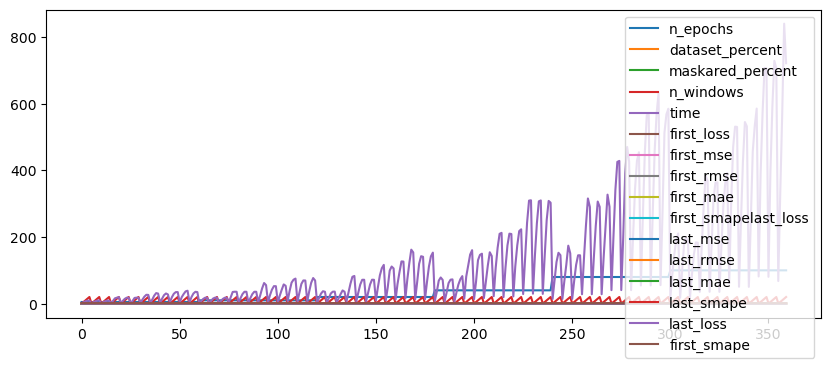

In [92]:
results_small.plot(figsize = (10,4))

<Axes: >

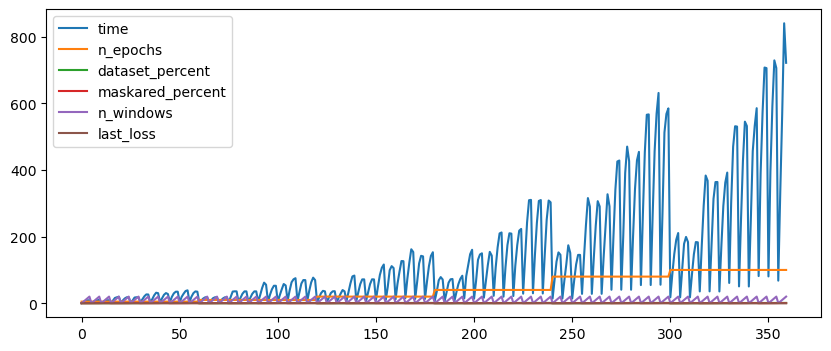

In [118]:
df_time_analysis_small = results_small[["time", "n_epochs", "dataset_percent", "masked_percent", "n_windows", "last_loss"]]
df_time_analysis_small.plot(figsize = (10,4))

In [97]:
import matplotlib.pyplot as plt

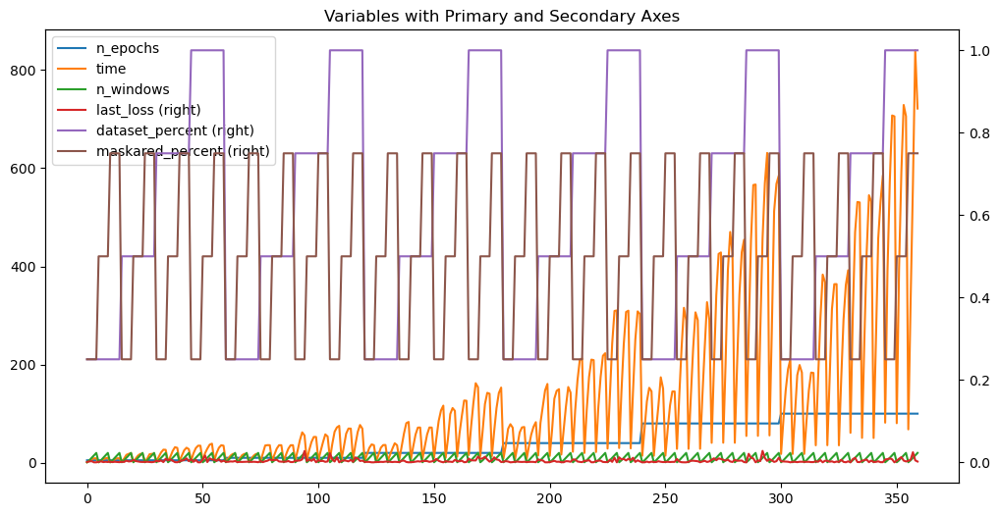

In [120]:
def plot_with_multiple_secondary_y(df, primary_vars, secondary_vars, figsize=(12, 6)):
    """
    Plots multiple variables with different scales on primary and secondary y-axes.

    Parameters:
    - df (pd.DataFrame): The DataFrame containing the data.
    - primary_vars (list): Variables to plot on the primary y-axis.
    - secondary_vars (list): Variables to plot on the secondary y-axis.
    - figsize (tuple): Size of the figure.

    Returns:
    - None: Displays the plot.
    """
    ax = df[primary_vars + secondary_vars].plot(
        secondary_y=secondary_vars, figsize=figsize
    )
    ax.set_title("Variables with Primary and Secondary Axes")
    plt.show()

plot_with_multiple_secondary_y(df_time_analysis_small, ["n_epochs", "time", "n_windows"], ["last_loss", "dataset_percent", "masked_percent"])

In [104]:
#! pip install pandas_profiling

In [103]:
import ydata_profiling as ydp

In [159]:
profile_small_df = df_time_analysis_small.copy(deep = True)
profile_small = ydp.ProfileReport(profile_small_df, title="Pandas Profiling Report for 'df_time_analysis_small'", explorative=True)

In [160]:
profile_small.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [129]:
import seaborn as sns

In [130]:
def plot_correlation(profile, figsize=(8, 6)):
    correlation_matrix = profile.corr()
    # Crear el heatmap con seaborn
    plt.figure(figsize = figsize)  # Ajusta el tamaño si es necesario
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, vmin=-1, vmax=1)
    plt.title("Correlation Matrix")
    plt.show()

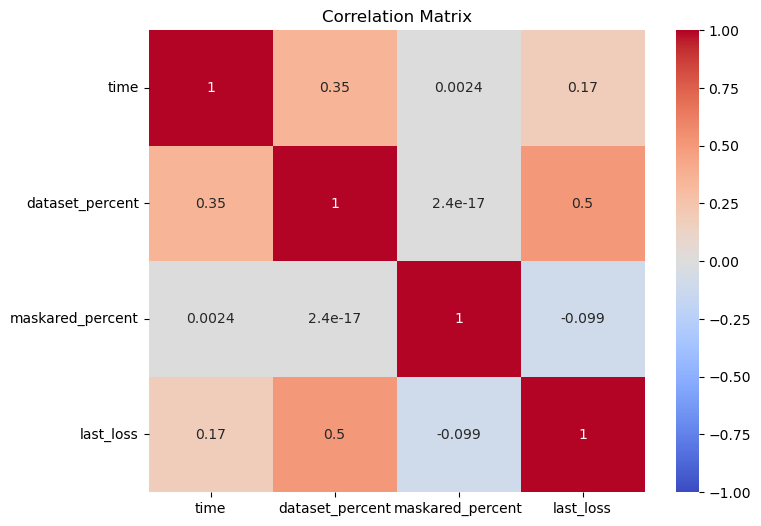

In [131]:
plot_correlation(profile_small_df)

A nivel de tiempo, se observa que:

- Apenas afecta el enmascarado
- Lo que más influye es el porcentaje de dataset utilizado para el fine_tuning
- El last loss está bastante relacionado con el tiempo dedicado al fine-tuning, como es de esperar. A más tiempo entrenando, mejores resultados.


### Loss & metrics analysis

A nivel de losses, se observa (sin tener en cuenta mse, rmse, mae, smape): 
- Muy poca relación con el enmascarado, cosa que de primeras sorprende
- Mucha relación con el % de dataset utilizado en el fine-tuning
Por lo tanto,
    - vamos a filtrar el dataset para tener tiempos menores a 8 segundos
y buenos losses.
    - Veamos a partir de qué momento se obtienen unos losses razonables  en %.

In [136]:
df_loss = results_small[["time", "n_epochs", "dataset_percent", "masked_percent", "n_windows", "first_loss", "last_loss"]].copy()

<Axes: >

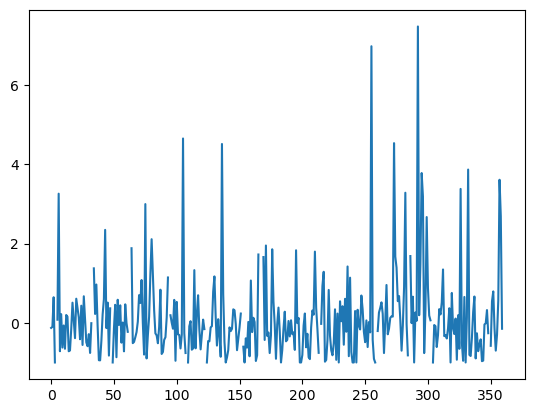

In [140]:
df_loss["loss_percent"] = (df_loss['first_loss']-df_loss['last_loss'])/(df_loss['first_loss'])
df_loss["loss_percent"].plot()

<Axes: >

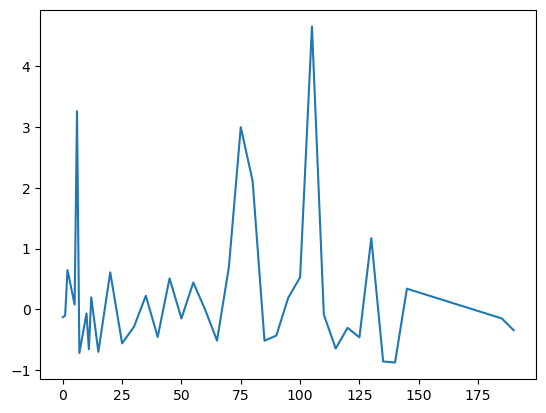

In [141]:
df_loss[df_loss["time"] < 8]["loss_percent"].plot()

In [143]:
# Filtrar filas donde "time" es menor a 8 segundos
df_loss_best_cases = df_loss[df_loss["time"] < 8].copy()

# Filtrar filas donde "loss_percent" es mayor a 1
df_loss_best_cases = df_loss_best_cases[df_loss_best_cases["loss_percent"] > 1]

# Mostrar la cantidad de filas y columnas resultantes
print(df_loss_best_cases.shape)

# Mostrar el DataFrame filtrado
display(df_loss_best_cases)

(5, 8)


,time,n_epochs,dataset_percent,masked_percent,n_windows,first_loss,last_loss,loss_percent
6,4.247821,5,0.25,0.50,5,0.000533,0.002273,3.261450
75,3.488628,10,0.50,0.25,1,0.000709,0.002835,2.998806
80,3.467560,10,0.50,0.50,1,0.001633,0.005083,2.112553
105,7.916799,10,1.00,0.25,1,0.003913,0.022129,4.655185
130,3.461032,20,0.25,0.75,1,0.000784,0.001704,1.172988


In [173]:
display(df_loss_best_cases.sort_values('loss_percent'))

,time,n_epochs,dataset_percent,masked_percent,n_windows,first_loss,last_loss,loss_percent
130,3.461032,20,0.25,0.75,1,0.000784,0.001704,1.172988
80,3.467560,10,0.50,0.50,1,0.001633,0.005083,2.112553
75,3.488628,10,0.50,0.25,1,0.000709,0.002835,2.998806
6,4.247821,5,0.25,0.50,5,0.000533,0.002273,3.261450
105,7.916799,10,1.00,0.25,1,0.003913,0.022129,4.655185


In [209]:
snapshot = torch.cuda.memory_snapshot()
gpu_tensors = [obj['tensor'] for obj in snapshot if 'tensor' in obj]
for tensor_info in gpu_tensors:
    print(f"Size: {tensor_info['size']}, Device: {tensor_info['device']}, Data type: {tensor_info['dtype']}")
print(gpu_tensors)


[]


In [212]:
object_types = set()
for obj in snapshot:
    for key in obj.keys():
        object_types.add(key)
print("Tipos de objetos encontrados en el snapshot:")
for obj_type in sorted(object_types):
    print(obj_type)
    

Tipos de objetos encontrados en el snapshot:
active_size
address
allocated_size
blocks
device
frames
is_expandable
requested_size
segment_pool_id
segment_type
stream
total_size


In [216]:
heavier_obj = None
for obj in snapshot:
    if heavier_obj is None or obj['total_size'] > heavier_obj['total_size']: heavier_obj = obj
print(heavier_obj)

{'device': 0, 'address': 139665927569408, 'total_size': 132120576, 'allocated_size': 132120576, 'active_size': 132120576, 'requested_size': 131596288, 'stream': 0, 'segment_type': 'large', 'segment_pool_id': (0, 0), 'is_expandable': False, 'frames': [], 'blocks': [{'address': 139665927569408, 'size': 132120576, 'requested_size': 131596288, 'state': 'active_allocated', 'frames': []}]}


In [217]:
import gc

In [218]:
print(torch.cuda.memory_allocated())
gc.collect()
torch.cuda.empty_cache()
print(torch.cuda.memory_allocated())

47889019392
40692321280


In [232]:
before = torch.cuda.memory_allocated()
print(before)
enc_learner_small.to('cpu')
for param in enc_learner_small.parameters():
    param.to('cpu')
after = torch.cuda.memory_allocated()
print(after)
print("Mejorado: ", after-before)

40692321280
40692321280
Mejorado:  0


In [220]:
gpu_tensors = []
for obj in gc.get_objects():
    try:
        if isinstance(obj, torch.Tensor) and obj.is_cuda:
            gpu_tensors.append(obj)
    except ReferenceError:
        continue # Omitir los objetos que ya han sido recolectados
print(len(gpu_tensors))

20478


## Moment-base

In [144]:
n_epochs_list     = [5, 10]
dataset_percents  = [0.25, 0.5] # No tendría sentido porque sería como hacer lo mismo que con mvp
masked_percents = [0.25, 0.5]
sizes             = [1, 5]
print(f"Total cases: {len(n_epochs_list)*len(dataset_percents)*len(masked_percents)*len(sizes)}")

Total cases: 16


In [150]:
results_base, errors_base = cases_loop(model = enc_learner_base, n_epochs_list = n_epochs_list, dataset_percents = dataset_percents, masked_percents = masked_percents, n_sizes_list = sizes, summarized = True)

--> epoch 5, dataset_percent 0.25, mask 0.25
 sizes 1
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/1





















100% 20/20 [00:01<00:00, 10.51it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 35/35 [00:01<00:00, 28.35it/s][A



















100% 20/20 [00:01<00:00, 10.51it/s]A


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows


[1]  [ cases_loop ] 0
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.25, 'masked_percent': 0.25, 'n_windows': 1, 'windows': None} | time: 1.2390179634094238


[1]  [ cases_loop ] epoch 5, dataset_percent 0.25, mask 0.25, sizes 1 -->
--> epoch 5, dataset_percent 0.25, mask 0.25
 sizes 5
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/5





















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 20/20 [00:01<00:00, 10.43it/s][A



















100% 35/35 [00:01<00:00, 28.93it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 20/20 [00:01<00:00, 10.45it/s][A


[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/5





















100% 35/35 [00:01<00:00, 30.26it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 21/21 [00:01<00:00, 11.10it/s][A


0.13346217598179402
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.018017952388892824
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10822405916695084
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.714976822667803
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/5





















100% 35/35 [00:01<00:00, 28.98it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 20/20 [00:01<00:00, 11.43it/s][A


0.05206467769391059
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0027423647631474018
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.029260908007340033
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.2550318942810491
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/5





















100% 35/35 [00:01<00:00, 30.20it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 21/21 [00:01<00:00, 12.56it/s][A


0.03937263127720564
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0016575414895979254
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.02102171896992681
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.19855718302212683
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/5





















100% 35/35 [00:01<00:00, 28.89it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 20/20 [00:01<00:00, 10.32it/s][A


0.1290504600450119
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.01704642879408063
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10398778867577768
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5790222259071274
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows


[1]  [ cases_loop ] 0
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.25, 'masked_percent': 0.25, 'n_windows': 5, 'windows': None} | time: 5.959423303604126


[1]  [ cases_loop ] epoch 5, dataset_percent 0.25, mask 0.25, sizes 5 -->
--> epoch 5, dataset_percent 0.25, mask 0.5
 sizes 1
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/1





















100% 20/20 [00:01<00:00, 10.52it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 35/35 [00:01<00:00, 28.33it/s][A



















100% 20/20 [00:01<00:00, 10.52it/s]A


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows


[1]  [ cases_loop ] 0
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.25, 'masked_percent': 0.5, 'n_windows': 1, 'windows': None} | time: 1.2405219078063965


[1]  [ cases_loop ] epoch 5, dataset_percent 0.25, mask 0.5, sizes 1 -->
--> epoch 5, dataset_percent 0.25, mask 0.5
 sizes 5
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/5





















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 20/20 [00:01<00:00, 10.44it/s][A



















100% 35/35 [00:01<00:00, 28.87it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 20/20 [00:01<00:00, 10.45it/s][A


[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/5





















100% 35/35 [00:01<00:00, 30.15it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 21/21 [00:01<00:00, 11.10it/s][A


0.13346217598179402
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.018017952388892824
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10822405916695084
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.714976822667803
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/5





















100% 35/35 [00:01<00:00, 28.95it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 20/20 [00:01<00:00, 11.44it/s][A


0.05206467769391059
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0027423647631474018
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.029260908007340033
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.2550318942810491
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/5





















100% 35/35 [00:01<00:00, 30.17it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 21/21 [00:01<00:00, 12.56it/s][A


0.03937263127720564
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0016575414895979254
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.02102171896992681
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.19855718302212683
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/5





















100% 35/35 [00:01<00:00, 29.00it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 20/20 [00:01<00:00, 10.32it/s][A


0.1290504600450119
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.01704642879408063
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10398778867577768
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5790222259071274
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows


[1]  [ cases_loop ] 0
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.25, 'masked_percent': 0.5, 'n_windows': 5, 'windows': None} | time: 5.963329792022705


[1]  [ cases_loop ] epoch 5, dataset_percent 0.25, mask 0.5, sizes 5 -->
--> epoch 5, dataset_percent 0.5, mask 0.25
 sizes 1
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/1





















100% 14/14 [00:01<00:00,  8.59it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows


[1]  [ cases_loop ] 0
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.5, 'masked_percent': 0.25, 'n_windows': 1, 'windows': None} | time: 2.4673359394073486


[1]  [ cases_loop ] epoch 5, dataset_percent 0.5, mask 0.25, sizes 1 -->
--> epoch 5, dataset_percent 0.5, mask 0.25
 sizes 5
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/5





















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  8.54it/s][A



















100% 70/70 [00:02<00:00, 29.06it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  8.54it/s][A


[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/5





















100% 70/70 [00:02<00:00, 30.22it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  8.77it/s][A


0.09819803287053033
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.00975287937619961
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07794398795772901
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.7106875148738943
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/5





















100% 70/70 [00:02<00:00, 29.13it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.19it/s][A


0.03966394877649798
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.001592465868326701
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.023417496319997948
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.28656933800453777
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/5





















100% 70/70 [00:02<00:00, 30.35it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.65it/s][A


0.029908693779502508
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0009582566350933692
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.01662128838369288
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.22747519715380077
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/5





















100% 70/70 [00:02<00:00, 29.13it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  8.47it/s][A


0.09546542579632761
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.009327830686250834
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07553644644400934
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.572356280765241
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows


[1]  [ cases_loop ] 0
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.5, 'masked_percent': 0.25, 'n_windows': 5, 'windows': None} | time: 11.851656436920166


[1]  [ cases_loop ] epoch 5, dataset_percent 0.5, mask 0.25, sizes 5 -->
--> epoch 5, dataset_percent 0.5, mask 0.5
 sizes 1
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/1





















100% 14/14 [00:01<00:00,  8.59it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows


[1]  [ cases_loop ] 0
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.5, 'masked_percent': 0.5, 'n_windows': 1, 'windows': None} | time: 2.468456506729126


[1]  [ cases_loop ] epoch 5, dataset_percent 0.5, mask 0.5, sizes 1 -->
--> epoch 5, dataset_percent 0.5, mask 0.5
 sizes 5
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/5





















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  8.54it/s][A



















100% 70/70 [00:02<00:00, 29.13it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  8.54it/s][A


[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/5





















100% 70/70 [00:02<00:00, 30.33it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  8.78it/s][A


0.09819803287053033
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.00975287937619961
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07794398795772901
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.7106875148738943
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/5





















100% 70/70 [00:02<00:00, 29.09it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.17it/s][A


0.03966394877649798
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.001592465868326701
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.023417496319997948
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.28656933800453777
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/5





















100% 70/70 [00:02<00:00, 30.46it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.65it/s][A


0.029908693779502508
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0009582566350933692
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.01662128838369288
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.22747519715380077
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/5





















100% 70/70 [00:02<00:00, 29.12it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  8.45it/s][A


0.09546542579632761
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.009327830686250834
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07553644644400934
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.572356280765241
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows


[1]  [ cases_loop ] 0
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.5, 'masked_percent': 0.5, 'n_windows': 5, 'windows': None} | time: 11.833373546600342


[1]  [ cases_loop ] epoch 5, dataset_percent 0.5, mask 0.5, sizes 5 -->
--> epoch 10, dataset_percent 0.25, mask 0.25
 sizes 1
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/1





















100% 20/20 [00:01<00:00, 10.52it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows


[1]  [ cases_loop ] 0
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 10, 'dataset_percent': 0.25, 'masked_percent': 0.25, 'n_windows': 1, 'windows': None} | time: 2.4530937671661377


[1]  [ cases_loop ] epoch 10, dataset_percent 0.25, mask 0.25, sizes 1 -->
--> epoch 10, dataset_percent 0.25, mask 0.25
 sizes 5
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/5





















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 20/20 [00:01<00:00, 10.43it/s][A



















100% 70/70 [00:02<00:00, 29.12it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 20/20 [00:01<00:00, 10.42it/s][A


[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/5





















100% 70/70 [00:02<00:00, 30.38it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 21/21 [00:01<00:00, 11.15it/s][A


0.13346217598179402
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.018017952388892824
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10822405916695084
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.714976822667803
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/5





















100% 70/70 [00:02<00:00, 29.23it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 20/20 [00:01<00:00, 11.45it/s][A


0.05206467769391059
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0027423647631474018
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.029260908007340033
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.2550318942810491
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/5





















100% 70/70 [00:02<00:00, 30.40it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 21/21 [00:01<00:00, 12.59it/s][A


0.03937263127720564
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0016575414895979254
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.02102171896992681
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.19855718302212683
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/5





















100% 70/70 [00:02<00:00, 29.17it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 20/20 [00:01<00:00, 10.37it/s][A


0.1290504600450119
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.01704642879408063
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10398778867577768
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5790222259071274
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows


[1]  [ cases_loop ] 0
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 10, 'dataset_percent': 0.25, 'masked_percent': 0.25, 'n_windows': 5, 'windows': None} | time: 11.819140195846558


[1]  [ cases_loop ] epoch 10, dataset_percent 0.25, mask 0.25, sizes 5 -->
--> epoch 10, dataset_percent 0.25, mask 0.5
 sizes 1
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/1





















100% 20/20 [00:01<00:00, 10.55it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows


[1]  [ cases_loop ] 0
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 10, 'dataset_percent': 0.25, 'masked_percent': 0.5, 'n_windows': 1, 'windows': None} | time: 2.4640052318573


[1]  [ cases_loop ] epoch 10, dataset_percent 0.25, mask 0.5, sizes 1 -->
--> epoch 10, dataset_percent 0.25, mask 0.5
 sizes 5
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/5





















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 20/20 [00:01<00:00, 10.44it/s][A



















100% 70/70 [00:02<00:00, 29.02it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 20/20 [00:01<00:00, 10.45it/s][A


[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/5





















100% 70/70 [00:02<00:00, 30.32it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 21/21 [00:01<00:00, 11.15it/s][A


0.13346217598179402
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.018017952388892824
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10822405916695084
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.714976822667803
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/5





















100% 70/70 [00:02<00:00, 29.12it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 20/20 [00:01<00:00, 11.42it/s][A


0.05206467769391059
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0027423647631474018
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.029260908007340033
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.2550318942810491
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/5





















100% 70/70 [00:02<00:00, 30.42it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 21/21 [00:01<00:00, 12.56it/s][A


0.03937263127720564
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0016575414895979254
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.02102171896992681
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.19855718302212683
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/5





















100% 70/70 [00:02<00:00, 29.07it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 20/20 [00:01<00:00, 10.35it/s][A


0.1290504600450119
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.01704642879408063
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.10398778867577768
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.5790222259071274
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows


[1]  [ cases_loop ] 0
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 10, 'dataset_percent': 0.25, 'masked_percent': 0.5, 'n_windows': 5, 'windows': None} | time: 11.848311185836792


[1]  [ cases_loop ] epoch 10, dataset_percent 0.25, mask 0.5, sizes 5 -->
--> epoch 10, dataset_percent 0.5, mask 0.25
 sizes 1
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/1





















100% 14/14 [00:01<00:00,  8.55it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows


[1]  [ cases_loop ] 0
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 10, 'dataset_percent': 0.5, 'masked_percent': 0.25, 'n_windows': 1, 'windows': None} | time: 4.924947500228882


[1]  [ cases_loop ] epoch 10, dataset_percent 0.5, mask 0.25, sizes 1 -->
--> epoch 10, dataset_percent 0.5, mask 0.25
 sizes 5
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/5





















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  8.52it/s][A



















100% 140/140 [00:04<00:00, 29.07it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  8.54it/s][A


[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/5





















100% 140/140 [00:04<00:00, 30.25it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  8.77it/s][A


0.09819803287053033
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.00975287937619961
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07794398795772901
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.7106875148738943
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/5





















100% 140/140 [00:05<00:00, 26.14it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.13it/s][A


0.03966394877649798
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.001592465868326701
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.023417496319997948
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.28656933800453777
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/5





















100% 140/140 [00:04<00:00, 30.50it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.61it/s][A


0.029908693779502508
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0009582566350933692
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.01662128838369288
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.22747519715380077
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/5





















100% 140/140 [00:04<00:00, 29.17it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  8.47it/s][A


0.09546542579632761
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.009327830686250834
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07553644644400934
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.572356280765241
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows


[1]  [ cases_loop ] 0
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 10, 'dataset_percent': 0.5, 'masked_percent': 0.25, 'n_windows': 5, 'windows': None} | time: 24.2037410736084


[1]  [ cases_loop ] epoch 10, dataset_percent 0.5, mask 0.25, sizes 5 -->
--> epoch 10, dataset_percent 0.5, mask 0.5
 sizes 1
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/1





















100% 14/14 [00:01<00:00,  8.50it/s]A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows


[1]  [ cases_loop ] 0
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 10, 'dataset_percent': 0.5, 'masked_percent': 0.5, 'n_windows': 1, 'windows': None} | time: 5.247616291046143


[1]  [ cases_loop ] epoch 10, dataset_percent 0.5, mask 0.5, sizes 1 -->
--> epoch 10, dataset_percent 0.5, mask 0.5
 sizes 5
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/5





















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  7.92it/s][A



















100% 140/140 [00:05<00:00, 23.80it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  7.90it/s][A


[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/5





















100% 140/140 [00:05<00:00, 24.92it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  8.11it/s][A


0.09819803287053033
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.00975287937619961
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07794398795772901
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.7106875148738943
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/5





















100% 140/140 [00:05<00:00, 27.95it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.19it/s][A


0.03966394877649798
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.001592465868326701
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.023417496319997948
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.28656933800453777
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/5





















100% 140/140 [00:04<00:00, 30.52it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  9.64it/s][A


0.029908693779502508
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.0009582566350933692
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.01662128838369288
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.22747519715380077
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/5





















100% 140/140 [00:04<00:00, 29.32it/s][A



















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















 ... (more hidden) ...


















100% 14/14 [00:01<00:00,  8.49it/s][A


0.09546542579632761
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.009327830686250834
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
0.07553644644400934
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17
1.572356280765241
[0]  [ set_fine_tune_ ] fine_tune_moment_single | Eval Post | wlen 17


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows


[1]  [ cases_loop ] 0
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 10, 'dataset_percent': 0.5, 'masked_percent': 0.5, 'n_windows': 5, 'windows': None} | time: 25.886147260665894


[1]  [ cases_loop ] epoch 10, dataset_percent 0.5, mask 0.5, sizes 5 -->


In [151]:
print("----- ERRORS -----")
print(f"Total error cases: {len(errors_base)}")
display(errors_base.head())
print(f"Total results: {len(results_base)}")
display(results_base.head())

----- ERRORS -----
Total error cases: 0


,model_size,n_epochs,dataset_percent,masked_percent,n_windows,error,window,windows


Total results: 16


,model_size,n_epochs,dataset_percent,masked_percent,n_windows,time,first_loss,first_mse,first_rmse,first_mae,first_smapelast_loss,last_mse,last_rmse,last_mae,last_smape,windows,last_loss,first_smape
0,small,5,0.25,0.25,1,1.239018,0.001509,0.130019,0.017256,0.104646,NaN,0.130019,0.017256,0.104646,1.613017,[17],0.001745,1.613017
1,small,5,0.25,0.25,5,5.959423,0.000828,0.130019,0.017256,0.104646,NaN,0.129050,0.017046,0.103988,1.579022,"[17, 10, 16, 8, 19]",0.001498,1.613017
2,small,5,0.25,0.50,1,1.240522,0.001255,0.130019,0.017256,0.104646,NaN,0.130019,0.017256,0.104646,1.613017,[17],0.001282,1.613017
3,small,5,0.25,0.50,5,5.963330,0.001453,0.130019,0.017256,0.104646,NaN,0.129050,0.017046,0.103988,1.579022,"[17, 10, 16, 8, 19]",0.001219,1.613017
4,small,5,0.50,0.25,1,2.467336,0.002243,0.096041,0.009417,0.075907,NaN,0.096041,0.009417,0.075907,1.604896,[17],0.002210,1.604896


### Checking the errors

In [152]:
error_base_window_sizes = list(errors_base['window'].drop_duplicates())
error_base_window_sizes

[]

In [153]:
error_base_mssg = errors_base['error'].astype(str).drop_duplicates()
error_base_mssg

Series([], Name: error, dtype: object)

In [155]:
filtered_windows_base = small_windows.apply(lambda x: greater_than(x, 5)).apply(sorted)
filtered_windows_base

0                                   [17]
1                    [8, 10, 16, 17, 19]
2        [8, 10, 12, 16, 17, 18, 19, 20]
3    [8, 10, 11, 12, 16, 17, 18, 19, 20]
Name: windows, dtype: object

#### Time analysis

In [156]:
df_time_analysis_base = results_base[["time", "n_epochs", "dataset_percent", "masked_percent", "n_windows", "last_loss"]]

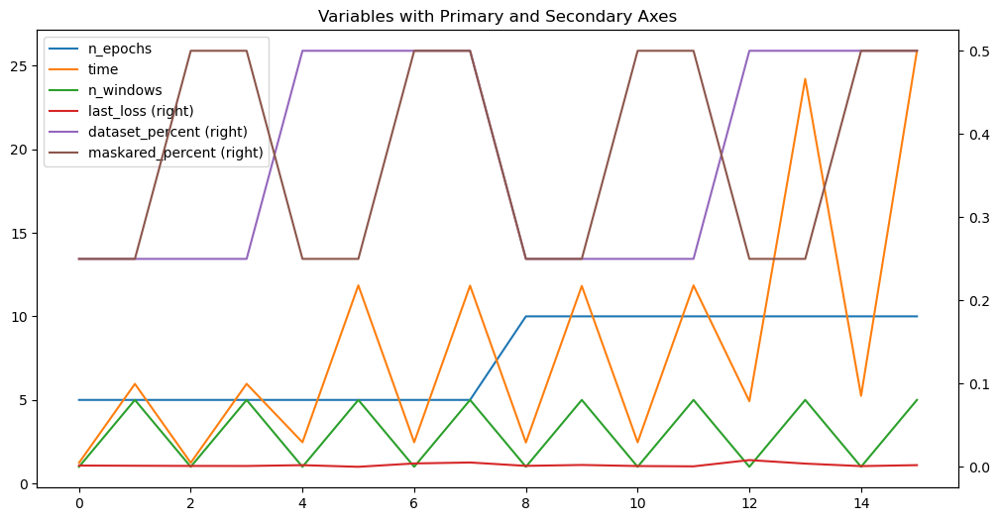

In [157]:
plot_with_multiple_secondary_y(df_time_analysis_base, ["n_epochs", "time", "n_windows"], ["last_loss", "dataset_percent", "masked_percent"])

In [161]:
profile_base_df = df_time_analysis_base.copy(deep = True)
profile_base = ydp.ProfileReport(profile_base_df, title="Pandas Profiling Report for 'df_time_analysis_small'", explorative=True)

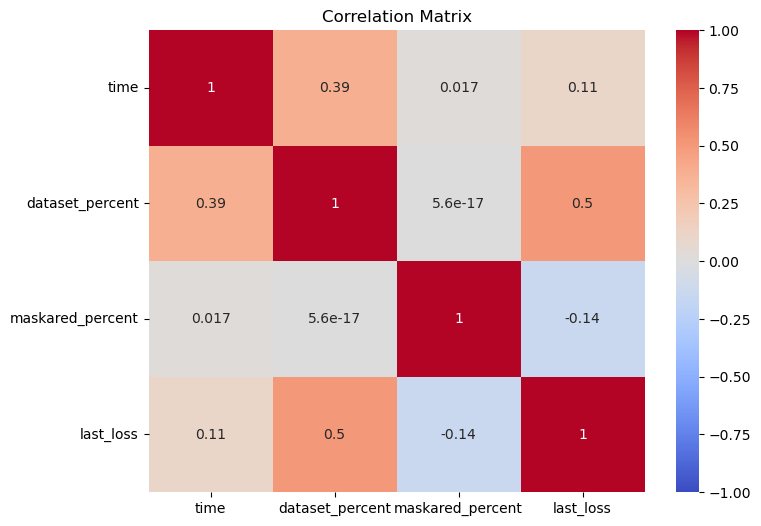

In [163]:
plot_correlation(profile_base_df)

#### Loss & metrics analysis

<Axes: >

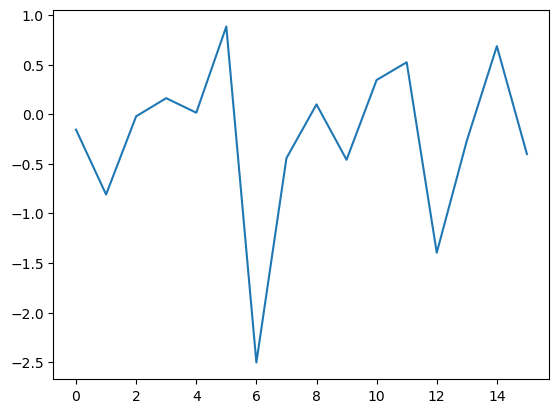

In [167]:
df_loss_base = results_base[["time", "n_epochs", "dataset_percent", "masked_percent", "n_windows", "first_loss", "last_loss"]].copy()
df_loss_base["loss_percent"] = (df_loss_base['first_loss']-df_loss_base['last_loss'])/(df_loss_base['first_loss'])
df_loss_base["loss_percent"].plot()

<Axes: >

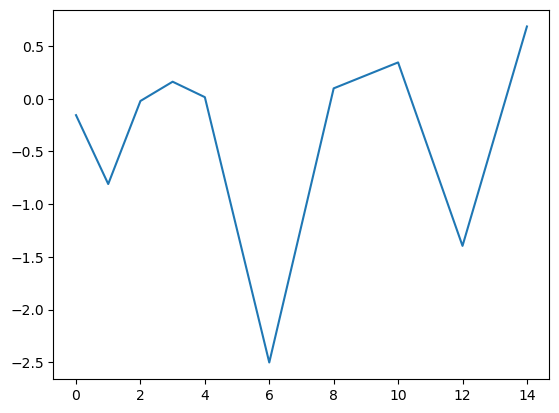

In [168]:
df_loss_base[df_loss_base["time"] < 8]["loss_percent"].plot()

In [174]:
# Filtrar filas donde "time" es menor a 8 segundos
df_loss_base_best_cases = df_loss_base[df_loss_base["time"] < 8].copy()

# Filtrar filas donde "loss_percent" es mayor a 1
df_loss_base_best_cases = df_loss_base_best_cases[df_loss_base_best_cases["loss_percent"] > 0]

# Mostrar la cantidad de filas y columnas resultantes
print(df_loss_base_best_cases.shape)

# Mostrar el DataFrame filtrado
display(df_loss_base_best_cases.sort_values('loss_percent'))

(5, 8)


,time,n_epochs,dataset_percent,masked_percent,n_windows,first_loss,last_loss,loss_percent
4,2.467336,5,0.50,0.25,1,0.002243,0.002210,0.014682
8,2.453094,10,0.25,0.25,1,0.001510,0.001362,0.098243
3,5.963330,5,0.25,0.50,5,0.001453,0.001219,0.161266
10,2.464005,10,0.25,0.50,1,0.001769,0.001160,0.344253
14,5.247616,10,0.50,0.50,1,0.003421,0.001077,0.685260


In [ ]:
enc_learner_small.to('cpu')
enc_learner_base.to

In [205]:
print(torch.cuda.memory_allocated())
torch.cuda.empty_cache()
print(torch.cuda.memory_allocated())

47889019392
47889019392


### Moment-large

In [204]:
results_large, errors_large = cases_loop(model = enc_learner_large, n_epochs_list = n_epochs_list, dataset_percents = dataset_percents, masked_percents = masked_percents, n_sizes_list = sizes, summarized = True)
print("----- ERRORS -----")
print(f"Total error cases: {len(errors_large)}")
display(errors_large.head())
print(f"Total results: {len(results_large)}")
display(results_large.head())

--> epoch 5, dataset_percent 0.25, mask 0.25
 sizes 1
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/1
[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 17 | error: CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


Failed case


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 1
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.25, 'masked_percent': 0.25, 'n_windows': 1, 'windows': None} | time: 0


[1]  [ cases_loop ] epoch 5, dataset_percent 0.25, mask 0.25, sizes 1 -->
--> epoch 5, dataset_percent 0.25, mask 0.25
 sizes 5
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/5
[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 17 | error: CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/5


Traceback (most recent call last):
  File "/home/macu/work/dvats/encoder.py", line 2646, in fine_tune_moment_single_
    losses, self.model                  = fine_tune_moment_train_(
  File "/home/macu/work/dvats/encoder.py", line 2554, in fine_tune_moment_train_
    loss, enc_learn = fine_tune_moment_train_loop_step_(
  File "/home/macu/work/dvats/encoder.py", line 2457, in fine_tune_moment_train_loop_step_
    enc_learn = enc_learn.to(device)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 1340, in to
    return self._apply(convert)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 10 | error: CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,10,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/5





















 ... (more hidden) ...Traceback (most recent call last):
  File "/home/macu/work/dvats/encoder.py", line 2646, in fine_tune_moment_single_
    losses, self.model                  = fine_tune_moment_train_(
  File "/home/macu/work/dvats/encoder.py", line 2554, in fine_tune_moment_train_
    loss, enc_learn = fine_tune_moment_train_loop_step_(
  File "/home/macu/work/dvats/encoder.py", line 2457, in fine_tune_moment_train_loop_step_
    enc_learn = enc_learn.to(device)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 1340, in to
    return self._apply(convert)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-pa

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 16 | error: CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,10,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,16,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/5


Traceback (most recent call last):
  File "/home/macu/work/dvats/encoder.py", line 2646, in fine_tune_moment_single_
    losses, self.model                  = fine_tune_moment_train_(
  File "/home/macu/work/dvats/encoder.py", line 2554, in fine_tune_moment_train_
    loss, enc_learn = fine_tune_moment_train_loop_step_(
  File "/home/macu/work/dvats/encoder.py", line 2457, in fine_tune_moment_train_loop_step_
    enc_learn = enc_learn.to(device)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 1340, in to
    return self._apply(convert)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 8 | error: CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,10,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,16,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,8,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/5





















 ... (more hidden) ...Traceback (most recent call last):
  File "/home/macu/work/dvats/encoder.py", line 2646, in fine_tune_moment_single_
    losses, self.model                  = fine_tune_moment_train_(
  File "/home/macu/work/dvats/encoder.py", line 2554, in fine_tune_moment_train_
    loss, enc_learn = fine_tune_moment_train_loop_step_(
  File "/home/macu/work/dvats/encoder.py", line 2457, in fine_tune_moment_train_loop_step_
    enc_learn = enc_learn.to(device)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 1340, in to
    return self._apply(convert)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-pa

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 19 | error: CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,10,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,16,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,8,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,19,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


Failed case


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,10,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,16,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,8,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,19,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 5
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.25, 'masked_percent': 0.25, 'n_windows': 5, 'windows': None} | time: 0


[1]  [ cases_loop ] epoch 5, dataset_percent 0.25, mask 0.25, sizes 5 -->


[1]  [ cases_loop ] epoch 5, dataset_percent 0.25, mask 0.25 -->
--> epoch 5, dataset_percent 0.25, mask 0.5
 sizes 1
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/1
[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 17 | error: CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


Failed case


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 1
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.25, 'masked_percent': 0.5, 'n_windows': 1, 'windows': None} | time: 0


[1]  [ cases_loop ] epoch 5, dataset_percent 0.25, mask 0.5, sizes 1 -->
--> epoch 5, dataset_percent 0.25, mask 0.5
 sizes 5
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/5
[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 17 | error: CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/5


Traceback (most recent call last):
  File "/home/macu/work/dvats/encoder.py", line 2646, in fine_tune_moment_single_
    losses, self.model                  = fine_tune_moment_train_(
  File "/home/macu/work/dvats/encoder.py", line 2554, in fine_tune_moment_train_
    loss, enc_learn = fine_tune_moment_train_loop_step_(
  File "/home/macu/work/dvats/encoder.py", line 2457, in fine_tune_moment_train_loop_step_
    enc_learn = enc_learn.to(device)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 1340, in to
    return self._apply(convert)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 10 | error: CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,10,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/5





















 ... (more hidden) ...Traceback (most recent call last):
  File "/home/macu/work/dvats/encoder.py", line 2646, in fine_tune_moment_single_
    losses, self.model                  = fine_tune_moment_train_(
  File "/home/macu/work/dvats/encoder.py", line 2554, in fine_tune_moment_train_
    loss, enc_learn = fine_tune_moment_train_loop_step_(
  File "/home/macu/work/dvats/encoder.py", line 2457, in fine_tune_moment_train_loop_step_
    enc_learn = enc_learn.to(device)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 1340, in to
    return self._apply(convert)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-pa

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 16 | error: CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,10,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,16,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/5


Traceback (most recent call last):
  File "/home/macu/work/dvats/encoder.py", line 2646, in fine_tune_moment_single_
    losses, self.model                  = fine_tune_moment_train_(
  File "/home/macu/work/dvats/encoder.py", line 2554, in fine_tune_moment_train_
    loss, enc_learn = fine_tune_moment_train_loop_step_(
  File "/home/macu/work/dvats/encoder.py", line 2457, in fine_tune_moment_train_loop_step_
    enc_learn = enc_learn.to(device)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 1340, in to
    return self._apply(convert)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 8 | error: CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,10,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,16,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,8,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/5





















 ... (more hidden) ...Traceback (most recent call last):
  File "/home/macu/work/dvats/encoder.py", line 2646, in fine_tune_moment_single_
    losses, self.model                  = fine_tune_moment_train_(
  File "/home/macu/work/dvats/encoder.py", line 2554, in fine_tune_moment_train_
    loss, enc_learn = fine_tune_moment_train_loop_step_(
  File "/home/macu/work/dvats/encoder.py", line 2457, in fine_tune_moment_train_loop_step_
    enc_learn = enc_learn.to(device)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 1340, in to
    return self._apply(convert)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-pa

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 19 | error: CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,10,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,16,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,8,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,19,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


Failed case


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,10,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,16,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,8,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,19,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 5
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.25, 'masked_percent': 0.5, 'n_windows': 5, 'windows': None} | time: 0


[1]  [ cases_loop ] epoch 5, dataset_percent 0.25, mask 0.5, sizes 5 -->


[1]  [ cases_loop ] epoch 5, dataset_percent 0.25, mask 0.5 -->


[1]  [ cases_loop ] epoch 5, dataset_percent 0.25-->
--> epoch 5, dataset_percent 0.5, mask 0.25
 sizes 1
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/1
[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 17 | error: CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


Failed case


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 1
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.5, 'masked_percent': 0.25, 'n_windows': 1, 'windows': None} | time: 0


[1]  [ cases_loop ] epoch 5, dataset_percent 0.5, mask 0.25, sizes 1 -->
--> epoch 5, dataset_percent 0.5, mask 0.25
 sizes 5
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/5
[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 17 | error: CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/5


Traceback (most recent call last):
  File "/home/macu/work/dvats/encoder.py", line 2646, in fine_tune_moment_single_
    losses, self.model                  = fine_tune_moment_train_(
  File "/home/macu/work/dvats/encoder.py", line 2554, in fine_tune_moment_train_
    loss, enc_learn = fine_tune_moment_train_loop_step_(
  File "/home/macu/work/dvats/encoder.py", line 2457, in fine_tune_moment_train_loop_step_
    enc_learn = enc_learn.to(device)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 1340, in to
    return self._apply(convert)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 10 | error: CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,10,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/5





















 ... (more hidden) ...Traceback (most recent call last):
  File "/home/macu/work/dvats/encoder.py", line 2646, in fine_tune_moment_single_
    losses, self.model                  = fine_tune_moment_train_(
  File "/home/macu/work/dvats/encoder.py", line 2554, in fine_tune_moment_train_
    loss, enc_learn = fine_tune_moment_train_loop_step_(
  File "/home/macu/work/dvats/encoder.py", line 2457, in fine_tune_moment_train_loop_step_
    enc_learn = enc_learn.to(device)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 1340, in to
    return self._apply(convert)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-pa

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 16 | error: CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,10,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,16,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/5


Traceback (most recent call last):
  File "/home/macu/work/dvats/encoder.py", line 2646, in fine_tune_moment_single_
    losses, self.model                  = fine_tune_moment_train_(
  File "/home/macu/work/dvats/encoder.py", line 2554, in fine_tune_moment_train_
    loss, enc_learn = fine_tune_moment_train_loop_step_(
  File "/home/macu/work/dvats/encoder.py", line 2457, in fine_tune_moment_train_loop_step_
    enc_learn = enc_learn.to(device)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 1340, in to
    return self._apply(convert)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 8 | error: CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,10,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,16,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,8,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/5





















 ... (more hidden) ...Traceback (most recent call last):
  File "/home/macu/work/dvats/encoder.py", line 2646, in fine_tune_moment_single_
    losses, self.model                  = fine_tune_moment_train_(
  File "/home/macu/work/dvats/encoder.py", line 2554, in fine_tune_moment_train_
    loss, enc_learn = fine_tune_moment_train_loop_step_(
  File "/home/macu/work/dvats/encoder.py", line 2457, in fine_tune_moment_train_loop_step_
    enc_learn = enc_learn.to(device)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 1340, in to
    return self._apply(convert)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-pa

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 19 | error: CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,10,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,16,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,8,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,19,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


Failed case


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,10,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,16,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,8,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,19,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 5
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.5, 'masked_percent': 0.25, 'n_windows': 5, 'windows': None} | time: 0


[1]  [ cases_loop ] epoch 5, dataset_percent 0.5, mask 0.25, sizes 5 -->


[1]  [ cases_loop ] epoch 5, dataset_percent 0.5, mask 0.25 -->
--> epoch 5, dataset_percent 0.5, mask 0.5
 sizes 1
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/1
[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 17 | error: CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


Failed case


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 1
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.5, 'masked_percent': 0.5, 'n_windows': 1, 'windows': None} | time: 0


[1]  [ cases_loop ] epoch 5, dataset_percent 0.5, mask 0.5, sizes 1 -->
--> epoch 5, dataset_percent 0.5, mask 0.5
 sizes 5
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/5
[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 17 | error: CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/5


Traceback (most recent call last):
  File "/home/macu/work/dvats/encoder.py", line 2646, in fine_tune_moment_single_
    losses, self.model                  = fine_tune_moment_train_(
  File "/home/macu/work/dvats/encoder.py", line 2554, in fine_tune_moment_train_
    loss, enc_learn = fine_tune_moment_train_loop_step_(
  File "/home/macu/work/dvats/encoder.py", line 2457, in fine_tune_moment_train_loop_step_
    enc_learn = enc_learn.to(device)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 1340, in to
    return self._apply(convert)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 10 | error: CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,10,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/5





















 ... (more hidden) ...Traceback (most recent call last):
  File "/home/macu/work/dvats/encoder.py", line 2646, in fine_tune_moment_single_
    losses, self.model                  = fine_tune_moment_train_(
  File "/home/macu/work/dvats/encoder.py", line 2554, in fine_tune_moment_train_
    loss, enc_learn = fine_tune_moment_train_loop_step_(
  File "/home/macu/work/dvats/encoder.py", line 2457, in fine_tune_moment_train_loop_step_
    enc_learn = enc_learn.to(device)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 1340, in to
    return self._apply(convert)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-pa

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 16 | error: CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,10,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,16,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/5


Traceback (most recent call last):
  File "/home/macu/work/dvats/encoder.py", line 2646, in fine_tune_moment_single_
    losses, self.model                  = fine_tune_moment_train_(
  File "/home/macu/work/dvats/encoder.py", line 2554, in fine_tune_moment_train_
    loss, enc_learn = fine_tune_moment_train_loop_step_(
  File "/home/macu/work/dvats/encoder.py", line 2457, in fine_tune_moment_train_loop_step_
    enc_learn = enc_learn.to(device)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 1340, in to
    return self._apply(convert)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 8 | error: CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,10,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,16,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,8,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/5





















 ... (more hidden) ...Traceback (most recent call last):
  File "/home/macu/work/dvats/encoder.py", line 2646, in fine_tune_moment_single_
    losses, self.model                  = fine_tune_moment_train_(
  File "/home/macu/work/dvats/encoder.py", line 2554, in fine_tune_moment_train_
    loss, enc_learn = fine_tune_moment_train_loop_step_(
  File "/home/macu/work/dvats/encoder.py", line 2457, in fine_tune_moment_train_loop_step_
    enc_learn = enc_learn.to(device)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 1340, in to
    return self._apply(convert)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-pa

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 19 | error: CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,10,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,16,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,8,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,19,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


Failed case


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,10,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,16,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,8,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,19,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 5
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 5, 'dataset_percent': 0.5, 'masked_percent': 0.5, 'n_windows': 5, 'windows': None} | time: 0


[1]  [ cases_loop ] epoch 5, dataset_percent 0.5, mask 0.5, sizes 5 -->


[1]  [ cases_loop ] epoch 5, dataset_percent 0.5, mask 0.5 -->


[1]  [ cases_loop ] epoch 5, dataset_percent 0.5-->


[1]  [ cases_loop ] epoch 5-->
--> epoch 10, dataset_percent 0.25, mask 0.25
 sizes 1
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/1
[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 17 | error: CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


Failed case


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 1
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 10, 'dataset_percent': 0.25, 'masked_percent': 0.25, 'n_windows': 1, 'windows': None} | time: 0


[1]  [ cases_loop ] epoch 10, dataset_percent 0.25, mask 0.25, sizes 1 -->
--> epoch 10, dataset_percent 0.25, mask 0.25
 sizes 5
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/5
[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 17 | error: CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/5


Traceback (most recent call last):
  File "/home/macu/work/dvats/encoder.py", line 2646, in fine_tune_moment_single_
    losses, self.model                  = fine_tune_moment_train_(
  File "/home/macu/work/dvats/encoder.py", line 2554, in fine_tune_moment_train_
    loss, enc_learn = fine_tune_moment_train_loop_step_(
  File "/home/macu/work/dvats/encoder.py", line 2457, in fine_tune_moment_train_loop_step_
    enc_learn = enc_learn.to(device)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 1340, in to
    return self._apply(convert)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 10 | error: CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,10,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/5





















 ... (more hidden) ...Traceback (most recent call last):
  File "/home/macu/work/dvats/encoder.py", line 2646, in fine_tune_moment_single_
    losses, self.model                  = fine_tune_moment_train_(
  File "/home/macu/work/dvats/encoder.py", line 2554, in fine_tune_moment_train_
    loss, enc_learn = fine_tune_moment_train_loop_step_(
  File "/home/macu/work/dvats/encoder.py", line 2457, in fine_tune_moment_train_loop_step_
    enc_learn = enc_learn.to(device)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 1340, in to
    return self._apply(convert)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-pa

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 16 | error: CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,10,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,16,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/5


Traceback (most recent call last):
  File "/home/macu/work/dvats/encoder.py", line 2646, in fine_tune_moment_single_
    losses, self.model                  = fine_tune_moment_train_(
  File "/home/macu/work/dvats/encoder.py", line 2554, in fine_tune_moment_train_
    loss, enc_learn = fine_tune_moment_train_loop_step_(
  File "/home/macu/work/dvats/encoder.py", line 2457, in fine_tune_moment_train_loop_step_
    enc_learn = enc_learn.to(device)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 1340, in to
    return self._apply(convert)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 8 | error: CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,10,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,16,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,8,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/5





















 ... (more hidden) ...Traceback (most recent call last):
  File "/home/macu/work/dvats/encoder.py", line 2646, in fine_tune_moment_single_
    losses, self.model                  = fine_tune_moment_train_(
  File "/home/macu/work/dvats/encoder.py", line 2554, in fine_tune_moment_train_
    loss, enc_learn = fine_tune_moment_train_loop_step_(
  File "/home/macu/work/dvats/encoder.py", line 2457, in fine_tune_moment_train_loop_step_
    enc_learn = enc_learn.to(device)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 1340, in to
    return self._apply(convert)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-pa

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 19 | error: CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,10,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,16,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,8,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,19,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


Failed case


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,10,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,16,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,8,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,19,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 5
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 10, 'dataset_percent': 0.25, 'masked_percent': 0.25, 'n_windows': 5, 'windows': None} | time: 0


[1]  [ cases_loop ] epoch 10, dataset_percent 0.25, mask 0.25, sizes 5 -->


[1]  [ cases_loop ] epoch 10, dataset_percent 0.25, mask 0.25 -->
--> epoch 10, dataset_percent 0.25, mask 0.5
 sizes 1
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/1
[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 17 | error: CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


Failed case


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 1
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 10, 'dataset_percent': 0.25, 'masked_percent': 0.5, 'n_windows': 1, 'windows': None} | time: 0


[1]  [ cases_loop ] epoch 10, dataset_percent 0.25, mask 0.5, sizes 1 -->
--> epoch 10, dataset_percent 0.25, mask 0.5
 sizes 5
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/5
[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 17 | error: CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/5


Traceback (most recent call last):
  File "/home/macu/work/dvats/encoder.py", line 2646, in fine_tune_moment_single_
    losses, self.model                  = fine_tune_moment_train_(
  File "/home/macu/work/dvats/encoder.py", line 2554, in fine_tune_moment_train_
    loss, enc_learn = fine_tune_moment_train_loop_step_(
  File "/home/macu/work/dvats/encoder.py", line 2457, in fine_tune_moment_train_loop_step_
    enc_learn = enc_learn.to(device)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 1340, in to
    return self._apply(convert)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 10 | error: CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,10,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/5





















 ... (more hidden) ...Traceback (most recent call last):
  File "/home/macu/work/dvats/encoder.py", line 2646, in fine_tune_moment_single_
    losses, self.model                  = fine_tune_moment_train_(
  File "/home/macu/work/dvats/encoder.py", line 2554, in fine_tune_moment_train_
    loss, enc_learn = fine_tune_moment_train_loop_step_(
  File "/home/macu/work/dvats/encoder.py", line 2457, in fine_tune_moment_train_loop_step_
    enc_learn = enc_learn.to(device)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 1340, in to
    return self._apply(convert)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-pa

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 16 | error: CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,10,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,16,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/5


Traceback (most recent call last):
  File "/home/macu/work/dvats/encoder.py", line 2646, in fine_tune_moment_single_
    losses, self.model                  = fine_tune_moment_train_(
  File "/home/macu/work/dvats/encoder.py", line 2554, in fine_tune_moment_train_
    loss, enc_learn = fine_tune_moment_train_loop_step_(
  File "/home/macu/work/dvats/encoder.py", line 2457, in fine_tune_moment_train_loop_step_
    enc_learn = enc_learn.to(device)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 1340, in to
    return self._apply(convert)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 8 | error: CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,10,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,16,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,8,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/5





















 ... (more hidden) ...Traceback (most recent call last):
  File "/home/macu/work/dvats/encoder.py", line 2646, in fine_tune_moment_single_
    losses, self.model                  = fine_tune_moment_train_(
  File "/home/macu/work/dvats/encoder.py", line 2554, in fine_tune_moment_train_
    loss, enc_learn = fine_tune_moment_train_loop_step_(
  File "/home/macu/work/dvats/encoder.py", line 2457, in fine_tune_moment_train_loop_step_
    enc_learn = enc_learn.to(device)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 1340, in to
    return self._apply(convert)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-pa

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 19 | error: CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,10,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,16,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,8,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,19,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


Failed case


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,10,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,16,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,8,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,19,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 5
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 10, 'dataset_percent': 0.25, 'masked_percent': 0.5, 'n_windows': 5, 'windows': None} | time: 0


[1]  [ cases_loop ] epoch 10, dataset_percent 0.25, mask 0.5, sizes 5 -->


[1]  [ cases_loop ] epoch 10, dataset_percent 0.25, mask 0.5 -->


[1]  [ cases_loop ] epoch 10, dataset_percent 0.25-->
--> epoch 10, dataset_percent 0.5, mask 0.25
 sizes 1
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/1
[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 17 | error: CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


Failed case


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 1
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 10, 'dataset_percent': 0.5, 'masked_percent': 0.25, 'n_windows': 1, 'windows': None} | time: 0


[1]  [ cases_loop ] epoch 10, dataset_percent 0.5, mask 0.25, sizes 1 -->
--> epoch 10, dataset_percent 0.5, mask 0.25
 sizes 5
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/5
[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 17 | error: CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/5


Traceback (most recent call last):
  File "/home/macu/work/dvats/encoder.py", line 2646, in fine_tune_moment_single_
    losses, self.model                  = fine_tune_moment_train_(
  File "/home/macu/work/dvats/encoder.py", line 2554, in fine_tune_moment_train_
    loss, enc_learn = fine_tune_moment_train_loop_step_(
  File "/home/macu/work/dvats/encoder.py", line 2457, in fine_tune_moment_train_loop_step_
    enc_learn = enc_learn.to(device)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 1340, in to
    return self._apply(convert)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 10 | error: CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,10,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/5





















 ... (more hidden) ...Traceback (most recent call last):
  File "/home/macu/work/dvats/encoder.py", line 2646, in fine_tune_moment_single_
    losses, self.model                  = fine_tune_moment_train_(
  File "/home/macu/work/dvats/encoder.py", line 2554, in fine_tune_moment_train_
    loss, enc_learn = fine_tune_moment_train_loop_step_(
  File "/home/macu/work/dvats/encoder.py", line 2457, in fine_tune_moment_train_loop_step_
    enc_learn = enc_learn.to(device)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 1340, in to
    return self._apply(convert)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-pa

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 16 | error: CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,10,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,16,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/5


Traceback (most recent call last):
  File "/home/macu/work/dvats/encoder.py", line 2646, in fine_tune_moment_single_
    losses, self.model                  = fine_tune_moment_train_(
  File "/home/macu/work/dvats/encoder.py", line 2554, in fine_tune_moment_train_
    loss, enc_learn = fine_tune_moment_train_loop_step_(
  File "/home/macu/work/dvats/encoder.py", line 2457, in fine_tune_moment_train_loop_step_
    enc_learn = enc_learn.to(device)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 1340, in to
    return self._apply(convert)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 8 | error: CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,10,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,16,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,8,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/5





















 ... (more hidden) ...Traceback (most recent call last):
  File "/home/macu/work/dvats/encoder.py", line 2646, in fine_tune_moment_single_
    losses, self.model                  = fine_tune_moment_train_(
  File "/home/macu/work/dvats/encoder.py", line 2554, in fine_tune_moment_train_
    loss, enc_learn = fine_tune_moment_train_loop_step_(
  File "/home/macu/work/dvats/encoder.py", line 2457, in fine_tune_moment_train_loop_step_
    enc_learn = enc_learn.to(device)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 1340, in to
    return self._apply(convert)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-pa

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 19 | error: CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,10,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,16,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,8,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,19,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


Failed case


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,10,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,16,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,8,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,19,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 5
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 10, 'dataset_percent': 0.5, 'masked_percent': 0.25, 'n_windows': 5, 'windows': None} | time: 0


[1]  [ cases_loop ] epoch 10, dataset_percent 0.5, mask 0.25, sizes 5 -->


[1]  [ cases_loop ] epoch 10, dataset_percent 0.5, mask 0.25 -->
--> epoch 10, dataset_percent 0.5, mask 0.5
 sizes 1
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/1
[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 17 | error: CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


Failed case


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 1
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 10, 'dataset_percent': 0.5, 'masked_percent': 0.5, 'n_windows': 1, 'windows': None} | time: 0


[1]  [ cases_loop ] epoch 10, dataset_percent 0.5, mask 0.5, sizes 1 -->
--> epoch 10, dataset_percent 0.5, mask 0.5
 sizes 5
[0]  [ set_fine_tune_ ] Processing wlen 17 | wlens [] | i 1/5
[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 17 | error: CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 10 | wlens [17] | i 2/5


Traceback (most recent call last):
  File "/home/macu/work/dvats/encoder.py", line 2646, in fine_tune_moment_single_
    losses, self.model                  = fine_tune_moment_train_(
  File "/home/macu/work/dvats/encoder.py", line 2554, in fine_tune_moment_train_
    loss, enc_learn = fine_tune_moment_train_loop_step_(
  File "/home/macu/work/dvats/encoder.py", line 2457, in fine_tune_moment_train_loop_step_
    enc_learn = enc_learn.to(device)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 1340, in to
    return self._apply(convert)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 10 | error: CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,10,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 16 | wlens [17, 10] | i 3/5





















 ... (more hidden) ...Traceback (most recent call last):
  File "/home/macu/work/dvats/encoder.py", line 2646, in fine_tune_moment_single_
    losses, self.model                  = fine_tune_moment_train_(
  File "/home/macu/work/dvats/encoder.py", line 2554, in fine_tune_moment_train_
    loss, enc_learn = fine_tune_moment_train_loop_step_(
  File "/home/macu/work/dvats/encoder.py", line 2457, in fine_tune_moment_train_loop_step_
    enc_learn = enc_learn.to(device)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 1340, in to
    return self._apply(convert)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-pa

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 16 | error: CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,10,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,16,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 8 | wlens [17, 10, 16] | i 4/5


Traceback (most recent call last):
  File "/home/macu/work/dvats/encoder.py", line 2646, in fine_tune_moment_single_
    losses, self.model                  = fine_tune_moment_train_(
  File "/home/macu/work/dvats/encoder.py", line 2554, in fine_tune_moment_train_
    loss, enc_learn = fine_tune_moment_train_loop_step_(
  File "/home/macu/work/dvats/encoder.py", line 2457, in fine_tune_moment_train_loop_step_
    enc_learn = enc_learn.to(device)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 1340, in to
    return self._apply(convert)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 8 | error: CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,10,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,16,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,8,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


[0]  [ set_fine_tune_ ] Processing wlen 19 | wlens [17, 10, 16, 8] | i 5/5





















 ... (more hidden) ...Traceback (most recent call last):
  File "/home/macu/work/dvats/encoder.py", line 2646, in fine_tune_moment_single_
    losses, self.model                  = fine_tune_moment_train_(
  File "/home/macu/work/dvats/encoder.py", line 2554, in fine_tune_moment_train_
    loss, enc_learn = fine_tune_moment_train_loop_step_(
  File "/home/macu/work/dvats/encoder.py", line 2457, in fine_tune_moment_train_loop_step_
    enc_learn = enc_learn.to(device)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 1340, in to
    return self._apply(convert)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-packages/torch/nn/modules/module.py", line 900, in _apply
    module._apply(fn)
  File "/usr/local/share/miniconda3/envs/env/lib/python3.10/site-pa

[0]  [ fine_tune_moment_single ] Registering error in DataFrame | window: 19 | error: CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,10,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,16,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,8,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,19,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


Failed case


,window,error,model_size,n_epochs,dataset_percent,masked_percent,windows
0,17,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,10,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,16,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,8,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN
0,19,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",NaN,NaN,NaN,NaN,NaN


[1]  [ cases_loop ] 5
[1]  [ cases_loop ]  case {'model_size': 'small', 'n_epochs': 10, 'dataset_percent': 0.5, 'masked_percent': 0.5, 'n_windows': 5, 'windows': None} | time: 0


[1]  [ cases_loop ] epoch 10, dataset_percent 0.5, mask 0.5, sizes 5 -->


[1]  [ cases_loop ] epoch 10, dataset_percent 0.5, mask 0.5 -->


[1]  [ cases_loop ] epoch 10, dataset_percent 0.5-->


[1]  [ cases_loop ] epoch 10-->


----- ERRORS -----
Total error cases: 48


,model_size,n_epochs,dataset_percent,masked_percent,n_windows,error,window,windows
0,small,5,0.25,0.25,NaN,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",17,[17]
0,small,5,0.25,0.25,NaN,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",17,"[17, 10, 16, 8, 19]"
0,small,5,0.25,0.25,NaN,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",10,"[17, 10, 16, 8, 19]"
0,small,5,0.25,0.25,NaN,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",16,"[17, 10, 16, 8, 19]"
0,small,5,0.25,0.25,NaN,"CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 47.45 GiB of which 3.50 MiB is free. Process 1020499 has 162.00 MiB memory in use. Process 2111140 has 46.80 GiB memory in use. Process 2204036 has 260.00 MiB memory in use. Process 2225140 has 240.00 MiB memory in use. Of the allocated memory 44.60 GiB is allocated by PyTorch, and 2.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation. See documentation for Memory Management (https://pytor...",8,"[17, 10, 16, 8, 19]"


Total results: 0


,model_size,n_epochs,dataset_percent,masked_percent,n_windows,time,first_loss,first_mse,first_rmse,first_mae,first_smape,last_loss,last_mse,last_rmse,last_mae,last_smape


In [233]:
before = torch.cuda.memory_allocated()
print(before)
enc_learner_base.to('cpu')
for param in enc_learner_base.parameters():
    param.to('cpu')
after = torch.cuda.memory_allocated()
print(after)
print("Mejorado: ", after-before)

40692321280
40692321280
Mejorado:  0


#### Time analysis

#### Loss & metrics analysis

In [25]:
#| export
if verbose > 0: print("Execution ended")
beep(1)
beep(1)
beep(1)
beep(1)
beep(1)

In [26]:
#| hide
if reset_kernel:
    import os
    os._exit(00)

# Memory checks

In [236]:
snapshot = torch.cuda.memory_snapshot()
gpu_tensors = [obj['tensor'] for obj in snapshot if 'tensor' in obj]
for tensor_info in gpu_tensors:
    print(f"Size: {tensor_info['size']}, Device: {tensor_info['device']}, Data type: {tensor_info['dtype']}")
print(gpu_tensors)

[]


In [238]:
object_types = set()
for obj in snapshot:
    for key in obj.keys():
        object_types.add(key)
print("Tipos de objetos encontrados en el snapshot:")
for obj_type in sorted(object_types):
    print(obj_type)
heavier_obj = None
for obj in snapshot:
    if heavier_obj is None or obj['total_size'] > heavier_obj['total_size']: heavier_obj = obj
print(heavier_obj)

Tipos de objetos encontrados en el snapshot:
active_size
address
allocated_size
blocks
device
frames
is_expandable
requested_size
segment_pool_id
segment_type
stream
total_size
{'device': 0, 'address': 139665927569408, 'total_size': 132120576, 'allocated_size': 132120576, 'active_size': 132120576, 'requested_size': 131596288, 'stream': 0, 'segment_type': 'large', 'segment_pool_id': (0, 0), 'is_expandable': False, 'frames': [], 'blocks': [{'address': 139665927569408, 'size': 132120576, 'requested_size': 131596288, 'state': 'active_allocated', 'frames': []}]}


In [240]:
before = torch.cuda.memory_allocated()
print(torch.cuda.memory_allocated())
gc.collect()
torch.cuda.empty_cache()
print(torch.cuda.memory_allocated())
after = torch.cuda.memory_allocated()
print(after)
print("Mejorado: ", after-before)

40692321280
40692321280
40692321280
Mejorado:  0


In [241]:
before = torch.cuda.memory_allocated()
print(before)
enc_learner_small.to('cpu')
for param in enc_learner_small.parameters():
    param.to('cpu')
after = torch.cuda.memory_allocated()
print(after)
print("Mejorado: ", after-before)

40692321280
40692321280
Mejorado:  0


In [243]:
before = torch.cuda.memory_allocated()
print(before)
enc_learner_base.to('cpu')
for param in enc_learner_base.parameters():
    param.to('cpu')
after = torch.cuda.memory_allocated()
print(after)
print("Mejorado: ", after-before)

40692321280
40692321280
Mejorado:  0


In [244]:
before = torch.cuda.memory_allocated()
print(before)
enc_learner_large.to('cpu')
for param in enc_learner_large.parameters():
    param.to('cpu')
after = torch.cuda.memory_allocated()
print(after)
print("Mejorado: ", after-before)

40692321280
40692321280
Mejorado:  0


In [247]:
before = torch.cuda.memory_allocated()
print(before)
results_small.to('cpu')
after = torch.cuda.memory_allocated()
print(after)
print("Mejorado: ", after-before)

40692321280


AttributeError: 'DataFrame' object has no attribute 'to'